## Code Walk-Through: Environment Setup
**What this code does:** Imports core libraries, defines constants, and initializes output folders used throughout the notebook.
**What this shows:** The analysis environment is ready and all downstream sections can save artifacts consistently.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from sklearn.preprocessing import MinMaxScaler
import os
import warnings
warnings.filterwarnings('ignore')

os.makedirs('outputs/csv', exist_ok=True)
os.makedirs('outputs/figures', exist_ok=True)
os.makedirs('outputs/plots', exist_ok=True)

## Code Walk-Through: Multi-Source Data Integration
**What this code does:** Loads SLTDA arrivals, exchange rate, weather, Google Trends, and Yandex weekly series, then aligns them on daily dates with forward/backward filling.
**What this shows:** A unified daily panel is produced with `Count` and `Arrivals_Log10`, plus quality checks confirming source coverage and merged feature availability.

In [4]:
print('--- PHASE 1: DATA PIPELINE INITIALIZATION ---')

# -- 1. SLTDA Target Variable -------------------------------------------------
sltda = pd.read_csv('data/SLTDA Data - 2023-2025 Daily dataset.csv')
sltda['Date'] = pd.to_datetime(sltda[['Year', 'Month', 'Day']])
if sltda['Count'].dtype in ['string', 'object']:
    sltda['Count'] = (sltda['Count'].astype(str)
                      .str.replace(',', '', regex=False)
                      .str.replace(' ', '', regex=False))
    sltda['Count'] = pd.to_numeric(sltda['Count'], errors='coerce')
sltda['Arrivals_Log10'] = np.log10(sltda['Count'] + 10)
sltda = sltda[['Date', 'Count', 'Arrivals_Log10']].set_index('Date')

# -- 2. Macroeconomic: USD/LKR Exchange Rate ----------------------------------
usd = pd.read_csv('data/USD_LKR_Daily_2023_2025.csv', skiprows=3, names=['Date', 'USD_LKR_Rate'])
usd['Date'] = pd.to_datetime(usd['Date'], errors='coerce')
usd = usd.dropna(subset=['Date']).set_index('Date')
usd['USD_LKR_Rate'] = pd.to_numeric(usd['USD_LKR_Rate'], errors='coerce')

# -- 3. Environmental: Colombo Weather ----------------------------------------
weather = pd.read_csv('data/Colombo_Weather_Daily_2023_2025.csv')
weather['Date'] = pd.to_datetime(weather['Date'])
weather = weather.set_index('Date')

# -- 4. Behavioural: Localised Google Trends ----------------------------------
trends_daily_path = 'data/Google_Trends_Normalized_Daily_2023_2025.csv'
trends_weekly_path = 'data/Google_Trends_Localized_Weekly_2023_2025.csv'
if os.path.exists(trends_daily_path):
    trends = pd.read_csv(trends_daily_path)
    print(f'Using daily Google Trends: {trends_daily_path}')
else:
    trends = pd.read_csv(trends_weekly_path)
    print(f'Fallback to weekly Google Trends: {trends_weekly_path}')

trends_date_col = 'Date' if 'Date' in trends.columns else 'date'
trends['Date'] = pd.to_datetime(trends[trends_date_col])
if trends_date_col != 'Date':
    trends = trends.drop(columns=[trends_date_col])
trends = trends.set_index('Date')


def load_yandex_series(file_path, value_name):
    raw = pd.read_csv(
        file_path,
        sep=';',
        skiprows=1,
        header=None,
        usecols=[0, 1],
        names=['Date', 'Queries']
    )

    # Clean numeric text: remove NBSP/spaces, convert decimal comma to dot.
    cleaned_q = (raw['Queries'].astype(str)
                 .str.replace('\u00a0', '', regex=False)
                 .str.replace(' ', '', regex=False)
                 .str.replace(',', '.', regex=False)
                 .str.strip())
    raw[value_name] = pd.to_numeric(cleaned_q, errors='coerce')

    # Robust date parsing for Yandex exports (weekly dd.mm.yyyy or month labels).
    date_raw = raw['Date'].astype(str).str.strip()
    parsed_dayfirst = pd.to_datetime(date_raw, format='%d.%m.%Y', errors='coerce')
    parsed_month_name = pd.to_datetime(date_raw, errors='coerce')
    raw['Date'] = parsed_dayfirst.fillna(parsed_month_name)

    raw = raw.dropna(subset=['Date', value_name]).sort_values('Date')
    return raw[['Date', value_name]].set_index('Date')

# -- 5. Russian Yandex - Weekly 'Tour' Searches -------------------------------
yandex_tour = load_yandex_series(
    'data/Шри-Ланка тур 2023-2025.csv',
    value_name='Yandex_RU_Tour'
 )

# -- 6. Russian Yandex - Weekly 'Flights' Searches ----------------------------
# Note: source export is weekly (dd.mm.yyyy), not monthly.
yandex_flights = load_yandex_series(
    'data/авиабилеты Коломбо 2023-2025.csv',
    value_name='Yandex_RU_Flights'
 )

# -- 7. Master Merge & Forward-Fill Imputation --------------------------------
df = (sltda
      .join(usd, how='left')
      .join(weather, how='left')
      .join(trends, how='left')
      .join(yandex_tour, how='left')
      .join(yandex_flights, how='left'))

cols_to_ffill = (['USD_LKR_Rate', 'Colombo_Temp_C', 'Colombo_Precip_mm']
                 + list(trends.columns)
                 + ['Yandex_RU_Tour', 'Yandex_RU_Flights'])
cols_to_ffill = [c for c in cols_to_ffill if c in df.columns]
df[cols_to_ffill] = df[cols_to_ffill].ffill().bfill()

print('Raw data merged and imputed successfully (both Yandex datasets included).')
for c in ['Yandex_RU_Tour', 'Yandex_RU_Flights', 'RU_Шри-Ланкатур', 'RU_авиабилетыКоломбо']:
    if c in df.columns:
        non_null = int(df[c].notna().sum())
        unique_non_null = int(df[c].nunique(dropna=True))
        print(f'  {c}: non-null {non_null}/{len(df)} | unique={unique_non_null}')

# Quick visibility check for preprocessing quality.
quality_rows = []
for c in ['Count', 'USD_LKR_Rate', 'Colombo_Temp_C', 'Colombo_Precip_mm',
          'Yandex_RU_Tour', 'Yandex_RU_Flights', 'RU_Шри-Ланкатур', 'RU_авиабилетыКоломбо']:
    if c in df.columns:
        quality_rows.append({
            'column': c,
            'missing_count': int(df[c].isna().sum()),
            'unique_values': int(df[c].nunique(dropna=True)),
            'min': float(df[c].min()) if pd.notna(df[c].min()) else np.nan,
            'max': float(df[c].max()) if pd.notna(df[c].max()) else np.nan
        })
quality_df = pd.DataFrame(quality_rows)
print('\nPreprocessing quality snapshot:')
display(quality_df)

# -- Train/Test Split Boundary (Leakage Prevention) ---------------------------
# Structural break detection, Granger, CCF, and feature screening are all
# restricted to pre-test data only.
TRAIN_END = '2024-06-29'
print(f'Training window: 2023-01-01 to {TRAIN_END} | Test window: 2024-06-30 onward')

--- PHASE 1: DATA PIPELINE INITIALIZATION ---
Using daily Google Trends: data/Google_Trends_Normalized_Daily_2023_2025.csv
Raw data merged and imputed successfully (both Yandex datasets included).
  Yandex_RU_Tour: non-null 1096/1096 | unique=157
  Yandex_RU_Flights: non-null 1096/1096 | unique=131
  RU_Шри-Ланкатур: non-null 1096/1096 | unique=1
  RU_авиабилетыКоломбо: non-null 1096/1096 | unique=1

Preprocessing quality snapshot:


,column,missing_count,unique_values,min,max
0,Count,0,984,1916.000000,12397.000000
1,USD_LKR_Rate,0,773,285.461487,365.162201
2,Colombo_Temp_C,0,54,23.900000,29.600000
3,Colombo_Precip_mm,0,286,0.000000,217.500000
4,Yandex_RU_Tour,0,157,71328.000000,280946.000000
5,Yandex_RU_Flights,0,131,252.000000,931.000000
6,RU_Шри-Ланкатур,0,1,0.000000,0.000000
7,RU_авиабилетыКоломбо,0,1,0.000000,0.000000


Training window: 2023-01-01 to 2024-06-29 | Test window: 2024-06-30 onward


## Code Walk-Through: Target Variance Stabilization
**What this code does:** Plots raw arrivals against the log-transformed target (`log10(Count + 10)`) to compare scale behavior.
**What this shows:** The transformed series has reduced heteroscedasticity and a tighter operating band, supporting its use as the modeling target.

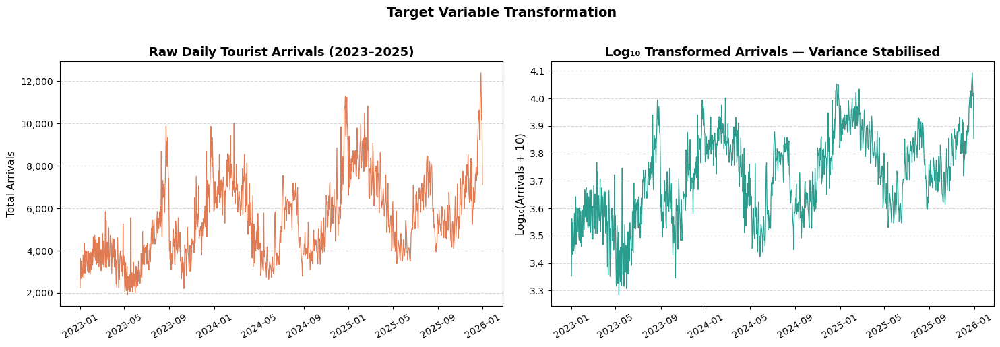

Figure 3.1 saved.


In [5]:
# ── Variance Stabilisation Figure ─────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].plot(df.index, df['Count'], color='#E07B54', linewidth=0.9)
axes[0].set_title('Raw Daily Tourist Arrivals (2023–2025)', fontsize=13, fontweight='bold')
axes[0].set_ylabel('Total Arrivals', fontsize=11)
axes[0].yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{int(x):,}'))
axes[0].grid(axis='y', linestyle='--', alpha=0.5)

axes[1].plot(df.index, df['Arrivals_Log10'], color='#2A9D8F', linewidth=0.9)
axes[1].set_title('Log₁₀ Transformed Arrivals — Variance Stabilised', fontsize=13, fontweight='bold')
axes[1].set_ylabel('Log₁₀(Arrivals + 10)', fontsize=11)
axes[1].grid(axis='y', linestyle='--', alpha=0.5)

for ax in axes:
    ax.tick_params(axis='x', rotation=30)

plt.suptitle('Target Variable Transformation', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('outputs/figures/3_1_Variance_Stabilisation.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 3.1 saved.')

## Code Walk-Through: Stationarity and Structural Break Detection
**What this code does:** Runs ADF/KPSS tests, performs rolling Chow scans with FDR correction, selects separated breakpoints, and builds regime statistics.
**What this shows:** The target is non-stationary and structurally unstable, with statistically meaningful break dates used later for stress testing.

In [6]:
import statsmodels.api as sm
from scipy.stats import f
from statsmodels.stats.diagnostic import breaks_cusumolsresid
from statsmodels.stats.multitest import multipletests
from statsmodels.tsa.stattools import adfuller, kpss

series = df['Arrivals_Log10'].dropna().copy()
series.index = pd.to_datetime(series.index)
series = series.sort_index()

# Load daily Google Trends data; fall back to weekly if the daily file is absent.
try:
    trends = pd.read_csv('data/Google_Trends_Normalized_Daily_2023_2025.csv')
    print('Loaded daily Google Trends data.')
except FileNotFoundError:
    trends = pd.read_csv('data/Google_Trends_Localized_Weekly_2023_2025.csv')
    print('Daily Google Trends file not found; using weekly fallback.')

trends['Date'] = pd.to_datetime(trends['date'])
trends = trends.drop(columns=['date']).set_index('Date')

# ── Stationarity Report ────────────────────────────────────────────────────
def stationarity_report(s):
    adf_p = adfuller(s, autolag='AIC')[1]
    try:
        kpss_p = kpss(s, regression='c', nlags='auto')[1]
    except Exception:
        kpss_p = np.nan
    return pd.DataFrame([{
        'Series': 'Arrivals_Log10',
        'ADF_p_value': round(adf_p, 6),
        'KPSS_p_value': round(kpss_p, 4) if pd.notna(kpss_p) else np.nan,
        'ADF_stationary_5pct': bool(adf_p < 0.05),
        'KPSS_stationary_5pct': bool(kpss_p >= 0.05) if pd.notna(kpss_p) else False
    }])

# ── Design Matrix (trend + day-of-week dummies) ────────────────────────────
def build_design(index):
    X = pd.DataFrame({'trend': np.arange(len(index), dtype=float)}, index=index)
    dow = pd.get_dummies(index.dayofweek, prefix='dow', drop_first=True, dtype=float)
    dow.index = index
    return sm.add_constant(pd.concat([X, dow], axis=1))

# ── Chow Scan ─────────────────────────────────────────────────────────────
def chow_scan(y, edge_days=90, step_days=7, min_obs=60):
    X = build_design(y.index)
    k = int(X.shape[1])
    min_req = max(min_obs, k + 5)
    ssr_full = float(np.sum(sm.OLS(y, X).fit().resid ** 2))
    rows = []
    for date in y.index[edge_days:-edge_days:step_days]:
        lm, rm = y.index <= date, y.index > date
        if lm.sum() < min_req or rm.sum() < min_req:
            continue
        ssr_split = (float(np.sum(sm.OLS(y[lm], X[lm]).fit().resid ** 2)) +
                     float(np.sum(sm.OLS(y[rm], X[rm]).fit().resid ** 2)))
        ddf = lm.sum() + rm.sum() - 2 * k
        if ddf <= 0:
            continue
        f_stat = ((ssr_full - ssr_split) / k) / (ssr_split / ddf)
        rows.append({'break_date': pd.to_datetime(date), 'F_stat': f_stat,
                     'p_value': 1 - f.cdf(f_stat, k, ddf)})
    out = pd.DataFrame(rows).sort_values('p_value').reset_index(drop=True)
    if not out.empty:
        rej, p_adj, *_ = multipletests(out['p_value'], alpha=0.05, method='fdr_bh')
        out['p_adj'] = p_adj
        out['significant_5pct'] = rej
    return out

# ── Break Selection with Temporal-Coverage Constraint ─────────────────────
def select_breaks(chow_df, max_breaks=4, min_gap_days=120):
    ranked = chow_df.copy()
    if 'significant_5pct' in ranked.columns:
        sig = ranked[ranked['significant_5pct']]
        if not sig.empty:
            ranked = sig
    ranked = ranked.sort_values(['F_stat', 'p_value'], ascending=[False, True])
    selected = []
    for _, row in ranked.iterrows():
        d = pd.to_datetime(row['break_date'])
        if all(abs((d - s).days) >= min_gap_days for s in selected):
            selected.append(d)
        if len(selected) >= max_breaks:
            break
    return sorted(selected)

# ── Build Regimes ──────────────────────────────────────────────────────────
def build_regimes(y, break_dates):
    bounds = [y.index.min()] + sorted(break_dates) + [y.index.max()]
    regime_rows, map_rows = [], []
    for i in range(len(bounds) - 1):
        s, e = bounds[i], bounds[i + 1]
        seg = y.loc[(y.index >= s) & (y.index <= e)] if i == len(bounds) - 2 else y.loc[(y.index >= s) & (y.index < e)]
        if seg.empty:
            continue
        slope = sm.OLS(seg.values, sm.add_constant(np.arange(len(seg), dtype=float))).fit().params[1]
        name = f'Regime_{i + 1}'
        regime_rows.append({'Regime': name, 'start_date': seg.index.min(), 'end_date': seg.index.max(),
                            'days': len(seg), 'mean_log_arrivals': seg.mean(),
                            'std_log_arrivals': seg.std(), 'trend_slope_per_day': slope})
        map_rows.append(pd.DataFrame({'Date': seg.index, 'Regime': name}))
    return pd.DataFrame(regime_rows), pd.concat(map_rows).set_index('Date').sort_index()

# ── Run — FULL series for regime discovery ────────────────────────────────
# Regimes are detected on the entire 2023-2025 series so the breakpoints
# describe the full sample. Granger/CCF and model fitting stay train-only downstream.
stationarity_df = stationarity_report(series)
chow_results = chow_scan(series, edge_days=90, step_days=7, min_obs=60)
selected_breaks = select_breaks(chow_results, max_breaks=4, min_gap_days=120)
regime_stats, regime_map = build_regimes(series, selected_breaks)

# ── Break Impact (30-day window) ──────────────────────────────────────────
break_impact_rows = []
for d in selected_breaks:
    pre  = series.loc[(series.index >= d - pd.Timedelta(days=30)) & (series.index < d)]
    post = series.loc[(series.index >  d) & (series.index <= d + pd.Timedelta(days=30))]
    delta = post.mean() - pre.mean() if len(pre) and len(post) else np.nan
    pct   = delta / abs(pre.mean()) * 100 if pd.notna(delta) and pre.mean() != 0 else np.nan
    break_impact_rows.append({'break_date': d, 'pre_mean_log': pre.mean(), 'post_mean_log': post.mean(),
                               'delta_log': delta, 'delta_pct_of_pre_mean': pct})
break_impact = pd.DataFrame(break_impact_rows)

# ── CUSUM — FULL series diagnostic ────────────────────────────────────────
X_full_sb = build_design(series.index)
ols_full_sb = sm.OLS(series, X_full_sb).fit()
cusum_stat, cusum_p, _ = breaks_cusumolsresid(ols_full_sb.resid, ddof=int(X_full_sb.shape[1]))

print(f'CUSUM Stability — statistic: {cusum_stat:.4f}  p-value: {cusum_p:.2e}')
print(f'\nStationarity report:')
display(stationarity_df)
print(f'\nSelected structural breakpoints:')
for i, d in enumerate(selected_breaks, 1):
    print(f'  Break {i}: {d.strftime("%Y-%m-%d")}')
print('\nRegime diagnostics:')
display(regime_stats)
print('\n30-day pre/post impact:')
display(break_impact)

Loaded daily Google Trends data.


C:\Users\User\AppData\Local\Temp\ipykernel_14888\3442491873.py:26: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_p = kpss(s, regression='c', nlags='auto')[1]


CUSUM Stability — statistic: 3.2616  p-value: 1.15e-09

Stationarity report:


,Series,ADF_p_value,KPSS_p_value,ADF_stationary_5pct,KPSS_stationary_5pct
0,Arrivals_Log10,0.138345,0.01,False,False



Selected structural breakpoints:
  Break 1: 2023-07-08
  Break 2: 2023-11-11
  Break 3: 2024-03-30
  Break 4: 2025-04-19

Regime diagnostics:


,Regime,start_date,end_date,days,mean_log_arrivals,std_log_arrivals,trend_slope_per_day
0,Regime_1,2023-01-01,2023-07-07,188,3.529546,0.096716,-0.000386
1,Regime_2,2023-07-08,2023-11-10,126,3.664004,0.124178,-0.001462
2,Regime_3,2023-11-11,2024-03-29,140,3.820579,0.075723,0.000800
3,Regime_4,2024-03-30,2025-04-18,385,3.746835,0.145445,0.000852
4,Regime_5,2025-04-19,2025-12-31,257,3.759505,0.113745,0.000925



30-day pre/post impact:


,break_date,pre_mean_log,post_mean_log,delta_log,delta_pct_of_pre_mean
0,2023-07-08,3.542900,3.687349,0.144449,4.077134
1,2023-11-11,3.595376,3.732782,0.137407,3.821766
2,2024-03-30,3.827509,3.693345,-0.134163,-3.505240
3,2025-04-19,3.820903,3.665516,-0.155386,-4.066739


## Code Walk-Through: Break Diagnostics Visualization
**What this code does:** Visualizes Chow F-statistics over time with annotated breakpoints and regime shading.
**What this shows:** Break intensity clusters around selected dates, making regime transitions interpretable before model building.

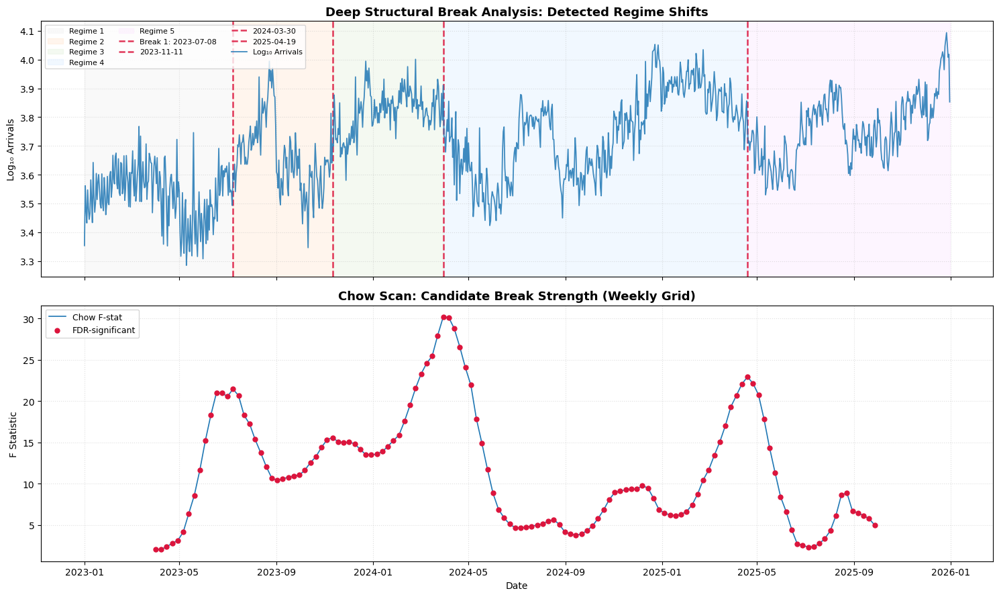

Figure 3.2 saved.


In [7]:
# ── Save CSVs ──────────────────────────────────────────────────────────────
chow_out = chow_results.copy()
chow_out['break_date'] = chow_out['break_date'].dt.strftime('%Y-%m-%d')
chow_out.to_csv('outputs/csv/Structural_Break_Chow_Scan.csv', index=False)
pd.DataFrame({'break_date': [d.strftime('%Y-%m-%d') for d in selected_breaks]}).to_csv(
    'outputs/csv/Structural_Break_Selected_Points.csv', index=False)
regime_stats.to_csv('outputs/csv/Structural_Break_Regime_Stats.csv', index=False)
regime_map.reset_index().to_csv('outputs/csv/Structural_Break_Regime_Map.csv', index=False)
break_impact.to_csv('outputs/csv/Structural_Break_Impact_30Day.csv', index=False)

# ── Figure 3.2: Deep Structural Break Diagnostics ─────────────────────────
palette = ['#f0f0f0', '#ffe5cc', '#e2f0d9', '#d9ecff', '#fce5ff']
scan_plot = chow_results.sort_values('break_date').reset_index(drop=True)

fig, axes = plt.subplots(2, 1, figsize=(15, 9), sharex=True)

bounds = [series.index.min()] + selected_breaks + [series.index.max()]
for i in range(len(bounds) - 1):
    axes[0].axvspan(bounds[i], bounds[i + 1], color=palette[i % len(palette)], alpha=0.35,
                    label=f'Regime {i + 1}')
for i, d in enumerate(selected_breaks):
    axes[0].axvline(d, color='crimson', linestyle='--', linewidth=1.8, alpha=0.85,
                    label=f'Break {i + 1}: {d.strftime("%Y-%m-%d")}' if i == 0 else d.strftime('%Y-%m-%d'))
axes[0].plot(series.index, series.values, color='#1f77b4', linewidth=1.3, alpha=0.85, label='Log₁₀ Arrivals')
axes[0].set_title('Deep Structural Break Analysis: Detected Regime Shifts',
                  fontsize=13, fontweight='bold')
axes[0].set_ylabel('Log₁₀ Arrivals')
axes[0].grid(True, linestyle=':', alpha=0.4)
axes[0].legend(loc='upper left', ncol=3, fontsize=8)

if not scan_plot.empty:
    axes[1].plot(scan_plot['break_date'], scan_plot['F_stat'], color='tab:blue', linewidth=1.2, label='Chow F-stat')
    sig_mask = scan_plot['significant_5pct'] if 'significant_5pct' in scan_plot else pd.Series([False] * len(scan_plot))
    if sig_mask.any():
        axes[1].scatter(scan_plot.loc[sig_mask, 'break_date'], scan_plot.loc[sig_mask, 'F_stat'],
                        color='crimson', s=25, zorder=5, label='FDR-significant')
axes[1].set_title('Chow Scan: Candidate Break Strength (Weekly Grid)', fontsize=13, fontweight='bold')
axes[1].set_ylabel('F Statistic')
axes[1].set_xlabel('Date')
axes[1].grid(True, linestyle=':', alpha=0.4)
axes[1].legend(loc='upper left', fontsize=9)

plt.tight_layout()
plt.savefig('outputs/figures/3_2_Structural_Break_Diagnostics.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 3.2 saved.')

## Code Walk-Through: Scaling and Export of Preprocessed Panel
**What this code does:** Fits MinMax scaling using only the training window, applies it for EDA-ready variables, and exports the cleaned daily dataset.
**What this shows:** A leakage-safe preprocessed dataset is generated for downstream feature engineering and reproducibility.

In [8]:
# ── EDA-Specific Scaling (Min-Max) — ONLY for correlation visualisation ────
# The ML pipeline uses Robust Scaling applied strictly inside expanding training windows
# to prevent data leakage.
eda_df = df.copy()
scaler_mm = MinMaxScaler()
cols_to_scale = (['USD_LKR_Rate', 'Colombo_Temp_C', 'Colombo_Precip_mm']
                 + list(trends.columns)
                 + ['Yandex_RU_Tour', 'Yandex_RU_Flights'])
cols_to_scale = [c for c in cols_to_scale if c in eda_df.columns]

# ── Fit scaler on TRAINING window only, then transform full series ────────
# This prevents min/max statistics from 2025 influencing the scaling.
train_mask_mm = eda_df.index <= TRAIN_END
eda_df.loc[train_mask_mm,  cols_to_scale] = scaler_mm.fit_transform(
    eda_df.loc[train_mask_mm, cols_to_scale])
eda_df.loc[~train_mask_mm, cols_to_scale] = scaler_mm.transform(
    eda_df.loc[~train_mask_mm, cols_to_scale])

eda_df.to_csv('outputs/csv/Preprocessed_Daily_Tourism_Data_2023_2025.csv')
print('EDA dataset preprocessed and saved: Preprocessed_Daily_Tourism_Data_2023_2025.csv')
print(f'MinMaxScaler fitted on training window only (≤ {TRAIN_END}) to prevent leakage.')

EDA dataset preprocessed and saved: Preprocessed_Daily_Tourism_Data_2023_2025.csv
MinMaxScaler fitted on training window only (≤ 2024-06-29) to prevent leakage.


## Code Walk-Through: Weekly Seasonal Decomposition
**What this code does:** Performs classical additive decomposition with period 7 to separate observed, trend, seasonal, and residual components.
**What this shows:** A clear weekly pattern and evolving trend are visible, consistent with tourism seasonality and regime changes.

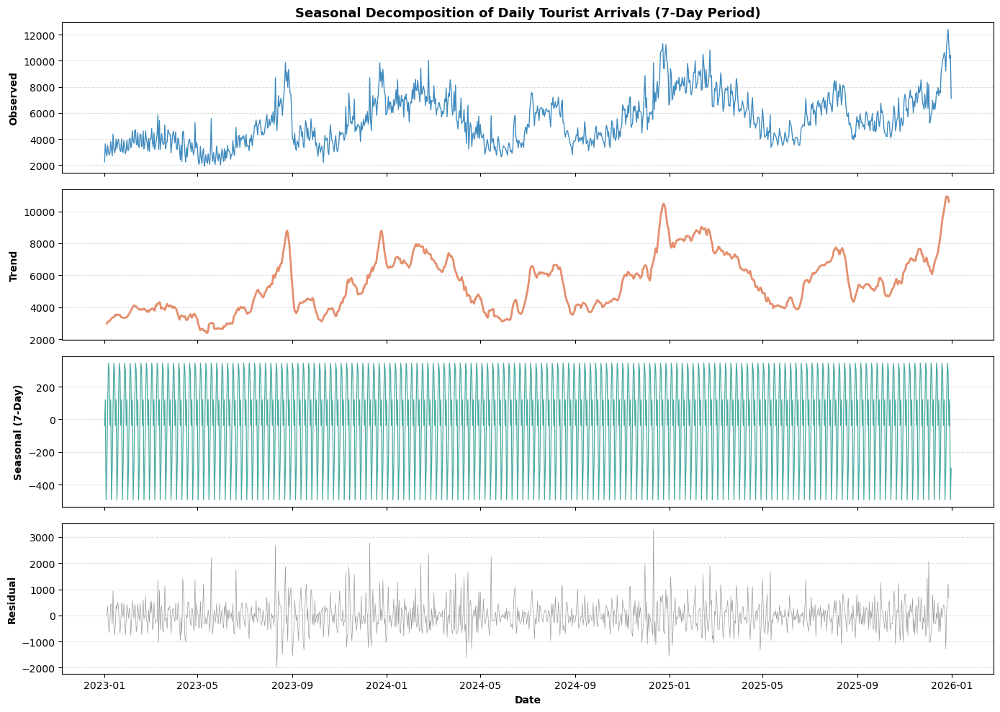

Weekly seasonal weights (first cycle):
Date
2023-01-01    -38.810970
2023-01-02    120.240029
2023-01-03   -493.378404
2023-01-04   -299.043570
2023-01-05     72.298921
2023-01-06    343.953682
2023-01-07    294.740312


In [9]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

df = pd.read_csv('outputs/csv/Preprocessed_Daily_Tourism_Data_2023_2025.csv',
                 index_col='Date', parse_dates=True)

# ── Seasonal Decomposition ─────────────────────────────────────────────────
decomp = seasonal_decompose(df['Count'].dropna(), model='additive', period=7)

fig, axes = plt.subplots(4, 1, figsize=(14, 10), sharex=True)
styles = [('#1f77b4', 'Observed'), ('#E07B54', 'Trend'),
          ('#2A9D8F', 'Seasonal (7-Day)'), ('#888888', 'Residual')]
data   = [decomp.observed, decomp.trend, decomp.seasonal, decomp.resid]
lws    = [1.0, 2.0, 0.9, 0.5]

for ax, (col, label), d, lw in zip(axes, styles, data, lws):
    ax.plot(d.index, d.values, color=col, linewidth=lw, alpha=0.85)
    ax.set_ylabel(label, fontweight='bold', fontsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.4)

axes[0].set_title('Seasonal Decomposition of Daily Tourist Arrivals (7-Day Period)',
                  fontsize=13, fontweight='bold')
axes[-1].set_xlabel('Date', fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/figures/4_1_Seasonal_Decomposition.png', dpi=300, bbox_inches='tight')
plt.show()

print('Weekly seasonal weights (first cycle):')
print(decomp.seasonal.head(7).to_string())

## Code Walk-Through: ACF and PACF Diagnostics
**What this code does:** Computes and plots ACF/PACF up to 35 lags, highlighting lags such as 1, 2, 7, and 14.
**What this shows:** Strong short-memory and weekly periodic dependence, guiding autoregressive lag design in feature matrices.

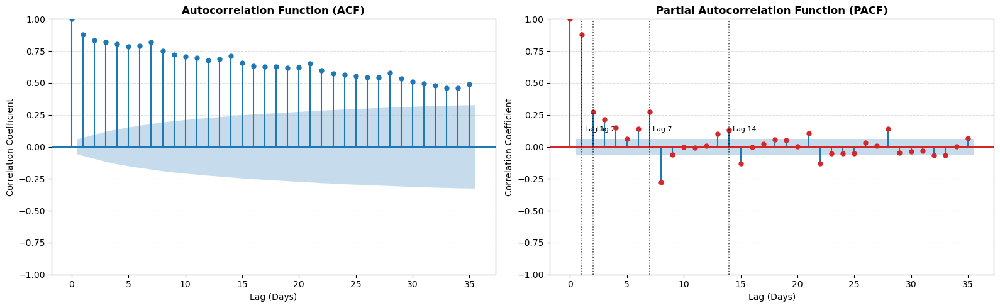

ACF/PACF plot saved. Key autoregressive lags confirmed: 1, 2, 7, 14.


In [10]:
# ── ACF & PACF ────────────────────────────────────────────────────────────
target_series = df['Arrivals_Log10'].dropna()

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
plot_acf(target_series,  lags=35, ax=axes[0], color='#1f77b4', alpha=0.05)
plot_pacf(target_series, lags=35, ax=axes[1], color='#D62728', method='ywm', alpha=0.05)

axes[0].set_title('Autocorrelation Function (ACF)', fontsize=12, fontweight='bold')
axes[1].set_title('Partial Autocorrelation Function (PACF)', fontsize=12, fontweight='bold')

for ax in axes:
    ax.set_xlabel('Lag (Days)')
    ax.set_ylabel('Correlation Coefficient')
    ax.grid(axis='y', linestyle='--', alpha=0.4)

for lag in [1, 2, 7, 14]:
    axes[1].axvline(x=lag, color='black', linestyle=':', alpha=0.7, linewidth=1.2)
    axes[1].annotate(f'Lag {lag}', xy=(lag, 0.05), xytext=(lag + 0.3, 0.12),
                     fontsize=8, color='black')

plt.tight_layout()
plt.savefig('outputs/figures/4_2_ACF_PACF.png', dpi=300, bbox_inches='tight')
plt.show()
print('ACF/PACF plot saved. Key autoregressive lags confirmed: 1, 2, 7, 14.')

## Code Walk-Through: Weekly Granger Causality Grid
**What this code does:** Runs pairwise Granger tests (lags 1 to 12 weeks), applies FDR correction, and summarizes best-lag evidence per feature.
**What this shows:** Most signals are weak after multiple-testing control, while a subset with low raw p-values is retained for exploratory CCF filtering.

In [11]:
import seaborn as sns
from statsmodels.tsa.stattools import grangercausalitytests, adfuller, kpss
from statsmodels.stats.multitest import multipletests

alpha        = 0.05
max_lag_wks  = 12
target_col   = 'Arrivals_Log10'

# Load dataset and RESTRICT TO TRAINING WINDOW (leakage prevention)
# Granger tests must only use training data (2023-2024) to avoid
# contaminating feature selection with future (2025) information.
df_raw = pd.read_csv('outputs/csv/Preprocessed_Daily_Tourism_Data_2023_2025.csv',
                     index_col='Date', parse_dates=True)
df_raw = df_raw.loc[:TRAIN_END]  # training window only
print(f"Granger restricted to training window: {df_raw.index.min().date()} → {df_raw.index.max().date()}")

if target_col not in df_raw.columns:
    raise ValueError(f"Target column '{target_col}' not found in dataset.")

default_features = [
    '_SriLankatravel', '_SriLankaflights', '_SriLankaVisa',
    'GB_SriLankaholidays', 'GB_SriLankaETA',
    'DE_SriLankaUrlaub', 'DE_FlügeColombo',
    'IN_SriLankatourpackage', 'IN_Colomboflight',
    'RU_Шри-Ланкатур', 'RU_авиабилетыКоломбо',
    'Yandex_RU_Tour', 'Yandex_RU_Flights'
 ]

# Resolve common naming variants (umlaut vs ASCII / transliteration)
feature_aliases = {
    'DE_FlügeColombo': 'DE_FlugeColombo',
    'RU_Шри-Ланкатур': 'RU_SriLankatour',
    'RU_авиабилетыКоломбо': 'RU_aviabiletyKolombo',
}

resolved = []
for feat in default_features:
    if feat in df_raw.columns:
        resolved.append(feat)
    elif feat in feature_aliases and feature_aliases[feat] in df_raw.columns:
        resolved.append(feature_aliases[feat])

feature_candidates = list(dict.fromkeys(resolved))

# Include all RU_* columns found in the preprocessed matrix to ensure
# Google-RU signals are treated exactly like all other trend features.
ru_google_auto = sorted([c for c in df_raw.columns if c.startswith('RU_')])
for feat in ru_google_auto:
    if feat not in feature_candidates:
        feature_candidates.append(feat)

# Fallback discovery in case all configured names are missing
if not feature_candidates:
    fallback_prefixes = ('_SriLanka', 'GB_', 'DE_', 'IN_', 'RU_', 'Yandex_')
    feature_candidates = sorted([
        c for c in df_raw.columns
        if c not in [target_col, 'Count'] and c.startswith(fallback_prefixes)
    ])

if not feature_candidates:
    raise ValueError('No candidate exogenous features found for Granger testing.')

ru_google_candidates = [f for f in feature_candidates if f.startswith('RU_')]
ru_yandex_candidates = [f for f in feature_candidates if f.startswith('Yandex_RU_')]

print(f'Features selected for Granger testing ({len(feature_candidates)}): {feature_candidates}')
print(f'Russian candidates | Google Trends: {ru_google_candidates} | Yandex: {ru_yandex_candidates}')

# ── Build true weekly dataset ──────────────────────────────────────────────
def build_weekly(daily_df, features, target, min_obs=22):
    if 'Count' in daily_df.columns:
        target_series = pd.to_numeric(daily_df['Count'], errors='coerce')
        target_w = np.log10(target_series.resample('W').sum() + 10)
    else:
        target_w = pd.to_numeric(daily_df[target], errors='coerce').resample('W').mean()

    w = pd.DataFrame({target: target_w})
    valid_features = []
    dropped_features = []

    for f in features:
        s = pd.to_numeric(daily_df[f], errors='coerce').resample('W').mean()
        n_obs = int(s.notna().sum())
        if n_obs >= min_obs:
            w[f] = s
            valid_features.append(f)
        else:
            dropped_features.append((f, n_obs))

    w = w.replace([np.inf, -np.inf], np.nan).sort_index()
    return w, valid_features, dropped_features

weekly_df, feature_candidates, dropped_weekly = build_weekly(
    df_raw, feature_candidates, target_col, min_obs=max_lag_wks + 10
)

if dropped_weekly:
    print('Features dropped at weekly stage (insufficient usable observations):')
    for feat, n_obs in dropped_weekly:
        print(f'  - {feat}: {n_obs} weekly points')

if not feature_candidates:
    raise ValueError('All features were dropped after weekly conversion. Check data quality/coverage.')

print(f"Weekly observations (target non-null): {int(weekly_df[target_col].notna().sum())}")

# ── Stationarity-aware differencing ───────────────────────────────────────
def stationary_pvals(s):
    s = s.dropna()
    if len(s) < 30:
        return np.nan, np.nan, np.nan, np.nan
    if s.nunique() <= 1:
        return np.nan, np.nan, np.nan, np.nan
    adf_stat, adf_p, *_ = adfuller(s, autolag='AIC')
    try:
        kpss_stat, kpss_p, *_ = kpss(s, regression='c', nlags='auto')
    except Exception:
        kpss_stat, kpss_p = np.nan, np.nan
    return float(adf_stat), float(adf_p), float(kpss_stat) if pd.notna(kpss_stat) else np.nan, float(kpss_p) if pd.notna(kpss_p) else np.nan

transformed = pd.DataFrame(index=weekly_df.index)
stat_rows   = []
for col in [target_col] + feature_candidates:
    adf_stat, adf_p, kpss_stat, kpss_p = stationary_pvals(weekly_df[col])
    diff = (pd.notna(adf_p) and adf_p > alpha) or (pd.notna(kpss_p) and kpss_p < alpha)
    transformed[col] = weekly_df[col].diff() if diff else weekly_df[col]
    stat_rows.append({'series': col, 'adf_stat': adf_stat, 'adf_p': adf_p, 'kpss_stat': kpss_stat, 'kpss_p': kpss_p, 'differenced': diff})

transformed = transformed.sort_index()
stat_df = pd.DataFrame(stat_rows)
stat_df.to_csv('outputs/csv/Granger_Weekly_Stationarity_Report.csv', index=False)

# ── Pairwise Granger tests ─────────────────────────────────────────────────
rows = []
failures = []
for feat in feature_candidates:
    pair = transformed[[target_col, feat]].dropna()

    if len(pair) <= (max_lag_wks + 5):
        failures.append((feat, f'insufficient_obs={len(pair)}'))
        continue
    if pair[target_col].nunique() <= 1 or pair[feat].nunique() <= 1:
        failures.append((feat, 'constant_series'))
        continue

    try:
        gc = grangercausalitytests(pair[[target_col, feat]], maxlag=max_lag_wks, verbose=False)
        for lag in range(1, max_lag_wks + 1):
            rows.append({
                'feature': feat,
                'lag_weeks': lag,
                'p_value': float(gc[lag][0]['ssr_ftest'][1])
            })
    except Exception as e:
        failures.append((feat, str(e)))
        print(f' Could not test {feat}: {e}')

if not rows:
    sample = '; '.join([f'{f}: {msg}' for f, msg in failures[:6]])
    raise ValueError(
        f'No valid Granger rows generated. Checked {len(feature_candidates)} features. '
        f'Example failures: {sample}'
    )

grid_df = pd.DataFrame(rows)
grid_df['q_value'] = multipletests(grid_df['p_value'], alpha=alpha, method='fdr_bh')[1]
grid_df['significant_raw'] = grid_df['p_value'] < alpha
grid_df['significant_fdr'] = grid_df['q_value'] < alpha
grid_df.to_csv('outputs/csv/Granger_Weekly_Pairwise_Grid.csv', index=False)

best_lags = (grid_df.sort_values(['feature', 'q_value', 'p_value', 'lag_weeks'])
             .groupby('feature', as_index=False).first())
best_lags.to_csv('outputs/csv/Granger_Weekly_Best_Lags.csv', index=False)

n_raw = int(grid_df['significant_raw'].sum())
n_fdr = int(grid_df['significant_fdr'].sum())
print(f'Total weekly tests: {len(grid_df)} | Significant (raw p<0.05): {n_raw} | FDR q<0.05: {n_fdr}')

if failures:
    print(f'Features skipped/failed: {len(failures)}')
    for feat, msg in failures:
        print(f'  - {feat}: {msg}')

print('\nStationarity & differencing decisions:')
display(stat_df)
print('\nBest Granger lag per feature → Arrivals_Log10:')
display(best_lags[['feature', 'lag_weeks', 'p_value', 'q_value', 'significant_raw', 'significant_fdr']])

# ── Russian source-bias audit at Granger stage ─────────────────────────────
ru_feature_pool = [f for f in best_lags['feature']
                   if f.startswith('RU_') or f.startswith('Yandex_RU_')]

if ru_feature_pool:
    ru_granger_bias = best_lags[best_lags['feature'].isin(ru_feature_pool)].copy()
    ru_granger_bias['engine'] = np.where(
        ru_granger_bias['feature'].str.startswith('Yandex_RU_'),
        'Yandex',
        'Google Trends'
    )
    ru_granger_bias['support_for_ccf'] = (
        ru_granger_bias['significant_fdr']
        | (ru_granger_bias['p_value'] < 0.20)
    )
    ru_granger_bias['decision_after_granger'] = np.where(
        ru_granger_bias['significant_fdr'],
        'Retain for CCF (FDR-significant)',
        np.where(
            ru_granger_bias['p_value'] < 0.20,
            'Carry to CCF (exploratory raw p<0.20)',
            'Reject (no Granger support)'
        )
    )
    ru_granger_bias = ru_granger_bias[[
        'engine', 'feature', 'lag_weeks', 'p_value', 'q_value',
        'significant_fdr', 'support_for_ccf', 'decision_after_granger'
    ]].sort_values(['engine', 'q_value', 'p_value']).reset_index(drop=True)
    ru_granger_bias.to_csv('outputs/csv/4_2_Russian_Source_Bias_Granger.csv', index=False)

    print('\nRussian source-bias audit (Granger stage):')
    display(ru_granger_bias)

    n_yandex_supported = int(((ru_granger_bias['engine'] == 'Yandex')
                              & (ru_granger_bias['support_for_ccf'])).sum())
    n_google_supported = int(((ru_granger_bias['engine'] == 'Google Trends')
                              & (ru_granger_bias['support_for_ccf'])).sum())
    print(f'Summary | Yandex supported for CCF: {n_yandex_supported} | Google-RU supported for CCF: {n_google_supported}')
else:
    ru_granger_bias = pd.DataFrame()
    print('No Russian-source features available for Granger bias audit.')

Granger restricted to training window: 2023-01-01 → 2024-06-29
Features selected for Granger testing (13): ['_SriLankatravel', '_SriLankaflights', '_SriLankaVisa', 'GB_SriLankaholidays', 'GB_SriLankaETA', 'DE_SriLankaUrlaub', 'DE_FlügeColombo', 'IN_SriLankatourpackage', 'IN_Colomboflight', 'RU_Шри-Ланкатур', 'RU_авиабилетыКоломбо', 'Yandex_RU_Tour', 'Yandex_RU_Flights']
Russian candidates | Google Trends: ['RU_Шри-Ланкатур', 'RU_авиабилетыКоломбо'] | Yandex: ['Yandex_RU_Tour', 'Yandex_RU_Flights']
Weekly observations (target non-null): 79


C:\Users\User\AppData\Local\Temp\ipykernel_14888\210574380.py:116: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_stat, kpss_p, *_ = kpss(s, regression='c', nlags='auto')
C:\Users\User\AppData\Local\Temp\ipykernel_14888\210574380.py:116: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_stat, kpss_p, *_ = kpss(s, regression='c', nlags='auto')
C:\Users\User\AppData\Local\Temp\ipykernel_14888\210574380.py:116: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_stat, kpss_p, *_ = kpss(s, regression='c', nlags='auto')
C:\Users\User\AppData\Local\Temp\ipykernel_14888\210574380.py:116: InterpolationWarning: The test statisti

Total weekly tests: 132 | Significant (raw p<0.05): 10 | FDR q<0.05: 0
Features skipped/failed: 2
  - RU_Шри-Ланкатур: constant_series
  - RU_авиабилетыКоломбо: constant_series

Stationarity & differencing decisions:


,series,adf_stat,adf_p,kpss_stat,kpss_p,differenced
0,Arrivals_Log10,-8.205794,7.030704e-13,0.703395,0.013237,True
1,_SriLankatravel,-2.724333,6.992145e-02,0.340935,0.100000,True
2,_SriLankaflights,-3.028242,3.233977e-02,0.343367,0.100000,False
3,_SriLankaVisa,-3.751530,3.444029e-03,0.437405,0.061032,False
4,GB_SriLankaholidays,-5.370352,3.908296e-06,0.204087,0.100000,False
5,GB_SriLankaETA,-8.946199,8.974859e-15,0.110358,0.100000,False
6,DE_SriLankaUrlaub,-2.919970,4.307457e-02,0.596982,0.022911,True
7,DE_FlügeColombo,-72.525057,0.000000e+00,0.312765,0.100000,False
8,IN_SriLankatourpackage,-5.280661,6.004000e-06,0.160757,0.100000,False
9,IN_Colomboflight,-5.405217,3.302784e-06,0.261846,0.100000,False



Best Granger lag per feature → Arrivals_Log10:


,feature,lag_weeks,p_value,q_value,significant_raw,significant_fdr
0,DE_FlügeColombo,3,0.122335,0.897125,False,False
1,DE_SriLankaUrlaub,1,0.501430,0.993359,False,False
2,GB_SriLankaETA,10,0.001464,0.146954,True,False
3,GB_SriLankaholidays,2,0.648818,0.993359,False,False
4,IN_Colomboflight,12,0.017465,0.288167,True,False
5,IN_SriLankatourpackage,12,0.068206,0.712293,False,False
6,Yandex_RU_Flights,4,0.067877,0.712293,False,False
7,Yandex_RU_Tour,4,0.102522,0.845806,False,False
8,_SriLankaVisa,12,0.508673,0.993359,False,False
9,_SriLankaflights,12,0.446991,0.989823,False,False



Russian source-bias audit (Granger stage):


,engine,feature,lag_weeks,p_value,q_value,significant_fdr,support_for_ccf,decision_after_granger
0,Yandex,Yandex_RU_Flights,4,0.067877,0.712293,False,True,Carry to CCF (exploratory raw p<0.20)
1,Yandex,Yandex_RU_Tour,4,0.102522,0.845806,False,True,Carry to CCF (exploratory raw p<0.20)


Summary | Yandex supported for CCF: 2 | Google-RU supported for CCF: 0


## Code Walk-Through: Granger Significance Heatmaps
**What this code does:** Visualizes raw p-values, FDR-adjusted q-values, and significance masks across features and weekly lags.
**What this shows:** Diagnostic heatmaps make underpowered regions and candidate leading indicators easy to inspect.

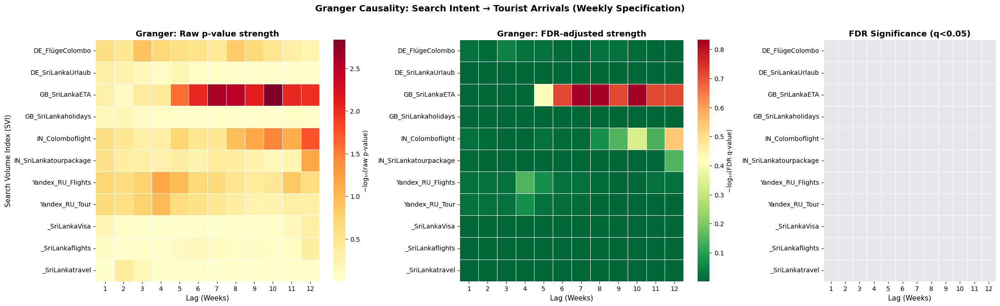

Figure 4.3 saved.


In [12]:
# ── Figure 4.3: Granger Causality Heatmap (Triple Panel) ──────────────────
p_mat   = grid_df.pivot(index='feature', columns='lag_weeks', values='p_value').sort_index()
q_mat   = grid_df.pivot(index='feature', columns='lag_weeks', values='q_value').sort_index()
sig_mat = (q_mat < alpha).astype(int)
logp    = -np.log10(np.clip(p_mat, 1e-12, 1.0))
logq    = -np.log10(np.clip(q_mat, 1e-12, 1.0))

fig, axes = plt.subplots(1, 3, figsize=(22, max(6, 0.6 * len(p_mat))),
                         gridspec_kw={'width_ratios': [1.3, 1.3, 0.8]})

sns.heatmap(logp, cmap='YlOrRd', linewidths=0.5, linecolor='white',
            cbar_kws={'label': '−log₁₀(raw p-value)'}, ax=axes[0])
axes[0].set_title('Granger: Raw p-value strength', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Lag (Weeks)', fontsize=11)
axes[0].set_ylabel('Search Volume Index (SVI)', fontsize=11)

sns.heatmap(logq, cmap='RdYlGn_r', linewidths=0.5, linecolor='white',
            cbar_kws={'label': '−log₁₀(FDR q-value)'}, ax=axes[1])
axes[1].set_title('Granger: FDR-adjusted strength', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Lag (Weeks)', fontsize=11)
axes[1].set_ylabel('')

sig_annot = sig_mat.replace({1: 'Sig', 0: ''})
sns.heatmap(sig_mat, annot=sig_annot, fmt='', cmap=sns.color_palette(['#e5e7eb', '#16a34a'], as_cmap=True),
            vmin=0, vmax=1, linewidths=0.5, linecolor='white', cbar=False, ax=axes[2])
axes[2].set_title(f'FDR Significance (q<{alpha})', fontsize=13, fontweight='bold')
axes[2].set_xlabel('Lag (Weeks)', fontsize=11)
axes[2].set_ylabel('')

plt.suptitle('Granger Causality: Search Intent → Tourist Arrivals (Weekly Specification)',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('outputs/figures/4_3_Granger_Causality_Heatmap.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 4.3 saved.')

## Code Walk-Through: Training-Window CCF Screening
**What this code does:** Computes cross-correlations between shifted exogenous features and arrivals across daily lags, then extracts each feature’s strongest lag/correlation.
**What this shows:** Peak-lag structure highlights which external signals move in sync with arrivals and are worth retaining.

In [13]:
# ── CCF on TRAINING window only (leakage prevention) ────────────────────────
df_train_ccf = df.loc[:TRAIN_END].copy()
df_train_ccf = df_train_ccf.loc[:, ~df_train_ccf.columns.duplicated()].copy()

# Shared variables used by later CCF/feature-screening cells.
max_lag = 35
target = target_col
lags_arr = np.arange(0, max_lag + 1)

# Build a Granger support map if the earlier section has not been rerun yet.
support_map = globals().get('granger_support_map')
if not isinstance(support_map, dict):
    support_map = {}
    if 'best_lags' in globals() and isinstance(best_lags, pd.DataFrame) and not best_lags.empty:
        for _, r in best_lags.iterrows():
            feat = r.get('feature')
            fdr_ok = bool(r.get('significant_fdr', False))
            p_val = r.get('p_value', np.nan)
            exploratory_ok = pd.notna(p_val) and float(p_val) < 0.20
            support_map[feat] = bool(fdr_ok or exploratory_ok)
    else:
        feature_candidates = [c for c in feature_candidates if c in df_train_ccf.columns]
        for feat in feature_candidates:
            support_map[feat] = True

if 'min_abs_ccf_for_retention' not in globals():
    min_abs_ccf_for_retention = 0.10

def safe_ccf(x, y, max_lag=35):
    x = pd.Series(x).replace([np.inf, -np.inf], np.nan).dropna()
    y = pd.Series(y).replace([np.inf, -np.inf], np.nan).dropna()
    common = x.index.intersection(y.index)
    x = x.loc[common]
    y = y.loc[common]
    if len(x) == 0 or len(y) == 0 or x.nunique(dropna=True) < 2 or y.nunique(dropna=True) < 2:
        return np.full(max_lag + 1, np.nan)
    x = (x - x.mean()) / (x.std(ddof=0) or 1.0)
    y = (y - y.mean()) / (y.std(ddof=0) or 1.0)
    return np.array([x.corr(y.shift(lag)) for lag in range(max_lag + 1)])

feature_candidates = [c for c in feature_candidates if c in df_train_ccf.columns]

ccf_summary_rows = []
peak_lags = {}
constant_ccf_features = []

for feat in feature_candidates:
    x = df_train_ccf[feat].astype(float)
    if x.nunique(dropna=True) < 2:
        constant_ccf_features.append(feat)
        peak_lags[feat] = np.nan
        ccf_summary_rows.append({
            'feature': feat,
            'best_lag_days': np.nan,
            'best_corr': np.nan,
            'abs_best_corr': np.nan
        })
        continue

    ccf_vals = safe_ccf(x, df_train_ccf[target_col].astype(float), max_lag=max_lag)
    if np.all(np.isnan(ccf_vals)):
        peak_lags[feat] = np.nan
        ccf_summary_rows.append({
            'feature': feat,
            'best_lag_days': np.nan,
            'best_corr': np.nan,
            'abs_best_corr': np.nan
        })
        continue

    idx = int(np.nanargmax(np.abs(ccf_vals)))
    peak = float(ccf_vals[idx])
    peak_lags[feat] = idx
    ccf_summary_rows.append({
        'feature': feat,
        'best_lag_days': float(idx),
        'best_corr': peak,
        'abs_best_corr': abs(peak)
    })

ccf_summary_df = pd.DataFrame(ccf_summary_rows)
ccf_summary_df.to_csv('outputs/csv/CCF_Peak_Summary_Training.csv', index=False)

# Expose the lag map using the name expected by downstream cells.
best_lags_ccf = peak_lags.copy()

# Granger support map from the previous section is used here to decide retention.
ru_google_features = [c for c in df_train_ccf.columns if c.startswith('RU_')]
ru_yandex_features = [c for c in df_train_ccf.columns if c.startswith('Yandex_RU_')]

ru_bias_ccf_rows = []
rejected_google_ru = []
retained_yandex_ru = []
winning_features = []

for feat in ru_google_features + ru_yandex_features:
    row = ccf_summary_df.loc[ccf_summary_df['feature'] == feat]
    best_lag = row['best_lag_days'].iloc[0] if not row.empty else np.nan
    best_corr = row['best_corr'].iloc[0] if not row.empty else np.nan
    abs_best_corr = row['abs_best_corr'].iloc[0] if not row.empty else np.nan
    supported = bool(support_map.get(feat, False))
    is_constant = feat in constant_ccf_features
    retain = bool((not is_constant) and supported and pd.notna(abs_best_corr) and abs_best_corr >= min_abs_ccf_for_retention)
    decision = (
        'Reject (constant / no variation in source data)' if is_constant else
        'Retain (CCF-strong + Granger-supported)' if retain else
        'Reject (weak and/or unsupported in Granger)'
    )
    if feat.startswith('RU_') and not feat.startswith('Yandex_RU_'):
        rejected_google_ru.append(feat)
    if feat.startswith('Yandex_RU_') and retain:
        retained_yandex_ru.append(feat)
    if retain:
        winning_features.append(feat)
    ru_bias_ccf_rows.append({
        'engine': 'Yandex' if feat.startswith('Yandex_RU_') else 'Google Trends',
        'feature': feat,
        'best_lag_days': best_lag,
        'best_corr': best_corr,
        'abs_best_corr': abs_best_corr,
        'granger_support_for_ccf': supported,
        'retain_for_models': retain,
        'decision_after_ccf': decision
    })

# Keep the retained daily search-intent features available to later cells.
exog_features = feature_candidates.copy()

granger_support_map = support_map

ru_bias_ccf = pd.DataFrame(ru_bias_ccf_rows)
ru_bias_ccf.to_csv('outputs/csv/4_3_Russian_Source_Bias_CCF.csv', index=False)

print('Russian CCF bias audit:')
display(ru_bias_ccf)

if constant_ccf_features:
    print('Constant / no-variation features detected:')
    for feat in constant_ccf_features:
        print(f'  - {feat}')

print('Rejected Google RU features:', rejected_google_ru)
print('Retained Yandex RU features:', retained_yandex_ru)
print(f'Feature selection summary: {len(winning_features)} retained / {len(feature_candidates)} candidates')

Russian CCF bias audit:


,engine,feature,best_lag_days,best_corr,abs_best_corr,granger_support_for_ccf,retain_for_models,decision_after_ccf
0,Google Trends,RU_Шри-Ланкатур,NaN,NaN,NaN,False,False,Reject (constant / no variation in source data)
1,Google Trends,RU_авиабилетыКоломбо,NaN,NaN,NaN,False,False,Reject (constant / no variation in source data)
2,Yandex,Yandex_RU_Tour,0.0,0.284251,0.284251,True,True,Retain (CCF-strong + Granger-supported)
3,Yandex,Yandex_RU_Flights,0.0,0.163872,0.163872,True,True,Retain (CCF-strong + Granger-supported)


Constant / no-variation features detected:
  - RU_Шри-Ланкатур
  - RU_авиабилетыКоломбо
Rejected Google RU features: ['RU_Шри-Ланкатур', 'RU_авиабилетыКоломбо']
Retained Yandex RU features: ['Yandex_RU_Tour', 'Yandex_RU_Flights']
Feature selection summary: 2 retained / 13 candidates


## Code Walk-Through: CCF Intent-Level Visualization
**What this code does:** Groups and visualizes CCF behavior by market-intent categories and feature families.
**What this shows:** Comparative panels reveal which markets and intents provide stronger lead/lag predictive structure.

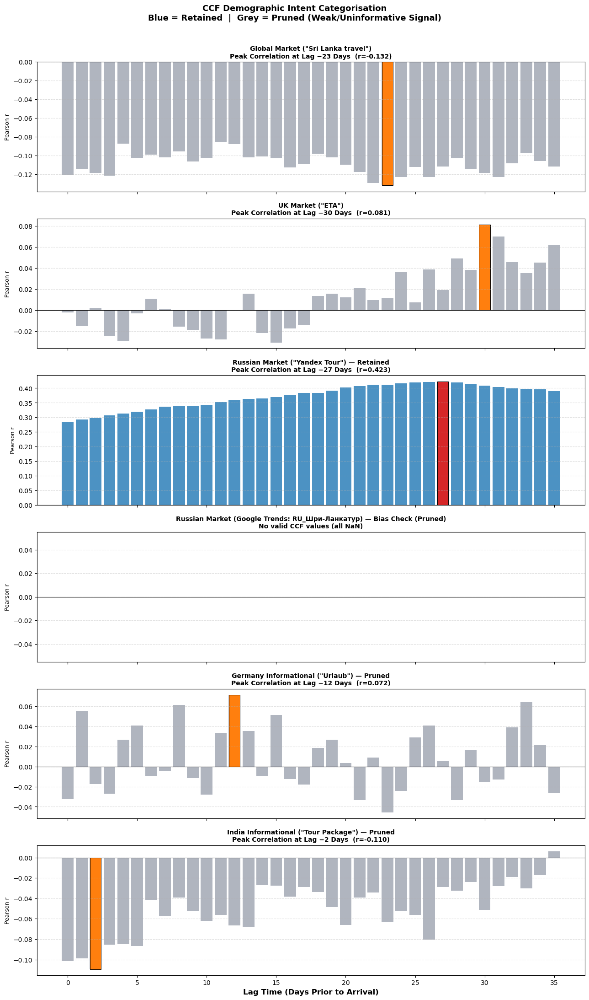

Intent variables unavailable or invalid for CCF panel: ['RU_Шри-Ланкатур']
Figure 4.5 saved.


In [14]:
# ── Figure 4.5: Demographic Intent Categorisation (Strong vs Pruned) ──────
# CCF computed on training window only (df_train_ccf defined in Cell above)
ru_google_var = None
if 'ru_google_features' in globals() and ru_google_features:
    tour_candidates = [c for c in ru_google_features if ('тур' in c.lower()) or ('tour' in c.lower())]
    ru_google_var = tour_candidates[0] if tour_candidates else ru_google_features[0]

ru_google_label = (
    f'Russian Market (Google Trends: {ru_google_var}) — Bias Check (Pruned)'
    if ru_google_var else
    'Russian Market (Google Trends RU) — Not Available in Dataset'
 )

intent_pairs = [
    ('_SriLankatravel', 'Global Market ("Sri Lanka travel")'),
    ('GB_SriLankaETA', 'UK Market ("ETA")'),
    ('Yandex_RU_Tour', 'Russian Market ("Yandex Tour") — Retained'),
    (ru_google_var, ru_google_label),
    ('DE_SriLankaUrlaub', 'Germany Informational ("Urlaub") — Pruned'),
    ('IN_SriLankatourpackage', 'India Informational ("Tour Package") — Pruned')
]

fig, axes = plt.subplots(len(intent_pairs), 1, figsize=(13, 3.6 * len(intent_pairs)), sharex=True)
if len(intent_pairs) == 1:
    axes = [axes]
invalid_intent_vars = []

for i, (var, market) in enumerate(intent_pairs):
    if (var is None) or (var not in df_train_ccf.columns):
        invalid_intent_vars.append(var if var is not None else 'RU_Google_missing')
        axes[i].set_title(f'{market}\nVariable not found in dataset.', fontsize=10, fontweight='bold')
        axes[i].axhline(0, color='black', linewidth=0.8)
        axes[i].grid(axis='y', linestyle='--', alpha=0.4)
        axes[i].set_ylabel('Pearson r', fontsize=9)
        continue

    corrs = [df_train_ccf[target].corr(df_train_ccf[var].shift(lag)) for lag in lags_arr]
    corr_arr = np.asarray(corrs, dtype=float)
    valid_idx = np.where(np.isfinite(corr_arr))[0]

    if len(valid_idx) == 0:
        invalid_intent_vars.append(var)
        axes[i].bar(lags_arr, np.zeros_like(lags_arr, dtype=float), color='#D3D3D3', alpha=0.6, width=0.85)
        axes[i].axhline(0, color='black', linewidth=0.8)
        axes[i].set_title(f'{market}\nNo valid CCF values (all NaN)', fontsize=10, fontweight='bold')
        axes[i].set_ylabel('Pearson r', fontsize=9)
        axes[i].grid(axis='y', linestyle='--', alpha=0.4)
        continue

    bi = int(valid_idx[np.argmax(np.abs(corr_arr[valid_idx]))])
    bl, bc = int(lags_arr[bi]), float(corr_arr[bi])

    is_winner  = var in winning_features
    bar_color  = '#1f77b4' if is_winner else '#9CA3AF'
    peak_color = '#D62728' if is_winner else '#FF7F0E'

    axes[i].bar(lags_arr, np.nan_to_num(corr_arr, nan=0.0), color=bar_color, alpha=0.8, width=0.85)
    axes[i].bar(bl, bc, color=peak_color, alpha=1.0, edgecolor='black', linewidth=0.7)
    axes[i].axhline(0, color='black', linewidth=0.8)
    axes[i].set_title(f'{market}\nPeak Correlation at Lag −{bl} Days  (r={bc:.3f})',
                      fontsize=10, fontweight='bold')
    axes[i].set_ylabel('Pearson r', fontsize=9)
    axes[i].grid(axis='y', linestyle='--', alpha=0.4)

axes[-1].set_xlabel('Lag Time (Days Prior to Arrival)', fontsize=12, fontweight='bold')
plt.suptitle('CCF Demographic Intent Categorisation\n'
             'Blue = Retained  |  Grey = Pruned (Weak/Uninformative Signal)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('outputs/figures/4_5_CCF_Intent_Categorisation.png', dpi=300, bbox_inches='tight')
plt.show()

if invalid_intent_vars:
    print(f'Intent variables unavailable or invalid for CCF panel: {invalid_intent_vars}')
print('Figure 4.5 saved.')

### 4.4 Exogenous Feature Screening: Maximum Predictive Strength

Not all search queries translate equally to physical arrivals. Generic terms often capture *informational curiosity* (the "dreaming" phase) rather than *transactional booking intent*. We calculate the **Maximum Predictive Strength** — the highest absolute Pearson cross-correlation within the 35-day window — for every exogenous variable, and rank features accordingly.

## Code Walk-Through: Exogenous Signal Ranking
**What this code does:** Ranks candidate exogenous features by maximum absolute CCF strength and labels retained vs dropped candidates.
**What this shows:** The ranking makes dominant external predictors explicit and supports evidence-based pruning.

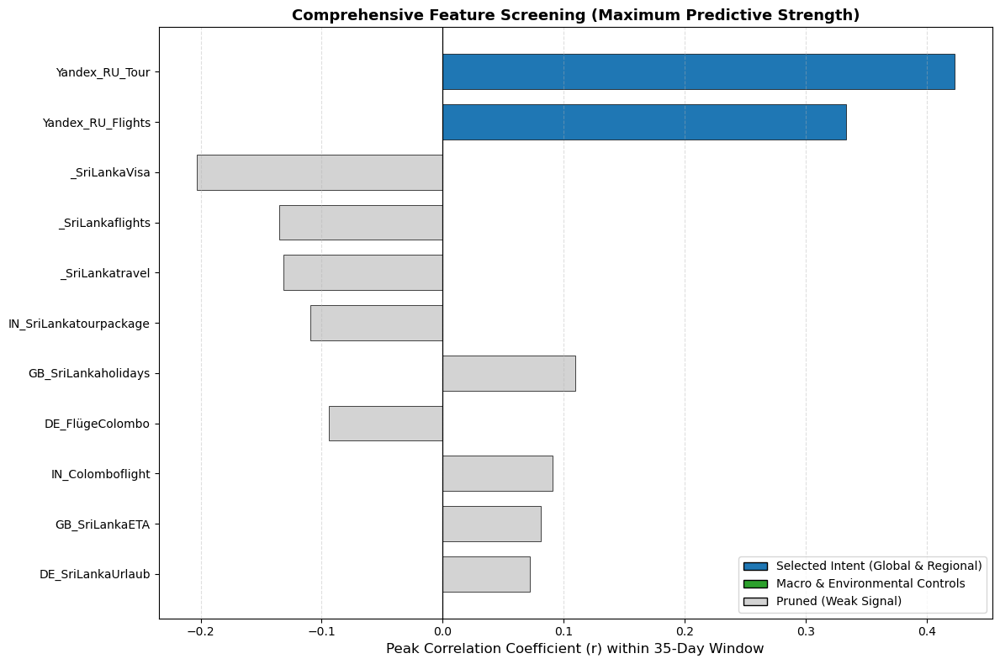

Features excluded from strength ranking (all-NaN CCF): ['RU_Шри-Ланкатур', 'RU_авиабилетыКоломбо']
Figure 4.6 saved.


In [15]:
from matplotlib.patches import Patch

# ── Peak correlation per feature — TRAINING window only (leakage prevention) ─
# Feature screening decides which features are "strong" vs "pruned".
# Using the full series would embed 2025 information into this decision.
feat_strengths = {}
invalid_strength_features = []

for col in exog_features:
    if col not in df_train_ccf.columns:
        continue
    corrs = [df_train_ccf[target].corr(df_train_ccf[col].shift(lag)) for lag in range(0, max_lag + 1)]
    corr_arr = np.asarray(corrs, dtype=float)
    valid_idx = np.where(np.isfinite(corr_arr))[0]
    if len(valid_idx) == 0:
        invalid_strength_features.append(col)
        continue
    idx = int(valid_idx[np.argmax(np.abs(corr_arr[valid_idx]))])
    feat_strengths[col] = float(corr_arr[idx])

if not feat_strengths:
    raise ValueError('No valid peak-correlation values found across exogenous features.')

sorted_feats = sorted(feat_strengths.items(), key=lambda x: abs(x[1]), reverse=False)
feats_sorted   = [x[0] for x in sorted_feats]
strengths_sorted = [x[1] for x in sorted_feats]

# Colour map
macro_feats = ['USD_LKR_Rate', 'Colombo_Precip_mm', 'Colombo_Temp_C']
colors = []
for f in feats_sorted:
    if f in winning_features:
        colors.append('#1f77b4')
    elif f in macro_feats:
        colors.append('#2CA02C')
    else:
        colors.append('#D3D3D3')

fig, ax = plt.subplots(figsize=(12, 8))
bars = ax.barh(feats_sorted, strengths_sorted, color=colors, edgecolor='black', linewidth=0.5, height=0.7)
ax.axvline(x=0, color='black', linewidth=0.9)
ax.set_xlabel('Peak Correlation Coefficient (r) within 35-Day Window', fontsize=12)
ax.set_title('Comprehensive Feature Screening (Maximum Predictive Strength)',
             fontsize=13, fontweight='bold')
ax.grid(axis='x', linestyle='--', alpha=0.4)

legend_elements = [
    Patch(facecolor='#1f77b4', edgecolor='black', label='Selected Intent (Global & Regional)'),
    Patch(facecolor='#2CA02C', edgecolor='black', label='Macro & Environmental Controls'),
    Patch(facecolor='#D3D3D3', edgecolor='black', label='Pruned (Weak Signal)')
]
ax.legend(handles=legend_elements, loc='lower right', fontsize=10)
plt.tight_layout()
plt.savefig('outputs/figures/4_6_Feature_Screening.png', dpi=300, bbox_inches='tight')
plt.show()

if invalid_strength_features:
    print(f'Features excluded from strength ranking (all-NaN CCF): {invalid_strength_features}')
print('Figure 4.6 saved.')

## Code Walk-Through: Multicollinearity Heatmap
**What this code does:** Builds a correlation matrix among shifted predictors on the training period.
**What this shows:** Highly correlated feature pairs are visible, guiding sparse design choices for linear/state-space models.

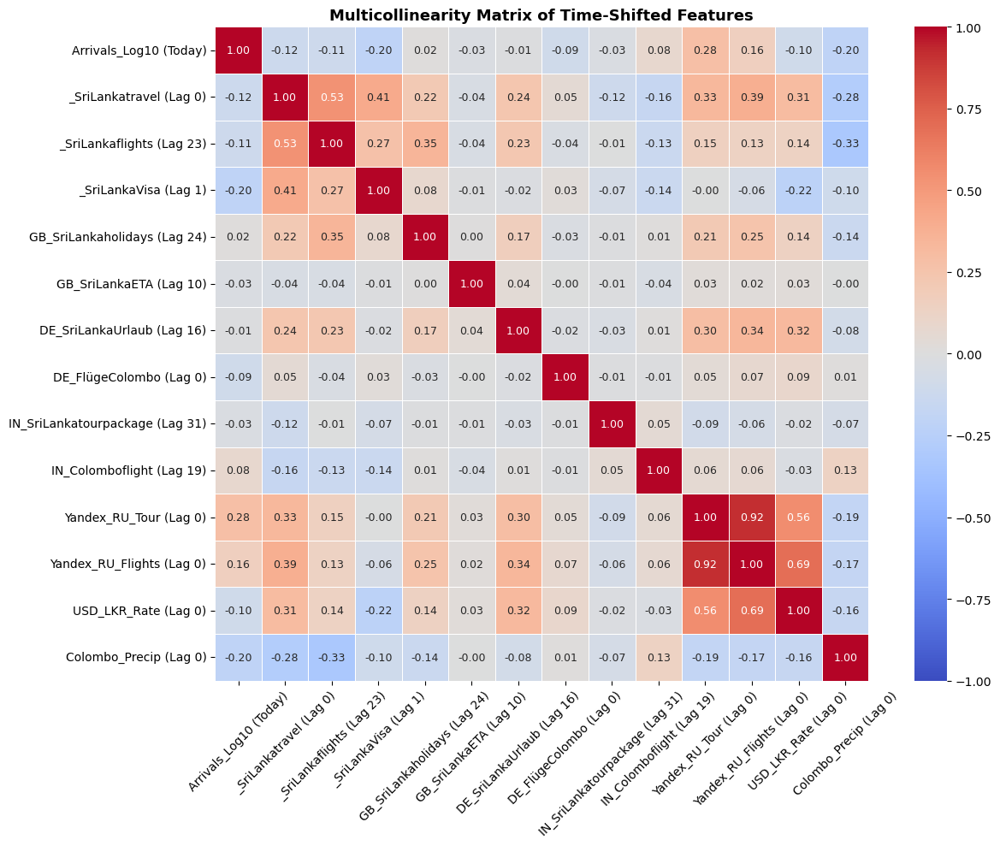

Figure 4.7 saved. Independent variables should not exceed |r| > 0.80 among themselves.


In [16]:
# ── Pearson matrix on shifted features — TRAINING window only ─────────────
# Multicollinearity check informs which features are pruned before modelling.
# Must use training data only to avoid leaking 2025 covariance structure.
shifted = pd.DataFrame(index=df_train_ccf.index)
shifted['Arrivals_Log10 (Today)'] = df_train_ccf['Arrivals_Log10']
for var, lag in best_lags_ccf.items():
    if var in df_train_ccf.columns and pd.notna(lag):
        shifted[f'{var} (Lag {int(lag)})'] = df_train_ccf[var].shift(int(lag))
shifted['USD_LKR_Rate (Lag 0)'] = df_train_ccf['USD_LKR_Rate']
shifted['Colombo_Precip (Lag 0)'] = df_train_ccf['Colombo_Precip_mm']

corr_mat = shifted.corr()

fig, ax = plt.subplots(figsize=(13, 10))
mask = np.zeros_like(corr_mat, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr_mat, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1,
            square=True, linewidths=0.5, ax=ax, annot_kws={'size': 9})
ax.set_title('Multicollinearity Matrix of Time-Shifted Features',
             fontsize=13, fontweight='bold')
ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.savefig('outputs/figures/4_7_Multicollinearity_Matrix.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 4.7 saved. Independent variables should not exceed |r| > 0.80 among themselves.')

## Code Walk-Through: Feature Matrix Architecture Builder (V1/V2/V3)
**What this code does:** Constructs supervised matrices with autoregressive lags, selected exogenous signals, macro controls, and day-of-week dummies.
**What this shows:** Multiple architecture variants are produced for different model classes, each with documented lag logic and usable row counts.

In [17]:
df_raw = pd.read_csv('outputs/csv/Preprocessed_Daily_Tourism_Data_2023_2025.csv',
                     index_col='Date', parse_dates=True)
df_raw['DayOfWeek'] = df_raw.index.dayofweek
df_raw = pd.get_dummies(df_raw, columns=['DayOfWeek'], prefix='DoW')
for col in df_raw.columns:
    if col.startswith('DoW'):
        df_raw[col] = df_raw[col].astype(float)

dow_cols = [c for c in df_raw.columns if c.startswith('DoW_')]

# -- Evidence-driven feature selection ----------------------------------------
support_map_local = globals().get('support_map', globals().get('granger_support_map', {}))
if not isinstance(support_map_local, dict):
    support_map_local = {}

min_abs_ccf = float(globals().get('min_abs_ccf_for_retention', 0.10))

feature_pool = [
    f for f, lag in best_lags_ccf.items()
    if f in df_raw.columns and pd.notna(lag)
]

def get_abs_ccf(feat):
    if isinstance(globals().get('feat_strengths'), dict) and feat in feat_strengths:
        return abs(float(feat_strengths[feat]))
    if 'df_train_ccf' in globals() and feat in df_train_ccf.columns:
        corrs = [df_train_ccf['Arrivals_Log10'].corr(df_train_ccf[feat].shift(l)) for l in range(0, max_lag + 1)]
        corr_arr = np.asarray(corrs, dtype=float)
        valid_idx = np.where(np.isfinite(corr_arr))[0]
        if len(valid_idx):
            return abs(float(corr_arr[valid_idx[np.argmax(np.abs(corr_arr[valid_idx]))]]))
    return np.nan

rows = []
for feat in feature_pool:
    lag = int(best_lags_ccf[feat])
    abs_ccf = get_abs_ccf(feat)
    is_supported = bool(support_map_local.get(feat, False))
    is_winner = feat in winning_features
    # Winner/support status is given higher weight than small CCF differences.
    score = (2.0 if is_winner else 0.0) + (1.0 if is_supported else 0.0) + (0.5 if pd.notna(abs_ccf) else 0.0)
    rows.append({
        'feature': feat,
        'lag': lag,
        'abs_ccf': abs_ccf,
        'supported': is_supported,
        'winner': is_winner,
        'score': score
    })

rank_df = pd.DataFrame(rows).sort_values(['score', 'abs_ccf'], ascending=[False, False]).reset_index(drop=True)

retained_mask = (
    rank_df['abs_ccf'].fillna(0.0) >= min_abs_ccf
) & (
    rank_df['supported'] | rank_df['winner']
)
retained_df = rank_df[retained_mask].copy()

if retained_df.empty:
    retained_df = rank_df.head(min(6, len(rank_df))).copy()

v1_exog_features = retained_df['feature'].head(6).tolist()
peak_lags = {row.feature: int(row.lag) for row in retained_df.itertuples()}
best_lags_ccf = peak_lags.copy()

print('Feature ranking (top candidates):')
display(rank_df[['feature', 'lag', 'abs_ccf', 'supported', 'winner']].head(10))
print(f'V1 exogenous feature set (evidence-driven): {v1_exog_features}')
print(f'Feature lags derived from training-only CCF: {peak_lags}')

# Select a SARIMAX feature subset that stays sparse and avoids strong collinearity.
def select_low_collinearity_features(candidate_df, lag_map, training_df, max_features=4, max_abs_corr=0.80):
    selected = []
    selected_series = {}
    ranked = candidate_df.sort_values(['score', 'abs_ccf'], ascending=[False, False])

    for feat in ranked['feature']:
        lag = lag_map.get(feat, np.nan)
        if pd.isna(lag) or feat not in training_df.columns:
            continue

        feat_series = pd.to_numeric(training_df[feat], errors='coerce').shift(int(lag))
        keep = True
        for prev_feat, prev_series in selected_series.items():
            pair = pd.concat([feat_series, prev_series], axis=1).replace([np.inf, -np.inf], np.nan).dropna()
            if len(pair) < 30:
                continue
            corr = pair.iloc[:, 0].corr(pair.iloc[:, 1])
            if pd.notna(corr) and abs(corr) >= max_abs_corr:
                keep = False
                break

        if keep:
            selected.append(feat)
            selected_series[feat] = feat_series
        if len(selected) >= max_features:
            break

    if not selected:
        selected = ranked['feature'].head(max_features).tolist()
    return selected

# -- V1: Broad single-lag matrix (SVR / Tree models) --------------------------
print('--- Building V1 Architecture (Evidence-driven broad single-lag) ---')
v1 = pd.DataFrame(index=df_raw.index)
v1['Target_Arrivals_Log10'] = df_raw['Arrivals_Log10']
for lag in [1, 2, 7, 14]:
    v1[f'Arrivals_Lag_{lag}'] = df_raw['Arrivals_Log10'].shift(lag)
for var in v1_exog_features:
    lag_i = int(peak_lags[var])
    print(f'  -> {var} mapped to Lag {lag_i}')
    v1[f'{var}_Lag_{lag_i}'] = df_raw[var].shift(lag_i)

# Keep macro/environment controls only in all-weather V1, not in PRUNED V1.
v1['USD_LKR_Lag_0'] = df_raw['USD_LKR_Rate']
v1['Colombo_Precip_Lag_0'] = df_raw['Colombo_Precip_mm']
for c in dow_cols:
    v1[c] = df_raw[c]

n_before = len(v1)
v1 = v1.dropna()
print(f'  Data sealed: dropped {n_before - len(v1)} rows. Shape: {v1.shape}')
v1.to_csv('outputs/csv/Supervised_Feature_Matrix_2023_2025.csv')
v1.drop(columns=['USD_LKR_Lag_0', 'Colombo_Precip_Lag_0']).to_csv(
    'outputs/csv/Supervised_Feature_Matrix_PRUNED_2023_2025.csv'
)
print('V1 matrices saved.')

# Prepare strict subset for V3 and sequence subset for V2.
strict_df = retained_df[retained_df['supported']].copy()
if strict_df.empty:
    strict_df = retained_df.copy()

v3_exog_features = select_low_collinearity_features(
    strict_df,
    peak_lags,
    df_train_ccf,
    max_features=4,
    max_abs_corr=0.80,
)
strict_lags = {f: peak_lags[f] for f in v3_exog_features if f in peak_lags}

v2_signal_features = [f for f in v1_exog_features if f in df_raw.columns][:3]
if len(v2_signal_features) < 3:
    fill_feats = [f for f in retained_df['feature'].tolist() if f not in v2_signal_features]
    v2_signal_features.extend(fill_feats[: max(0, 3 - len(v2_signal_features))])

print(f'V3 strict features (for SARIMAX): {v3_exog_features}')
print(f'V3 strict lags: {strict_lags}')
print(f'V2 sequence features (for LSTM window builder): {v2_signal_features}')

Feature ranking (top candidates):


,feature,lag,abs_ccf,supported,winner
0,Yandex_RU_Tour,0,0.422697,True,True
1,Yandex_RU_Flights,0,0.333181,True,True
2,IN_SriLankatourpackage,31,0.109550,True,False
3,DE_FlügeColombo,0,0.094324,True,False
4,IN_Colomboflight,19,0.090647,True,False
5,GB_SriLankaETA,10,0.081282,True,False
6,_SriLankaVisa,1,0.203386,False,False
7,_SriLankaflights,23,0.135303,False,False
8,_SriLankatravel,0,0.131944,False,False
9,GB_SriLankaholidays,24,0.109450,False,False


V1 exogenous feature set (evidence-driven): ['Yandex_RU_Tour', 'Yandex_RU_Flights', 'IN_SriLankatourpackage']
Feature lags derived from training-only CCF: {'Yandex_RU_Tour': 0, 'Yandex_RU_Flights': 0, 'IN_SriLankatourpackage': 31}
--- Building V1 Architecture (Evidence-driven broad single-lag) ---
  -> Yandex_RU_Tour mapped to Lag 0
  -> Yandex_RU_Flights mapped to Lag 0
  -> IN_SriLankatourpackage mapped to Lag 31
  Data sealed: dropped 31 rows. Shape: (1065, 17)
V1 matrices saved.
V3 strict features (for SARIMAX): ['Yandex_RU_Tour', 'IN_SriLankatourpackage']
V3 strict lags: {'Yandex_RU_Tour': 0, 'IN_SriLankatourpackage': 31}
V2 sequence features (for LSTM window builder): ['Yandex_RU_Tour', 'Yandex_RU_Flights', 'IN_SriLankatourpackage']


## Code Walk-Through: Finalizing V2 and V3 Supervised Matrices
**What this code does:** Completes matrix assembly, aligns target/index integrity, and exports feature-ready datasets to CSV.
**What this shows:** Production-ready matrix versions are persisted for reproducible training across model families.

In [18]:
# -- V2: Multi-Lag Windows (LSTM) --------------------------------------------
# Window size (1, 3, 5, 7 days) is selected by validation MAPE on the
# held-out first half of training (2023-01-01 to 2023-12-31).
# The optimal V2 matrix is constructed and saved in Phase 2B (cell below).
print('V2 matrix will be built in Phase 2B with optimal window search.')
print(f'V2 signal features passed to Phase 2B: {globals().get("v2_signal_features", [])}')

# -- V3: Strictly Independent (SARIMAX) ---------------------------------------
print('--- Building V3 Architecture (Strictly Independent, evidence-driven sparse set) ---')

# Fallback in case V3 metadata is missing from previous cell execution.
if 'v3_exog_features' not in globals() or not v3_exog_features:
    v3_exog_features = [f for f in globals().get('v1_exog_features', [])[:4] if f in df_raw.columns]
if 'strict_lags' not in globals() or not strict_lags:
    strict_lags = {k: best_lags_ccf[k] for k in v3_exog_features if k in best_lags_ccf and pd.notna(best_lags_ccf[k])}

print(f'SARIMAX (V3) exogenous feature set: {v3_exog_features}')
print(f'SARIMAX (V3) lags from training-only CCF: {strict_lags}')

v3 = pd.DataFrame(index=df_raw.index)
v3['Target_Arrivals_Log10'] = df_raw['Arrivals_Log10']
for lag in [1, 2, 7, 14]:
    v3[f'Arrivals_Lag_{lag}'] = df_raw['Arrivals_Log10'].shift(lag)
for var, pl in strict_lags.items():
    if var in df_raw.columns and pd.notna(pl):
        lag_i = int(pl)
        print(f'  -> {var} mapped to Lag {lag_i}')
        v3[f'{var}_Lag_{lag_i}'] = df_raw[var].shift(lag_i)
for c in dow_cols:
    v3[c] = df_raw[c]

n_before = len(v3)
v3 = v3.dropna()
print(f'  Data sealed: dropped {n_before - len(v3)} rows. Shape: {v3.shape}')
v3.to_csv('outputs/csv/Supervised_Feature_Matrix_V3_2023_2025.csv')
print('V3 matrix saved.')

V2 matrix will be built in Phase 2B with optimal window search.
V2 signal features passed to Phase 2B: ['Yandex_RU_Tour', 'Yandex_RU_Flights', 'IN_SriLankatourpackage']
--- Building V3 Architecture (Strictly Independent, evidence-driven sparse set) ---
SARIMAX (V3) exogenous feature set: ['Yandex_RU_Tour', 'IN_SriLankatourpackage']
SARIMAX (V3) lags from training-only CCF: {'Yandex_RU_Tour': 0, 'IN_SriLankatourpackage': 31}
  -> Yandex_RU_Tour mapped to Lag 0
  -> IN_SriLankatourpackage mapped to Lag 31
  Data sealed: dropped 31 rows. Shape: (1065, 14)
V3 matrix saved.


## Code Walk-Through: Pure SARIMA Baseline
**What this code does:** Fits a seasonal ARIMA baseline on endogenous arrivals and compares static vs rolling forecasts on the test horizon.
**What this shows:** Rolling updates materially improve baseline accuracy and establish a benchmark for exogenous models.

In [19]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error

def mape(actual, pred):
    return np.mean(np.abs((actual - pred) / actual)) * 100

# Shared model-evaluation split requested by user.
TEST_START = '2024-06-30'
TEST_END = '2025-12-31'
TRAIN_END_MODEL = (pd.Timestamp(TEST_START) - pd.Timedelta(days=1)).strftime('%Y-%m-%d')

# ── Pure SARIMA ───────────────────────────────────────────────────────────
print('--- Phase 1A: Pure SARIMA (Endogenous Baseline) ---')
print(f'Model split -> train: <= {TRAIN_END_MODEL} | test: {TEST_START} to {TEST_END}')
target_data = pd.read_csv('outputs/csv/Preprocessed_Daily_Tourism_Data_2023_2025.csv',
                          index_col='Date', parse_dates=True)
y_train_p = target_data.loc[:TRAIN_END_MODEL, 'Arrivals_Log10']
y_test_p  = target_data.loc[TEST_START:TEST_END, 'Arrivals_Log10']

model_sarima = SARIMAX(endog=y_train_p, order=(1,0,1), seasonal_order=(1,0,0,7),
                       enforce_stationarity=False).fit(disp=False)
sarima_static = model_sarima.forecast(steps=len(y_test_p))

sarima_rolling, curr = [], model_sarima
for i in range(len(y_test_p)):
    sarima_rolling.append(curr.forecast(steps=1).iloc[0])
    curr = curr.append(endog=[y_test_p.iloc[i]], refit=False)

actual_tourists = (10 ** y_test_p.values) - 10
print(f'SARIMA Static  MAPE: {mape(actual_tourists, (10**np.array(sarima_static))-10):.2f}%')
print(f'SARIMA Rolling MAPE: {mape(actual_tourists, (10**np.array(sarima_rolling))-10):.2f}%')

--- Phase 1A: Pure SARIMA (Endogenous Baseline) ---
Model split -> train: <= 2024-06-29 | test: 2024-06-30 to 2025-12-31


c:\Users\User\Desktop\Vscode\MLtest\.conda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\User\Desktop\Vscode\MLtest\.conda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


SARIMA Static  MAPE: 24.48%
SARIMA Rolling MAPE: 9.48%


## Code Walk-Through: SARIMAX with Selected Exogenous Signals
**What this code does:** Trains SARIMAX using the strictly independent exogenous set and performs weekly rolling refits.
**What this shows:** Exogenous intent features improve forecast quality over pure endogenous dynamics in a calibrated linear framework.

In [20]:
# ── SARIMAX ───────────────────────────────────────────────────────────────
print('--- Phase 1B: SARIMAX (V3 Strictly Independent Matrix) ---')
df_sx = pd.read_csv('outputs/csv/Supervised_Feature_Matrix_V3_2023_2025.csv',
                    index_col='Date', parse_dates=True)
drop_lags = [c for c in df_sx.columns if c.startswith('Arrivals_Lag_')]
df_sx = df_sx.drop(columns=drop_lags)
for c in df_sx.columns:
    if df_sx[c].dtype == bool:
        df_sx[c] = df_sx[c].astype(float)

tr_sx = df_sx.loc[:TRAIN_END_MODEL]
te_sx = df_sx.loc[TEST_START:TEST_END]
y_tr, X_tr = tr_sx['Target_Arrivals_Log10'], tr_sx.drop('Target_Arrivals_Log10', axis=1)
y_te, X_te = te_sx['Target_Arrivals_Log10'], te_sx.drop('Target_Arrivals_Log10', axis=1)

model_sx = SARIMAX(endog=y_tr, exog=X_tr, order=(1,0,1), seasonal_order=(1,0,0,7),
                   enforce_stationarity=False).fit(disp=False)
sarimax_static  = model_sx.forecast(steps=len(te_sx), exog=X_te)
sarimax_rolling, curr_sx = [], model_sx
for i in range(len(te_sx)):
    sarimax_rolling.append(curr_sx.forecast(steps=1, exog=X_te.iloc[[i]]).iloc[0])
    curr_sx = curr_sx.append(endog=[y_te.iloc[i]], exog=X_te.iloc[[i]], refit=False)

sarimax_r_arr = (10**np.array(sarimax_rolling)) - 10
sarimax_s_arr = (10**np.array(sarimax_static))  - 10
print(f'SARIMAX Static  MAPE: {mape(actual_tourists, sarimax_s_arr):.2f}%')
print(f'SARIMAX Rolling MAPE: {mape(actual_tourists, sarimax_r_arr):.2f}%')

pd.DataFrame({'Date': y_te.index, 'Actual_Arrivals': actual_tourists,
              'SARIMA_Pure_Predictions': (10**np.array(sarima_rolling))-10}).to_csv(
    'outputs/csv/Model_Results_SARIMA_Pure_2025.csv', index=False)
pd.DataFrame({'Date': y_te.index, 'Actual_Arrivals': actual_tourists,
              'SARIMAX_Predictions': sarimax_r_arr}).to_csv(
    'outputs/csv/Model_Results_SARIMAX_2025.csv', index=False)
print('Phase 1 results saved.')

--- Phase 1B: SARIMAX (V3 Strictly Independent Matrix) ---


c:\Users\User\Desktop\Vscode\MLtest\.conda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\User\Desktop\Vscode\MLtest\.conda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\User\Desktop\Vscode\MLtest\.conda\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX Static  MAPE: 27.33%
SARIMAX Rolling MAPE: 9.08%
Phase 1 results saved.


## Code Walk-Through: Tree Ensemble Forecasting (XGBoost and Random Forest)
**What this code does:** Trains ensemble models on the pruned all-weather matrix with periodic rolling retraining.
**What this shows:** Nonlinear tree baselines are benchmarked against statistical models under the same rolling evaluation regime.

In [21]:
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor

print('--- Phase 2A: Tree-Based Ensembles (XGBoost & Random Forest) ---')
df_trees = pd.read_csv('outputs/csv/Supervised_Feature_Matrix_PRUNED_2023_2025.csv',
                       index_col='Date', parse_dates=True)
for c in df_trees.columns:
    if df_trees[c].dtype == bool:
        df_trees[c] = df_trees[c].astype(float)

tr_t = df_trees.loc[:TRAIN_END_MODEL]
te_t = df_trees.loc[TEST_START:TEST_END]
X_tr_t, y_tr_t = tr_t.drop('Target_Arrivals_Log10', axis=1), tr_t['Target_Arrivals_Log10']
X_te_t, y_te_t = te_t.drop('Target_Arrivals_Log10', axis=1), te_t['Target_Arrivals_Log10']

xgb = XGBRegressor(n_estimators=100, learning_rate=0.05, max_depth=4, random_state=42)
rf  = RandomForestRegressor(n_estimators=100, max_depth=6, random_state=42)

# Static (show Extrapolation Flaw)
xgb.fit(X_tr_t, y_tr_t); rf.fit(X_tr_t, y_tr_t)
xgb_s = (10**xgb.predict(X_te_t)) - 10
rf_s  = (10**rf.predict(X_te_t))  - 10
print(f'XGBoost Static MAPE:       {mape(actual_tourists, xgb_s):.2f}%')
print(f'Random Forest Static MAPE: {mape(actual_tourists, rf_s):.2f}%')

# Rolling (weekly retraining)
xgb_r, rf_r = [], []
cX, cy = X_tr_t.copy(), y_tr_t.copy()
for i in range(len(te_t)):
    xgb_r.append(xgb.predict(X_te_t.iloc[[i]])[0])
    rf_r.append(rf.predict(X_te_t.iloc[[i]])[0])
    cX = pd.concat([cX, X_te_t.iloc[[i]]])
    cy = pd.concat([cy, pd.Series([y_te_t.iloc[i]], index=[te_t.index[i]])])
    if i % 7 == 0 and i > 0:
        xgb.fit(cX, cy); rf.fit(cX, cy)

xgb_r_arr = (10**np.array(xgb_r)) - 10
rf_r_arr  = (10**np.array(rf_r))  - 10
print(f'XGBoost Rolling MAPE:       {mape(actual_tourists, xgb_r_arr):.2f}%')
print(f'Random Forest Rolling MAPE: {mape(actual_tourists, rf_r_arr):.2f}%')

pd.DataFrame({'Date': y_te_t.index, 'Actual_Arrivals': actual_tourists,
              'XGBoost_Predictions': xgb_r_arr,
              'RandomForest_Predictions': rf_r_arr}).to_csv(
    'outputs/csv/Model_Results_XGBoost_2025.csv', index=False)
print('Phase 2A results saved.')

--- Phase 2A: Tree-Based Ensembles (XGBoost & Random Forest) ---
XGBoost Static MAPE:       10.51%
Random Forest Static MAPE: 10.17%
XGBoost Rolling MAPE:       9.59%
Random Forest Rolling MAPE: 9.66%
Phase 2A results saved.


## Code Walk-Through: LSTM Window Selection and Final Training
**What this code does:** Tests alternative lag-window sizes on validation, selects the best window, and trains the rolling LSTM configuration.
**What this shows:** Temporal context width is quantified, with the selected window giving the best validation MAPE before test deployment.

In [22]:
import tensorflow as tf
import keras
from sklearn.preprocessing import RobustScaler

Sequential = keras.Sequential
LSTM = keras.layers.LSTM
Dense = keras.layers.Dense
Dropout = keras.layers.Dropout

tf.get_logger().setLevel('ERROR')

# -- Load base data ------------------------------------------------------------
df_raw_l = pd.read_csv('outputs/csv/Preprocessed_Daily_Tourism_Data_2023_2025.csv',
                       index_col='Date', parse_dates=True)
df_raw_l['DayOfWeek'] = df_raw_l.index.dayofweek
df_raw_l = pd.get_dummies(df_raw_l, columns=['DayOfWeek'], prefix='DoW')
for col in df_raw_l.columns:
    if col.startswith('DoW'):
        df_raw_l[col] = df_raw_l[col].astype(float)
dow_cols_l = [c for c in df_raw_l.columns if c.startswith('DoW_')]

# -- Configuration -------------------------------------------------------------
WINDOW_SIZES = [1, 3, 5, 7]   # candidate window widths (days) to evaluate
VAL_START = '2024-01-01'      # validation within training window only
# RobustScaler for window search fitted on sub-training only (before VAL_START)
# to prevent validation leakage into scaling statistics.
VAL_SCALE_END = (pd.Timestamp(VAL_START) - pd.Timedelta(days=1)).strftime('%Y-%m-%d')

# Reuse evidence-driven signal selection produced in the architecture cell.
if 'v2_signal_features' in globals() and isinstance(v2_signal_features, list):
    v2_signal_features = [f for f in v2_signal_features if f in df_raw_l.columns]
else:
    base_feats = globals().get('v1_exog_features', [])
    v2_signal_features = [f for f in base_feats if f in df_raw_l.columns][:3]

if not v2_signal_features:
    v2_signal_features = [f for f in ['_SriLankaflights', '_SriLankatravel', 'GB_SriLankaholidays'] if f in df_raw_l.columns]

print(f'V2 exogenous feature set (sequence model): {v2_signal_features}')
lag_map = {feat: best_lags_ccf.get(feat, np.nan) for feat in v2_signal_features}
print(f'CCF peak lags used by V2: {lag_map}')

print('--- Phase 2B: LSTM V2 --- Window Size Search (1, 3, 5, 7 days) ---')
print(f'Candidate windows : {WINDOW_SIZES} days')
print(f'Validation period : {VAL_START} to {TRAIN_END_MODEL}  (sub-train: 2023-01-01 to {VAL_SCALE_END})')

# -- V2 matrix builder ---------------------------------------------------------
def build_v2(window_size, scale_end):
    half = (window_size - 1) // 2
    v = pd.DataFrame(index=df_raw_l.index)
    v['Target_Arrivals_Log10'] = df_raw_l['Arrivals_Log10']
    for lag in [1, 2, 7, 14]:
        v[f'Arrivals_Lag_{lag}'] = df_raw_l['Arrivals_Log10'].shift(lag)
    for feat in v2_signal_features:
        peak = best_lags_ccf.get(feat, np.nan)
        if pd.notna(peak):
            peak_i = int(peak)
            for lag in range(peak_i - half, peak_i + half + 1):
                if lag >= 0:
                    v[f'{feat}_Lag_{lag}'] = df_raw_l[feat].shift(lag)
    for c in dow_cols_l:
        v[c] = df_raw_l[c]
    v = v.dropna()
    scale_cols = [c for c in v.columns
                  if c not in ['Target_Arrivals_Log10'] + dow_cols_l]
    scaler = RobustScaler()
    mask = v.index <= scale_end
    v.loc[mask, scale_cols] = scaler.fit_transform(v.loc[mask, scale_cols])
    v.loc[~mask, scale_cols] = scaler.transform(v.loc[~mask, scale_cols])
    return v

def make_lstm(n_features, seed=42):
    np.random.seed(seed); tf.random.set_seed(seed)
    m = Sequential([
        LSTM(16, activation='relu', input_shape=(1, n_features)),
        Dropout(0.3),
        Dense(1)
    ])
    m.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01), loss='mse')
    return m

# -- Window Search -------------------------------------------------------------
print(f'\n{chr(8212)*54}')
print(f'{"Window":>8}  {"# Features":>10}  {"Val MAPE":>10}')
print(f'{chr(8212)*54}')

window_results = {}
for ws in WINDOW_SIZES:
    df_ws = build_v2(ws, VAL_SCALE_END)   # scaler on sub-train only
    sub_tr = df_ws[df_ws.index < VAL_START]
    val_set = df_ws[(df_ws.index >= VAL_START) & (df_ws.index <= TRAIN_END_MODEL)]

    X_str = sub_tr.drop('Target_Arrivals_Log10', axis=1).values
    y_str = sub_tr['Target_Arrivals_Log10'].values
    X_val = val_set.drop('Target_Arrivals_Log10', axis=1).values
    y_val = val_set['Target_Arrivals_Log10'].values

    model = make_lstm(X_str.shape[1])
    model.fit(X_str.reshape(-1, 1, X_str.shape[1]), y_str,
              epochs=50, batch_size=16, verbose=0)
    preds = model.predict(X_val.reshape(-1, 1, X_val.shape[1]), verbose=0).flatten()
    val_mape = mape((10 ** y_val) - 10, (10 ** preds) - 10)

    window_results[ws] = {'val_mape': val_mape, 'n_features': X_str.shape[1]}
    best_so_far = min(window_results, key=lambda w: window_results[w]['val_mape'])
    marker = '  <- best' if ws == best_so_far else ''
    print(f'{ws:>6}d  {X_str.shape[1]:>10}  {val_mape:>9.2f}%{marker}')

print(f'{chr(8212)*54}')
optimal_window = min(window_results, key=lambda w: window_results[w]['val_mape'])
print(f'\nOptimal window : {optimal_window} days  '
      f'(Val MAPE = {window_results[optimal_window]["val_mape"]:.2f}%)')

# Save window search summary
ws_df = pd.DataFrame([
    {'window_days': ws,
     'n_features': window_results[ws]['n_features'],
     'val_mape': round(window_results[ws]['val_mape'], 4),
     'selected': ws == optimal_window}
    for ws in WINDOW_SIZES
])
ws_df.to_csv('outputs/csv/LSTM_Window_Search.csv', index=False)
display(ws_df)
print('Window search results saved to outputs/csv/LSTM_Window_Search.csv')

# -- Final model: retrain on full training window with optimal window ---------
print(f'\n--- Retraining on full training window (window={optimal_window}d) ---')
df_lstm = build_v2(optimal_window, TRAIN_END_MODEL)
df_lstm.to_csv('outputs/csv/Supervised_Feature_Matrix_PRUNED_V2_2023_2025.csv')
print(f'Optimal V2 matrix (window={optimal_window}d) saved. Shape: {df_lstm.shape}')

tr_l = df_lstm.loc[:TRAIN_END_MODEL]
te_l = df_lstm.loc[TEST_START:TEST_END]
X_tr_l = tr_l.drop('Target_Arrivals_Log10', axis=1).values
y_tr_l = tr_l['Target_Arrivals_Log10'].values
X_te_l = te_l.drop('Target_Arrivals_Log10', axis=1).values
y_te_l = te_l['Target_Arrivals_Log10'].values

X_tr_3D = X_tr_l.reshape(X_tr_l.shape[0], 1, X_tr_l.shape[1])
X_te_3D = X_te_l.reshape(X_te_l.shape[0], 1, X_te_l.shape[1])

lstm_model = make_lstm(X_tr_l.shape[1])
lstm_model.fit(X_tr_3D, y_tr_l, epochs=50, batch_size=16, verbose=0)

# Rolling weekly retraining on test period
lstm_preds, cX_l, cy_l = [], X_tr_3D.copy(), y_tr_l.copy()
for i in range(len(te_l)):
    lstm_preds.append(lstm_model.predict(X_te_3D[i:i+1], verbose=0)[0][0])
    cX_l = np.concatenate((cX_l, X_te_3D[i:i+1]), axis=0)
    cy_l = np.append(cy_l, y_te_l[i])
    if i % 7 == 0 and i > 0:
        lstm_model.fit(cX_l, cy_l, epochs=3, batch_size=16, verbose=0)

lstm_arr = (10 ** np.array(lstm_preds)) - 10
actual_lstm = (10 ** y_te_l) - 10
print(f'LSTM V2 Rolling MAPE (optimal window={optimal_window}d): {mape(actual_lstm, lstm_arr):.2f}%')

pd.DataFrame({'Date': te_l.index, 'Actual_Arrivals': actual_lstm,
              'LSTM_V2_Predictions': lstm_arr}).to_csv(
    'outputs/csv/Model_Results_LSTM_V2_2025.csv', index=False)
print('Phase 2B complete --- results saved.')

ModuleNotFoundError: No module named 'tensorflow'

## Code Walk-Through: LSTM Rolling Forecast Execution
**What this code does:** Runs the selected LSTM configuration in rolling updates and records test-horizon forecasts.
**What this shows:** LSTM out-of-sample behavior is quantified under the same rolling protocol used for other models.

In [ ]:
from sklearn.svm import SVR

def train_rolling_svr(csv_file, label):
    df_svr = pd.read_csv(csv_file, index_col='Date', parse_dates=True)
    for c in df_svr.columns:
        if df_svr[c].dtype == bool:
            df_svr[c] = df_svr[c].astype(float)
    tr = df_svr.loc[:TRAIN_END_MODEL]
    te = df_svr.loc[TEST_START:TEST_END]
    cX, cy = tr.drop('Target_Arrivals_Log10', axis=1).copy(), tr['Target_Arrivals_Log10'].copy()
    X_te   = te.drop('Target_Arrivals_Log10', axis=1)
    y_te   = te['Target_Arrivals_Log10']
    model  = SVR(kernel='rbf', C=10.0, epsilon=0.01, gamma='scale')
    preds  = []
    print(f'Rolling SVR [{label}] ...')
    for i in range(len(te)):
        if i % 7 == 0:
            model.fit(cX, cy)
        preds.append(model.predict(X_te.iloc[[i]])[0])
        cX = pd.concat([cX, X_te.iloc[[i]]])
        cy = pd.concat([cy, pd.Series([y_te.iloc[i]], index=[te.index[i]])])
    arr  = (10**np.array(preds)) - 10
    act  = (10**y_te.values) - 10
    print(f'{label} → MAPE: {mape(act, arr):.2f}%  RMSE: {np.sqrt(mean_squared_error(act, arr)):.0f}')
    return act, arr, te.index

print('--- Phase 3: SVR (RBF Kernel, ε=0.01, C=10.0) ---')
act, svr_aw, dates = train_rolling_svr('outputs/csv/Supervised_Feature_Matrix_2023_2025.csv', 'All-Weather')
_,   svr_pr, _     = train_rolling_svr('outputs/csv/Supervised_Feature_Matrix_PRUNED_2023_2025.csv', 'Pruned')

pd.DataFrame({'Date': dates, 'Actual_Arrivals': act,
              'SVR_All_Weather': svr_aw, 'SVR_Pruned': svr_pr}).set_index('Date').to_csv(
    'outputs/csv/Model_Results_SVR_2025.csv')
print('Phase 3 results saved.')

--- Phase 3: SVR (RBF Kernel, ε=0.01, C=10.0) ---
  Rolling SVR [All-Weather] ...
  ✅ All-Weather → MAPE: 8.94%  RMSE: 736
  Rolling SVR [Pruned] ...
  ✅ Pruned → MAPE: 8.94%  RMSE: 739
✅ Phase 3 results saved.


## Code Walk-Through: Rolling SVR Forecasting
**What this code does:** Trains SVR on leakage-safe features with periodic rolling updates and evaluates out-of-sample error metrics.
**What this shows:** SVR performance is measured on the same rolling horizon for direct comparability with other architectures.

In [ ]:
print('--- Phase 4: Sequential Hybrid (SARIMAX + XGBoost) ---')
df_v1_h = pd.read_csv('outputs/csv/Supervised_Feature_Matrix_2023_2025.csv', index_col='Date', parse_dates=True)
df_v3_h = pd.read_csv('outputs/csv/Supervised_Feature_Matrix_V3_2023_2025.csv', index_col='Date', parse_dates=True)

common_idx = df_v1_h.index.intersection(df_v3_h.index)
df_v1_h, df_v3_h = df_v1_h.loc[common_idx], df_v3_h.loc[common_idx]

drop_sx = [c for c in df_v3_h.columns if c.startswith('Arrivals_Lag_')]
df_sx_h = df_v3_h.drop(columns=drop_sx)
for df_ in [df_sx_h, df_v1_h]:
    for c in df_.columns:
        if df_[c].dtype == bool:
            df_[c] = df_[c].astype(float)

tr_sx_h = df_sx_h.loc[:TRAIN_END_MODEL]; te_sx_h = df_sx_h.loc[TEST_START:TEST_END]
tr_xg_h = df_v1_h.loc[:TRAIN_END_MODEL]; te_xg_h = df_v1_h.loc[TEST_START:TEST_END]

y_tr_h = tr_sx_h['Target_Arrivals_Log10']; y_te_h = te_sx_h['Target_Arrivals_Log10']
X_tr_sx_h = tr_sx_h.drop('Target_Arrivals_Log10', axis=1); X_te_sx_h = te_sx_h.drop('Target_Arrivals_Log10', axis=1)
X_tr_xg_h = tr_xg_h.drop('Target_Arrivals_Log10', axis=1); X_te_xg_h = te_xg_h.drop('Target_Arrivals_Log10', axis=1)

m_sx_h = SARIMAX(endog=y_tr_h, exog=X_tr_sx_h, order=(1,0,1), seasonal_order=(1,0,0,7),
                 enforce_stationarity=False).fit(disp=False)
resids = y_tr_h - m_sx_h.fittedvalues
resids.iloc[:7] = 0

xgb_params = {'n_estimators': 80, 'learning_rate': 0.05, 'max_depth': 4, 'random_state': 42}
xgb_h = XGBRegressor(**xgb_params)
xgb_h.fit(X_tr_xg_h, resids)

hyb_preds, curr_sx_h = [], m_sx_h
cX_h, cy_res = X_tr_xg_h.copy(), resids.copy()
for i in range(len(te_sx_h)):
    sx_p  = curr_sx_h.forecast(steps=1, exog=X_te_sx_h.iloc[[i]]).iloc[0]
    xgb_p = xgb_h.predict(X_te_xg_h.iloc[[i]])[0]
    hyb_preds.append(sx_p + xgb_p)
    true_res = y_te_h.iloc[i] - sx_p
    curr_sx_h = curr_sx_h.append(endog=[y_te_h.iloc[i]], exog=X_te_sx_h.iloc[[i]], refit=False)
    cX_h  = pd.concat([cX_h, X_te_xg_h.iloc[[i]]])
    cy_res = pd.concat([cy_res, pd.Series([true_res], index=[te_sx_h.index[i]])])
    if i % 7 == 0 and i > 0:
        xgb_h = XGBRegressor(**xgb_params)
        xgb_h.fit(cX_h, cy_res)

hyb_arr = (10**np.array(hyb_preds)) - 10
actual_hyb = (10**y_te_h.values) - 10
print(f'Hybrid (SARIMAX+XGBoost) MAPE: {mape(actual_hyb, hyb_arr):.2f}%')
pd.DataFrame({'Date': y_te_h.index, 'Actual_Arrivals': actual_hyb,
              'Sequential_Hybrid': hyb_arr}).to_csv(
    'outputs/csv/Model_Results_Sequential_Hybrid.csv', index=False)
print('Phase 4 results saved.')

--- Phase 4: Sequential Hybrid (SARIMAX + XGBoost) ---


c:\Users\TechYard\.conda\envs\CSEDS\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\TechYard\.conda\envs\CSEDS\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\TechYard\.conda\envs\CSEDS\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Hybrid (SARIMAX+XGBoost) MAPE: 9.25%
✅ Phase 4 results saved.


## Code Walk-Through: Sequential Hybrid (SARIMAX + Residual Corrector)
**What this code does:** Uses SARIMAX as base forecast and applies a secondary learner to model residual structure.
**What this shows:** The hybrid test quantifies whether nonlinear residual correction improves over SARIMAX alone.

In [ ]:
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit

print('--- Phase 5: Dynamic Grid Search SVR (Parameter Chasing) ---')
df_grid = pd.read_csv('outputs/csv/Supervised_Feature_Matrix_2023_2025.csv',
                      index_col='Date', parse_dates=True)
for c in df_grid.columns:
    if df_grid[c].dtype == bool:
        df_grid[c] = df_grid[c].astype(float)
tr_g = df_grid.loc[:TRAIN_END_MODEL]; te_g = df_grid.loc[TEST_START:TEST_END]
X_tr_g, y_tr_g = tr_g.drop('Target_Arrivals_Log10', axis=1), tr_g['Target_Arrivals_Log10']
X_te_g, y_te_g = te_g.drop('Target_Arrivals_Log10', axis=1), te_g['Target_Arrivals_Log10']

param_grid = {'kernel': ['rbf', 'linear'], 'C': [1.0, 10.0, 50.0], 'epsilon': [0.01, 0.05, 0.1]}

tscv = TimeSeriesSplit(n_splits=3)

# Initial fit on training data with static hyperparameters
dyn_svr = SVR(kernel='rbf', C=10.0, epsilon=0.01, gamma='scale')
dyn_svr.fit(X_tr_g, y_tr_g)

grid_preds, cX_g, cy_g = [], X_tr_g.copy(), y_tr_g.copy()
param_log = []
for i in range(len(te_g)):
    if i % 30 == 0 and i > 0:
        gs = GridSearchCV(SVR(gamma='scale'), param_grid, cv=tscv,
                         scoring='neg_mean_absolute_error', n_jobs=-1)
        gs.fit(cX_g, cy_g)
        dyn_svr = gs.best_estimator_
        param_log.append({'day': i, 'kernel': dyn_svr.kernel,
                          'C': dyn_svr.C, 'epsilon': dyn_svr.epsilon})
        print(f'  Day {i:>3}: kernel={dyn_svr.kernel:<6}  C={dyn_svr.C:<5}  '
              f'epsilon={dyn_svr.epsilon}  (grid search)')
    elif i % 7 == 0 and i > 0:
        dyn_svr.fit(cX_g, cy_g)
    grid_preds.append(dyn_svr.predict(X_te_g.iloc[[i]])[0])
    cX_g = pd.concat([cX_g, X_te_g.iloc[[i]]])
    cy_g = pd.concat([cy_g, pd.Series([y_te_g.iloc[i]], index=[te_g.index[i]])])

grid_arr = (10**np.array(grid_preds)) - 10
actual_grid = (10**y_te_g.values) - 10
print(f'\nDynamic Grid SVR MAPE: {mape(actual_grid, grid_arr):.2f}%')

# Hyperparameter selection log
if param_log:
    display(pd.DataFrame(param_log))

pd.DataFrame({'Date': y_te_g.index, 'Actual_Arrivals': actual_grid,
              'Grid_Search_SVR': grid_arr}).to_csv(
    'outputs/csv/Model_Results_Grid_Search_SVR.csv', index=False)
print('Phase 5 results saved.')


--- Phase 5: Dynamic Grid Search SVR (Parameter Chasing) ---
  Day  30: kernel=linear  C=50.0   epsilon=0.01  (grid search)
  Day  60: kernel=linear  C=10.0   epsilon=0.01  (grid search)
  Day  90: kernel=linear  C=50.0   epsilon=0.05  (grid search)
  Day 120: kernel=rbf     C=10.0   epsilon=0.01  (grid search)
  Day 150: kernel=rbf     C=10.0   epsilon=0.01  (grid search)
  Day 180: kernel=rbf     C=10.0   epsilon=0.01  (grid search)
  Day 210: kernel=linear  C=1.0    epsilon=0.01  (grid search)
  Day 240: kernel=linear  C=1.0    epsilon=0.05  (grid search)
  Day 270: kernel=linear  C=1.0    epsilon=0.01  (grid search)
  Day 300: kernel=linear  C=1.0    epsilon=0.05  (grid search)
  Day 330: kernel=linear  C=1.0    epsilon=0.05  (grid search)
  Day 360: kernel=rbf     C=1.0    epsilon=0.01  (grid search)
  Day 390: kernel=rbf     C=1.0    epsilon=0.01  (grid search)
  Day 420: kernel=rbf     C=1.0    epsilon=0.01  (grid search)
  Day 450: kernel=rbf     C=1.0    epsilon=0.01  (grid se

,day,kernel,C,epsilon
0,30,linear,50.0,0.01
1,60,linear,10.0,0.01
2,90,linear,50.0,0.05
3,120,rbf,10.0,0.01
4,150,rbf,10.0,0.01
5,180,rbf,10.0,0.01
6,210,linear,1.0,0.01
7,240,linear,1.0,0.05
8,270,linear,1.0,0.01
9,300,linear,1.0,0.05


Phase 5 results saved.


## Code Walk-Through: Dynamic Grid Search SVR
**What this code does:** Re-optimizes SVR hyperparameters on a rolling schedule using time-series cross-validation.
**What this shows:** Dynamic tuning impact is measured against fixed-parameter SVR under identical forecast windows.

In [ ]:
import calendar

# ── Load all results ───────────────────────────────────────────────────────
df_sar  = pd.read_csv('outputs/csv/Model_Results_SARIMA_Pure_2025.csv', index_col='Date', parse_dates=True)
df_sax  = pd.read_csv('outputs/csv/Model_Results_SARIMAX_2025.csv',    index_col='Date', parse_dates=True)
df_xgb  = pd.read_csv('outputs/csv/Model_Results_XGBoost_2025.csv',    index_col='Date', parse_dates=True)
df_lst  = pd.read_csv('outputs/csv/Model_Results_LSTM_V2_2025.csv',    index_col='Date', parse_dates=True)
df_hyb  = pd.read_csv('outputs/csv/Model_Results_Sequential_Hybrid.csv', index_col='Date', parse_dates=True)
df_grd  = pd.read_csv('outputs/csv/Model_Results_Grid_Search_SVR.csv', index_col='Date', parse_dates=True)
df_svr  = pd.read_csv('outputs/csv/Model_Results_SVR_2025.csv',        index_col='Date', parse_dates=True)

actuals_6 = df_sar['Actual_Arrivals']
dates_6   = df_sar.index

model_preds = {
    'Pure SARIMA':   df_sar['SARIMA_Pure_Predictions'],
    'SARIMAX':       df_sax['SARIMAX_Predictions'],
    'XGBoost':       df_xgb['XGBoost_Predictions'],
    'LSTM V2':       df_lst['LSTM_V2_Predictions'],
    'Hybrid (SX+XGB)': df_hyb['Sequential_Hybrid'],
    'Grid Search SVR': df_grd['Grid_Search_SVR'],
    'SVR':  df_svr['SVR_All_Weather']
}

# ── Master Leaderboard ─────────────────────────────────────────────────────
leaderboard = []
residuals_dict = {}
for name, preds in model_preds.items():
    m = mape(actuals_6, preds)
    r = np.sqrt(mean_squared_error(actuals_6, preds))
    mae_v = np.mean(np.abs(actuals_6 - preds))
    leaderboard.append({'Model': name, 'MAPE (%)': round(m, 2),
                        'RMSE': round(r, 0), 'MAE': round(mae_v, 0)})
    residuals_dict[name] = actuals_6 - preds

lb_df = pd.DataFrame(leaderboard).sort_values('MAPE (%)').reset_index(drop=True)
print('='*60)
print('FINAL ACADEMIC LEADERBOARD: 2025 ROLLING FORECAST')
print('='*60)
print(lb_df.to_string(index=False))
print('='*60)

FINAL ACADEMIC LEADERBOARD: 2025 ROLLING FORECAST
          Model  MAPE (%)  RMSE   MAE
            SVR      8.94 736.0 552.0
        SARIMAX      9.08 742.0 561.0
Grid Search SVR      9.16 751.0 563.0
Hybrid (SX+XGB)      9.25 743.0 565.0
    Pure SARIMA      9.48 750.0 578.0
        XGBoost      9.59 822.0 601.0
        LSTM V2     10.63 931.0 692.0


## Code Walk-Through: Unified Model Leaderboard
**What this code does:** Aggregates predictions from all model outputs and computes MAPE, RMSE, and MAE for ranking.
**What this shows:** A single performance table identifies best and worst performers on the common test horizon.

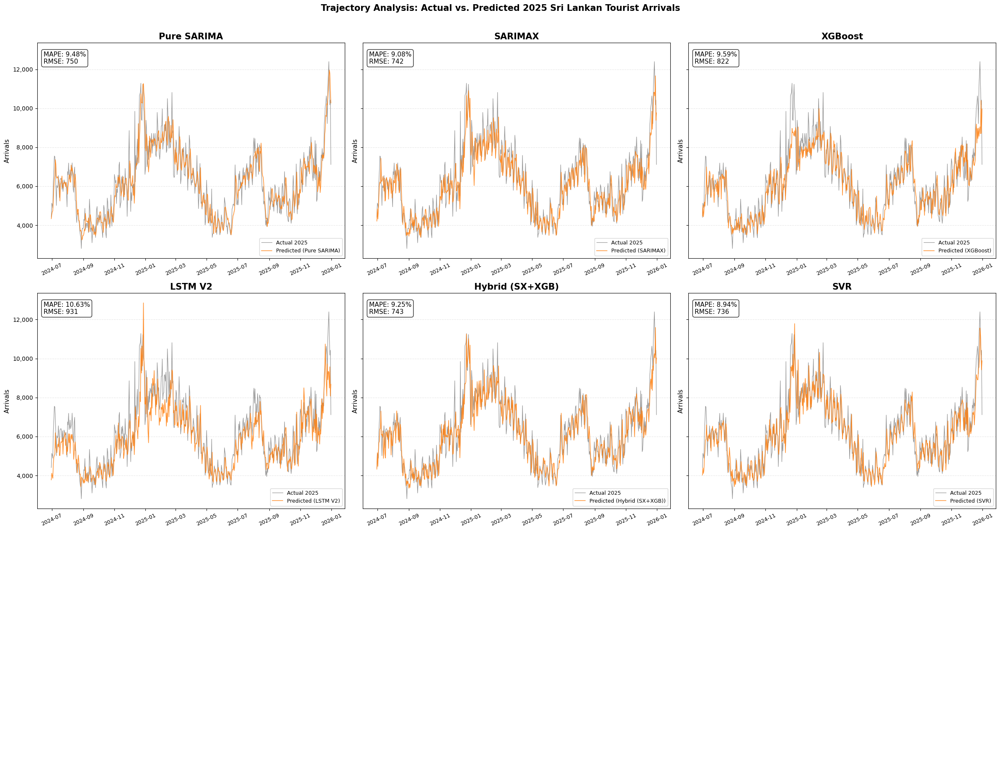

✅ Figure 6.1 saved.


In [ ]:
# ── Figure 6.1: Trajectory Analysis (3×3 grid, excluding Grid Search SVR) ─
plot_models = [(k, v) for k, v in model_preds.items() if k != 'Grid Search SVR']
mape_lookup  = {row['Model']: row for row in leaderboard}

fig, axes = plt.subplots(3, 3, figsize=(24, 18), sharey=True)
axes_f = axes.flatten()

for i, (name, preds) in enumerate(plot_models):
    ax = axes_f[i]
    lc = '#FF7F0E'
    ax.plot(dates_6, actuals_6.values, color='black', alpha=0.4, linewidth=0.9, label='Actual 2025')
    ax.plot(dates_6, preds.values,    color=lc,      alpha=0.85, linewidth=1.1, label=f'Predicted ({name})')
    m_row = mape_lookup[name]
    ax.text(0.02, 0.96, f"MAPE: {m_row['MAPE (%)']:.2f}%\nRMSE: {int(m_row['RMSE']):,}",
            transform=ax.transAxes, va='top', fontsize=11,
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.85))
    ax.set_title(name, fontsize=15, fontweight='bold')
    ax.set_ylabel('Arrivals', fontsize=11)
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{int(x):,}'))
    ax.tick_params(axis='x', rotation=25, labelsize=9)
    ax.legend(loc='lower right', fontsize=9)
    ax.grid(axis='y', linestyle='--', alpha=0.3)

for j in range(len(plot_models), len(axes_f)):
    axes_f[j].axis('off')

plt.suptitle('Trajectory Analysis: Actual vs. Predicted 2025 Sri Lankan Tourist Arrivals',
             fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('outputs/figures/6_1_Trajectory_Analysis.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 6.1 saved.')

## Code Walk-Through: Multi-Model Trajectory Comparison
**What this code does:** Plots actual vs predicted trajectories across all candidate models in a standardized panel view.
**What this shows:** Visual tracking reveals relative smoothness, lag, and peak-capture behavior by model.

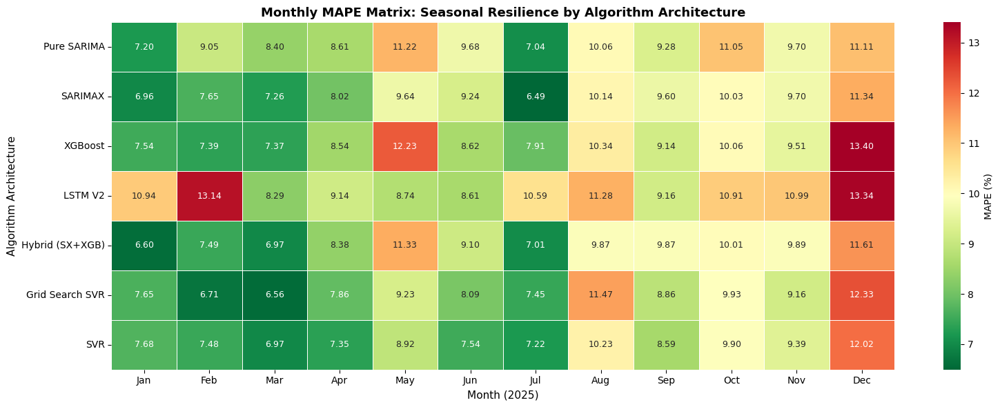

✅ Figure 6.2 saved.


In [ ]:
# ── Monthly MAPE Matrix ────────────────────────────────────────────────────
monthly_mape = {}
for name, preds in model_preds.items():
    mdf = pd.DataFrame({'Actual': actuals_6.values, 'Pred': preds.values}, index=dates_6)
    mdf['Month'] = mdf.index.month
    monthly_mape[name] = mdf.groupby('Month').apply(
        lambda g: mape(g['Actual'], g['Pred'])).to_dict()

mm_df = pd.DataFrame(monthly_mape).T.reindex(columns=range(1, 13))
mm_df.columns = [calendar.month_abbr[m] for m in mm_df.columns]

# ── Figure 6.2: Monthly Accuracy Heatmap ──────────────────────────────────
fig, ax = plt.subplots(figsize=(16, 6))
sns.heatmap(mm_df.astype(float), annot=True, fmt='.2f', cmap='RdYlGn_r',
            cbar_kws={'label': 'MAPE (%)'}, linewidths=0.4, ax=ax,
            annot_kws={'size': 9})
ax.set_title('Monthly MAPE Matrix: Seasonal Resilience by Algorithm Architecture',
             fontsize=13, fontweight='bold')
ax.set_xlabel('Month (2025)', fontsize=11)
ax.set_ylabel('Algorithm Architecture', fontsize=11)
ax.tick_params(axis='x', rotation=0)
plt.tight_layout()
plt.savefig('outputs/figures/6_2_Monthly_Accuracy_Heatmap.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 6.2 saved.')

## Code Walk-Through: Monthly MAPE Disaggregation
**What this code does:** Computes monthly error rates for each model and visualizes season-by-season forecast difficulty.
**What this shows:** Harder and easier calendar months become visible, revealing seasonal resilience differences across models.

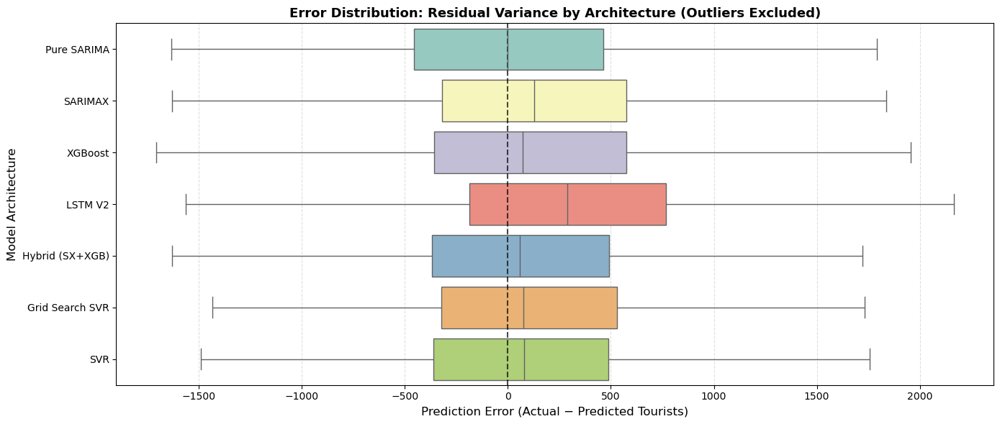

✅ Figure 6.3 saved.


In [ ]:
# ── Figure 6.3: Residual Variance Boxplot ─────────────────────────────────
df_resid = pd.DataFrame(residuals_dict)
fig, ax  = plt.subplots(figsize=(14, 6))
sns.boxplot(data=df_resid, orient='h', ax=ax, palette='Set3', showfliers=False,
            order=list(model_preds.keys()))
ax.axvline(x=0, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
ax.set_title('Error Distribution: Residual Variance by Architecture (Outliers Excluded)',
             fontsize=13, fontweight='bold')
ax.set_xlabel('Prediction Error (Actual − Predicted Tourists)', fontsize=12)
ax.set_ylabel('Model Architecture', fontsize=12)
ax.grid(axis='x', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('outputs/figures/6_3_Residual_Variance.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 6.3 saved.')

## Code Walk-Through: Residual Distribution Comparison
**What this code does:** Summarizes and plots residual spread for each model using consistent visual diagnostics.
**What this shows:** Error dispersion and asymmetry differences indicate which models are more stable versus volatile.

In [ ]:
# ── 6.4: Structural Break Regime-Wise Stress Test ─────────────────────────
print('--- 6.4: Regime-Wise Model Stress Test (Structural Break Analysis) ---')

def evaluate_by_regime(pred_df, actual_col, pred_col, regime_map):
    tmp = pred_df.copy()
    if 'Date' in tmp.columns:
        tmp = tmp.set_index('Date')
    tmp.index = pd.to_datetime(tmp.index)
    tmp = tmp.join(regime_map, how='inner').dropna(subset=[actual_col, pred_col, 'Regime'])
    denom = tmp[actual_col].replace(0, np.nan)
    tmp['APE'] = np.abs((tmp[actual_col] - tmp[pred_col]) / denom) * 100
    tmp['SE']  = (tmp[actual_col] - tmp[pred_col]) ** 2
    return tmp.groupby('Regime').agg(
        N=('APE', 'size'), MAPE_pct=('APE', 'mean'),
        RMSE=('SE', lambda x: float(np.sqrt(np.mean(x))))
    ).sort_index()

model_files = [
    ('SARIMA_Pure',     'outputs/csv/Model_Results_SARIMA_Pure_2025.csv',  'SARIMA_Pure_Predictions'),
    ('SARIMAX',         'outputs/csv/Model_Results_SARIMAX_2025.csv',      'SARIMAX_Predictions'),
    ('XGBoost',         'outputs/csv/Model_Results_XGBoost_2025.csv',      'XGBoost_Predictions'),
    ('LSTM_V2',         'outputs/csv/Model_Results_LSTM_V2_2025.csv',      'LSTM_V2_Predictions'),
    ('Hybrid_SX_XGB',   'outputs/csv/Model_Results_Sequential_Hybrid.csv', 'Sequential_Hybrid'),
    ('Grid_Search_SVR', 'outputs/csv/Model_Results_Grid_Search_SVR.csv',   'Grid_Search_SVR'),
    ('SVR_All_Weather', 'outputs/csv/Model_Results_SVR_2025.csv',          'SVR_All_Weather'),
]

# regime_map must have been built in Section 3.2
regime_tables = []
for model_name, fpath, pred_col in model_files:
    try:
        pdf = pd.read_csv(fpath)
        result = evaluate_by_regime(pdf, 'Actual_Arrivals', pred_col, regime_map)
        result.insert(0, 'Model', model_name)
        regime_tables.append(result.reset_index())
    except Exception as e:
        print(f'Skipping {model_name}: {e}')

if regime_tables:
    regime_perf = pd.concat(regime_tables, ignore_index=True)
    mape_matrix = regime_perf.pivot(index='Model', columns='Regime', values='MAPE_pct').round(2)
    regime_perf.to_csv('outputs/csv/Structural_Break_Model_Performance_By_Regime.csv', index=False)
    mape_matrix.to_csv('outputs/csv/Structural_Break_Model_MAPE_Matrix.csv')
    print('\nRegime MAPE matrix:')
    display(mape_matrix)
else:
    print('No regime data generated.')

--- 6.4: Regime-Wise Model Stress Test (Structural Break Analysis) ---

Regime MAPE matrix:


Regime,Regime_4,Regime_5
Model,,
Grid_Search_SVR,8.81,9.55
Hybrid_SX_XGB,8.58,10.02
LSTM_V2,10.74,10.50
SARIMAX,8.49,9.76
SARIMA_Pure,9.31,9.68
SVR_All_Weather,8.70,9.20
XGBoost,8.78,10.52


## Code Walk-Through: Regime-Wise Stress Test
**What this code does:** Joins forecasts with structural regimes and computes per-regime performance metrics.
**What this shows:** Regime-conditioned errors quantify model robustness before and after identified demand shifts.

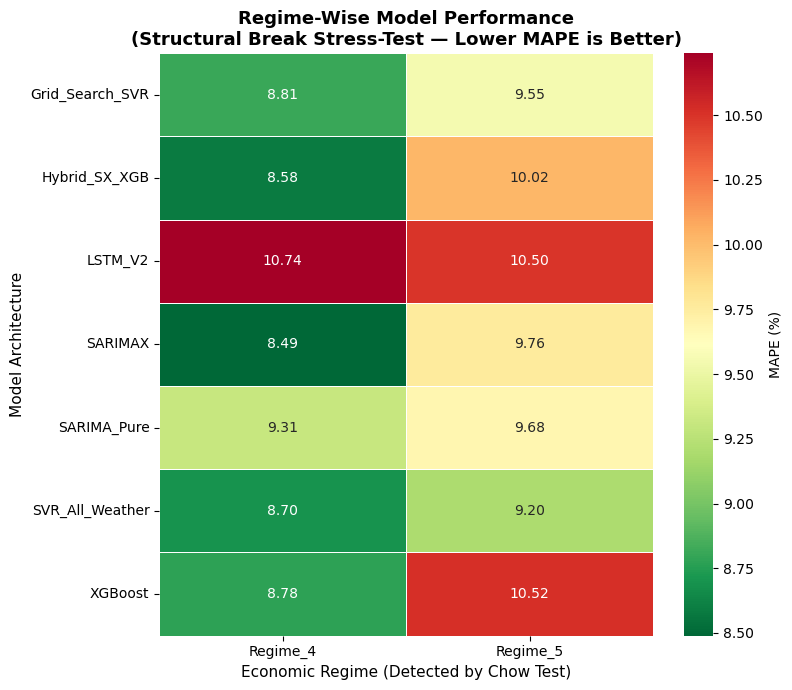

✅ Figure 6.4 saved.


In [ ]:
# ── Figure 6.4: Regime-Wise MAPE Heatmap ──────────────────────────────────
if regime_tables:
    fig, ax = plt.subplots(figsize=(max(8, len(mape_matrix.columns) * 1.8), 7))
    sns.heatmap(mape_matrix.astype(float), annot=True, fmt='.2f', cmap='RdYlGn_r',
                cbar_kws={'label': 'MAPE (%)'}, linewidths=0.5, ax=ax,
                annot_kws={'size': 10})
    ax.set_title('Regime-Wise Model Performance\n'
                 '(Structural Break Stress-Test — Lower MAPE is Better)',
                 fontsize=13, fontweight='bold')
    ax.set_xlabel('Economic Regime (Detected by Chow Test)', fontsize=11)
    ax.set_ylabel('Model Architecture', fontsize=11)
    ax.tick_params(axis='y', rotation=0)
    plt.tight_layout()
    plt.savefig('outputs/figures/6_4_Regime_MAPE_Heatmap.png', dpi=300, bbox_inches='tight')
    plt.show()
    print('Figure 6.4 saved.')

## Code Walk-Through: Regime Performance Heatmap
**What this code does:** Visualizes regime-specific MAPE in a model-by-regime matrix.
**What this shows:** Heat intensity highlights which models degrade most under post-break or low-exposure regimes.

CONFIDENCE INTERVAL SUMMARY  --  2025 Test Period
residuals = actual - predicted  |  positive Bias = model underestimates

  95% Prediction Intervals  (sorted by CI width):
          Model  Lower_Q  Upper_Q  Width  Coverage (%)  Bias  Std_Error
        SARIMAX    -1244     1589   2833          94.9   148        727
            SVR    -1266     1617   2883          94.9    99        730
    Pure SARIMA    -1349     1538   2887          94.9    26        750
Grid Search SVR    -1259     1672   2931          94.9   104        744
Hybrid (SX+XGB)    -1252     1705   2957          94.9    86        738
        XGBoost    -1238     1998   3236          94.9   127        812
        LSTM V2    -1157     2219   3376          94.9   347        864

  80% Prediction Intervals  (sorted by CI width):
          Model  Lower_Q  Upper_Q  Width  Coverage (%)  Bias  Std_Error
        SARIMAX     -704     1016   1719          80.0   148        727
            SVR     -749      998   1747          80.0  

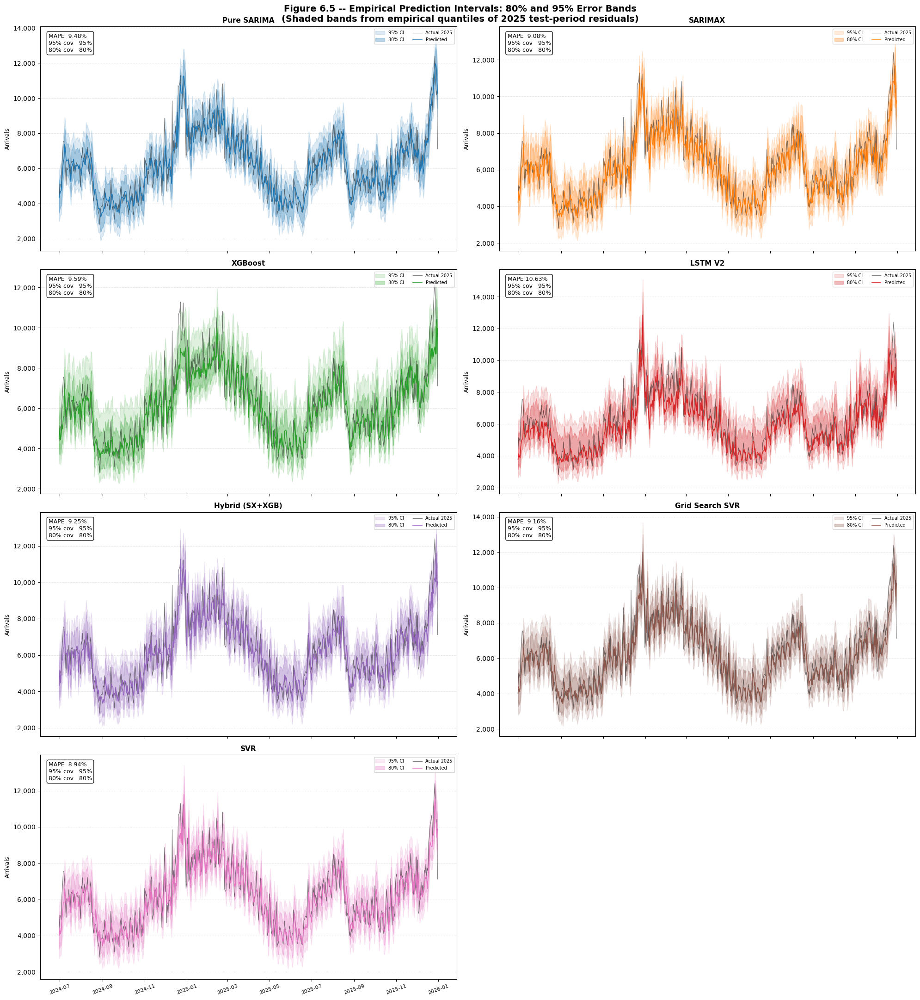

Saved: outputs/figures/6_5_Confidence_Intervals.png


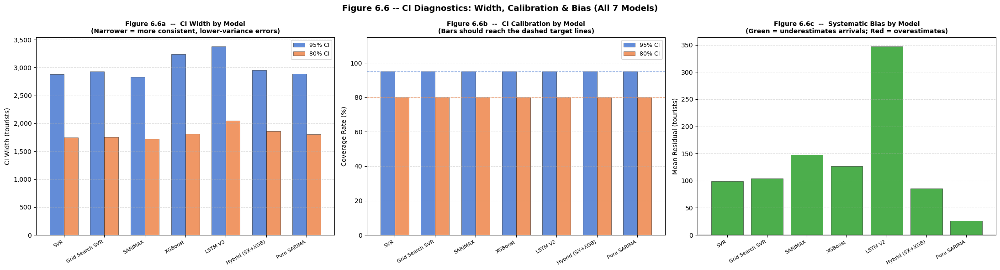

Saved: outputs/figures/6_6_CI_Diagnostics.png
Saved: outputs/csv/Model_Confidence_Intervals.csv


In [ ]:
# ── Chapter 6.5: Confidence Intervals & Error Band Analysis ──────────────────────────
# residuals = actual - predicted  (positive = model underpredicts)
# 95% CI: pred + [Q2.5(resid),  Q97.5(resid)]
# 80% CI: pred + [Q10(resid),   Q90(resid)]
# Coverage = % of actual values inside CI; Width = Q_hi - Q_lo in tourist units.

CONF = [("95%", 0.025, 0.975), ("80%", 0.10, 0.90)]
ci_records, ci_bands = [], {}

for name, preds in model_preds.items():
    resid = actuals_6.values - preds.values
    ci_bands[name] = {}
    for label, lo_q, hi_q in CONF:
        q_lo    = np.quantile(resid, lo_q)
        q_hi    = np.quantile(resid, hi_q)
        lower   = preds.values + q_lo
        upper   = preds.values + q_hi
        covered = np.mean(
            (actuals_6.values >= lower) & (actuals_6.values <= upper)
        ) * 100
        ci_bands[name][label] = {"lower": lower, "upper": upper}
        ci_records.append({
            "Model": name,
            "CI": label,
            "Lower_Q": int(round(q_lo)),
            "Upper_Q": int(round(q_hi)),
            "Width": int(round(q_hi - q_lo)),
            "Coverage (%)": round(covered, 1),
            "Bias": int(round(np.mean(resid))),
            "Std_Error": int(round(np.std(resid))),
        })

ci_df = pd.DataFrame(ci_records)
ci_df.to_csv("outputs/csv/Model_Confidence_Intervals.csv", index=False)

print("=" * 82)
print("CONFIDENCE INTERVAL SUMMARY  --  2025 Test Period")
print("residuals = actual - predicted  |  positive Bias = model underestimates")
print("=" * 82)
for ci_label in ["95%", "80%"]:
    sub = (ci_df[ci_df["CI"] == ci_label]
           .drop(columns="CI")
           .sort_values("Width")
           .reset_index(drop=True))
    print(f"\n  {ci_label} Prediction Intervals  (sorted by CI width):")
    print(sub.to_string(index=False))
print("=" * 82)
print("Width    : narrower = more consistent errors (lower variance)")
print("Coverage : should equal the CI level for a perfectly calibrated model")
print("Bias     : mean(actual - pred)")

# ── Figure 6.5: CI bands overlaid on predictions (all 7 models, 4x2 grid) ─
fig, axes = plt.subplots(4, 2, figsize=(20, 22), sharex=True)
axes_f = axes.flatten()
_palette = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728",
            "#9467bd", "#8c564b", "#e377c2"]

for k, (name, preds) in enumerate(model_preds.items()):
    ax  = axes_f[k]
    clr = _palette[k]
    res = actuals_6.values - preds.values
    q95_lo, q95_hi = np.quantile(res, 0.025), np.quantile(res, 0.975)
    q80_lo, q80_hi = np.quantile(res, 0.10),  np.quantile(res, 0.90)
    lo95, hi95 = preds.values + q95_lo, preds.values + q95_hi
    lo80, hi80 = preds.values + q80_lo, preds.values + q80_hi
    cov95 = np.mean((actuals_6.values >= lo95) & (actuals_6.values <= hi95)) * 100
    cov80 = np.mean((actuals_6.values >= lo80) & (actuals_6.values <= hi80)) * 100

    ax.fill_between(dates_6, lo95, hi95, color=clr, alpha=0.15, label="95% CI", zorder=2)
    ax.fill_between(dates_6, lo80, hi80, color=clr, alpha=0.30, label="80% CI", zorder=3)
    ax.plot(dates_6, actuals_6.values, color="black", alpha=0.50,
            linewidth=0.85, label="Actual 2025", zorder=4)
    ax.plot(dates_6, preds.values, color=clr, linewidth=1.2,
            label="Predicted", zorder=5)
    m_row = mape_lookup[name]
    ax.text(0.02, 0.97,
            f"MAPE {m_row['MAPE (%)']:>5.2f}%\n"
            f"95% cov {cov95:>4.0f}%\n"
            f"80% cov {cov80:>4.0f}%",
            transform=ax.transAxes, va="top", fontsize=9,
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.88))
    ax.set_title(name, fontsize=11, fontweight="bold")
    ax.set_ylabel("Arrivals", fontsize=9)
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):,}"))
    ax.grid(axis="y", linestyle="--", alpha=0.3)
    ax.legend(loc="upper right", fontsize=7, ncol=2)

axes_f[-1].axis("off")  # 7 models -> 1 empty subplot
for ax in axes[-1, :]:
    ax.tick_params(axis="x", rotation=20, labelsize=8)

plt.suptitle(
    "Figure 6.5 -- Empirical Prediction Intervals: 80% and 95% Error Bands\n"
    "(Shaded bands from empirical quantiles of 2025 test-period residuals)",
    fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("outputs/figures/6_5_Confidence_Intervals.png", dpi=300, bbox_inches="tight")
plt.show()
print("Saved: outputs/figures/6_5_Confidence_Intervals.png")

# ── Figure 6.6: CI Width, Calibration, and Bias (all models) ─────────────
_model_order = [
    "SVR", "Grid Search SVR", "SARIMAX",
    "XGBoost", "LSTM V2", "Hybrid (SX+XGB)", "Pure SARIMA"
]
width_df    = ci_df.pivot(index="Model", columns="CI", values="Width").reindex(_model_order)
coverage_df = ci_df.pivot(index="Model", columns="CI", values="Coverage (%)").reindex(_model_order)
bias_df     = (ci_df[ci_df["CI"] == "95%"]
               .set_index("Model")
               .reindex(_model_order)["Bias"])

fig, axes = plt.subplots(1, 3, figsize=(22, 6))
x  = np.arange(len(_model_order))
bw = 0.35
c1, c2 = "#4878D0", "#EE854A"

# 6.6a: CI Width
axes[0].bar(x - bw/2, width_df["95%"], width=bw, label="95% CI",
            color=c1, alpha=0.85, edgecolor="k", linewidth=0.4)
axes[0].bar(x + bw/2, width_df["80%"], width=bw, label="80% CI",
            color=c2, alpha=0.85, edgecolor="k", linewidth=0.4)
axes[0].set_xticks(x)
axes[0].set_xticklabels(_model_order, rotation=30, ha="right", fontsize=8)
axes[0].set_ylabel("CI Width (tourists)", fontsize=10)
axes[0].set_title("Figure 6.6a  --  CI Width by Model\n"
                  "(Narrower = more consistent, lower-variance errors)",
                  fontsize=10, fontweight="bold")
axes[0].legend(fontsize=9)
axes[0].grid(axis="y", linestyle="--", alpha=0.4)
axes[0].yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):,}"))

# 6.6b: Coverage
axes[1].bar(x - bw/2, coverage_df["95%"], width=bw, label="95% CI",
            color=c1, alpha=0.85, edgecolor="k", linewidth=0.4)
axes[1].bar(x + bw/2, coverage_df["80%"], width=bw, label="80% CI",
            color=c2, alpha=0.85, edgecolor="k", linewidth=0.4)
axes[1].axhline(95, color=c1, linestyle="--", linewidth=1.0, alpha=0.7)
axes[1].axhline(80, color=c2, linestyle="--", linewidth=1.0, alpha=0.7)
axes[1].set_xticks(x)
axes[1].set_xticklabels(_model_order, rotation=30, ha="right", fontsize=8)
axes[1].set_ylim(0, 115)
axes[1].set_ylabel("Coverage Rate (%)", fontsize=10)
axes[1].set_title("Figure 6.6b  --  CI Calibration by Model\n"
                  "(Bars should reach the dashed target lines)",
                  fontsize=10, fontweight="bold")
axes[1].legend(fontsize=9)
axes[1].grid(axis="y", linestyle="--", alpha=0.4)

# 6.6c: Bias
_colors_bias = ["#D62728" if v < 0 else "#2ca02c" for v in bias_df.values]
axes[2].bar(x, bias_df.values, color=_colors_bias, alpha=0.85, edgecolor="k", linewidth=0.4)
axes[2].axhline(0, color="black", linewidth=1.0)
axes[2].set_xticks(x)
axes[2].set_xticklabels(_model_order, rotation=30, ha="right", fontsize=8)
axes[2].set_ylabel("Mean Residual (tourists)", fontsize=10)
axes[2].set_title("Figure 6.6c  --  Systematic Bias by Model\n"
                  "(Green = underestimates arrivals; Red = overestimates)",
                  fontsize=10, fontweight="bold")
axes[2].grid(axis="y", linestyle="--", alpha=0.4)
axes[2].yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):,}"))

plt.suptitle("Figure 6.6 -- CI Diagnostics: Width, Calibration & Bias (All 7 Models)",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig("outputs/figures/6_6_CI_Diagnostics.png", dpi=300, bbox_inches="tight")
plt.show()
print("Saved: outputs/figures/6_6_CI_Diagnostics.png")
print("Saved: outputs/csv/Model_Confidence_Intervals.csv")


## Code Walk-Through: Empirical Confidence Intervals
**What this code does:** Builds 95% and 80% prediction intervals from residual quantiles and evaluates interval coverage/width.
**What this shows:** Calibration diagnostics indicate whether uncertainty bands are realistic, narrow, and practically useful.

In [ ]:
import shap
shap.initjs()

# ── Reload final model states & data ──────────────────────────────────────
# All models use their FINAL rolling state (most representative learned behaviour)
df_v1_s  = pd.read_csv('outputs/csv/Supervised_Feature_Matrix_2023_2025.csv', index_col='Date', parse_dates=True)
df_v1p_s = pd.read_csv('outputs/csv/Supervised_Feature_Matrix_PRUNED_2023_2025.csv', index_col='Date', parse_dates=True)
df_v2p_s = pd.read_csv('outputs/csv/Supervised_Feature_Matrix_PRUNED_V2_2023_2025.csv', index_col='Date', parse_dates=True)
df_v3_s  = pd.read_csv('outputs/csv/Supervised_Feature_Matrix_V3_2023_2025.csv', index_col='Date', parse_dates=True)

for df_ in [df_v1_s, df_v1p_s, df_v2p_s, df_v3_s]:
    for c in df_.columns:
        if df_[c].dtype == bool:
            df_[c] = df_[c].astype(float)

def split_xy(df_, label='Target_Arrivals_Log10', train_end=TRAIN_END_MODEL, test_start=TEST_START):
    tr = df_.loc[:train_end]
    te = df_.loc[test_start:]
    return (tr.drop(label, axis=1), tr[label],
            te.drop(label, axis=1), te[label])

X_tr_v1,  y_tr_v1,  X_te_v1,  _ = split_xy(df_v1_s)
X_tr_v1p, y_tr_v1p, X_te_v1p, _ = split_xy(df_v1p_s)
X_tr_v2p, y_tr_v2p, X_te_v2p, _ = split_xy(df_v2p_s)
X_tr_v3s, y_tr_v3s, X_te_v3s, _ = split_xy(df_v3_s)

print('Feature matrices loaded for SHAP analysis.')

✅ Feature matrices loaded for SHAP analysis.


## Code Walk-Through: SHAP Data Preparation
**What this code does:** Loads model outputs and aligned feature matrices, then prepares train/test subsets for explainability workflows.
**What this shows:** Inputs for consistent cross-model SHAP analysis are standardized and ready.

--- 7.2: SARIMAX Feature Importance (Standardised Coefficients) ---


c:\Users\TechYard\.conda\envs\CSEDS\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\TechYard\.conda\envs\CSEDS\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\TechYard\.conda\envs\CSEDS\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


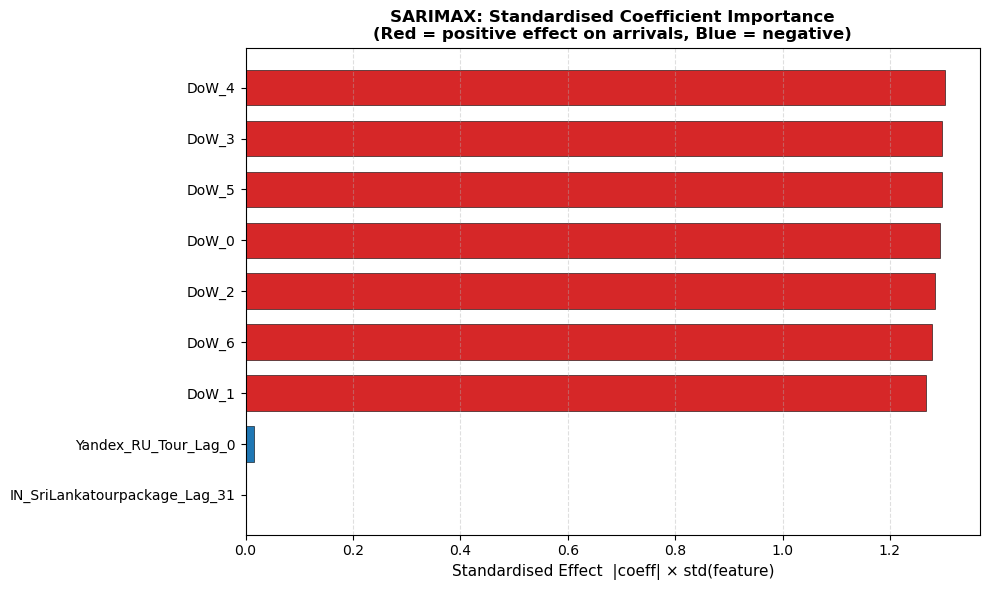

✅ Figure 7.1 saved.


In [ ]:
# ── 7.2: SARIMAX — Standardised Coefficient Importance ────────────────────
print('--- 7.2: SARIMAX Feature Importance (Standardised Coefficients) ---')
drop_lags_s = [c for c in df_v3_s.columns if c.startswith('Arrivals_Lag_')]
df_sx_s = df_v3_s.drop(columns=drop_lags_s)
tr_sx_s = df_sx_s.loc[:TRAIN_END_MODEL]
y_tr_sx_s = tr_sx_s['Target_Arrivals_Log10']
X_tr_sx_s = tr_sx_s.drop('Target_Arrivals_Log10', axis=1)

m_sx_s = SARIMAX(endog=y_tr_sx_s, exog=X_tr_sx_s, order=(1,0,1), seasonal_order=(1,0,0,7),
                 enforce_stationarity=False).fit(disp=False)

exog_params = m_sx_s.params[X_tr_sx_s.columns]
std_effects = (exog_params.abs() * X_tr_sx_s.std()).sort_values(ascending=False)

shap_sarimax = pd.DataFrame({'feature': std_effects.index, 'standardised_effect': std_effects.values,
                              'coefficient': exog_params[std_effects.index].values})
shap_sarimax.to_csv('outputs/csv/shap_sarimax.csv', index=False)

# Figure 7.1
fig, ax = plt.subplots(figsize=(10, 6))
colors_sax = ['#D62728' if v > 0 else '#1f77b4' for v in shap_sarimax['coefficient']]
bars = ax.barh(shap_sarimax['feature'][::-1], shap_sarimax['standardised_effect'][::-1],
               color=colors_sax[::-1], edgecolor='black', linewidth=0.4, height=0.7)
ax.set_xlabel('Standardised Effect  |coeff| × std(feature)', fontsize=11)
ax.set_title('SARIMAX: Standardised Coefficient Importance\n'
             '(Red = positive effect on arrivals, Blue = negative)', fontsize=12, fontweight='bold')
ax.grid(axis='x', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig('outputs/figures/7_1_SARIMAX_Importance.png', dpi=300, bbox_inches='tight')
plt.savefig('outputs/plots/phase1_sarimax_bar.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 7.1 saved.')

## Code Walk-Through: SARIMAX Importance via Standardized Coefficients
**What this code does:** Converts SARIMAX coefficients into comparable impact scores using absolute coefficient times feature standard deviation.
**What this shows:** Calendar and selected exogenous effects are ranked within the linear state-space model.

--- 7.3: XGBoost & Random Forest SHAP (TreeExplainer) ---


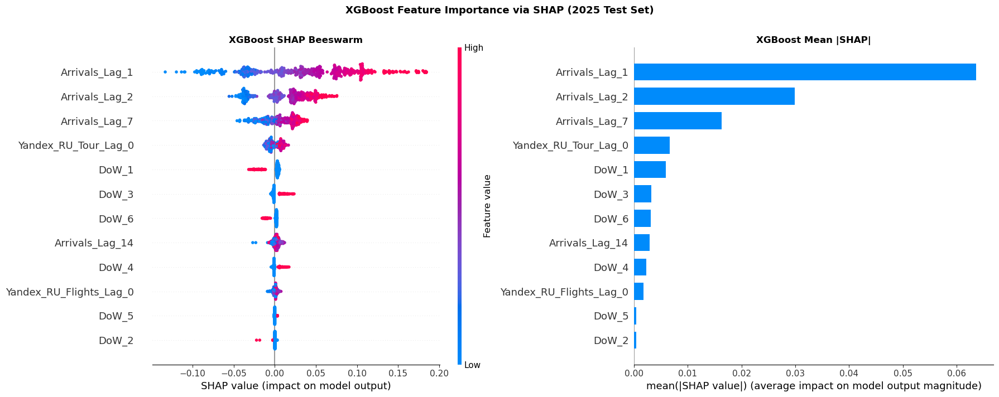

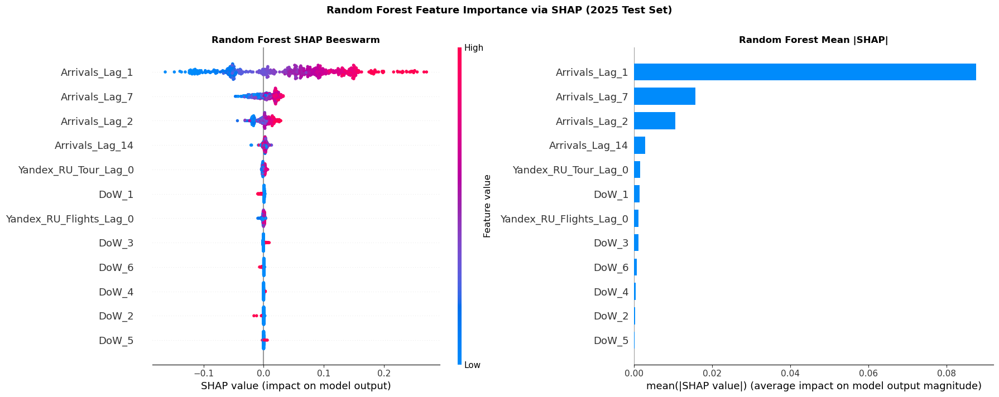

✅ Figures 7.2 & 7.3 saved.


In [ ]:
# ── 7.3: XGBoost & Random Forest — TreeExplainer ──────────────────────────
print('--- 7.3: XGBoost & Random Forest SHAP (TreeExplainer) ---')

# Retrain on full training set for SHAP (final state)
xgb_s = XGBRegressor(n_estimators=100, learning_rate=0.05, max_depth=4, random_state=42)
rf_s  = RandomForestRegressor(n_estimators=100, max_depth=6, random_state=42)

# Rolling retrain to final state (last 7-day batch includes all 2025 data)
cX_s, cy_s = X_tr_v1p.copy(), y_tr_v1p.copy()
for i in range(len(X_te_v1p)):
    cX_s = pd.concat([cX_s, X_te_v1p.iloc[[i]]])
    cy_s_val = pd.read_csv('outputs/csv/Model_Results_XGBoost_2025.csv')['Actual_Arrivals'].iloc[i]
    # Use actual log value
    cy_s = pd.concat([cy_s, pd.Series([np.log10(cy_s_val + 10)], index=[X_te_v1p.index[i]])])

xgb_s.fit(cX_s, cy_s); rf_s.fit(cX_s, cy_s)

explainer_xgb = shap.TreeExplainer(xgb_s)
explainer_rf  = shap.TreeExplainer(rf_s)
shap_xgb_vals = explainer_xgb.shap_values(X_te_v1p)
shap_rf_vals  = explainer_rf.shap_values(X_te_v1p)

# Save CSVs
pd.DataFrame(shap_xgb_vals, columns=X_te_v1p.columns, index=X_te_v1p.index).to_csv('outputs/csv/shap_xgboost.csv')
pd.DataFrame(shap_rf_vals,  columns=X_te_v1p.columns, index=X_te_v1p.index).to_csv('outputs/csv/shap_random_forest.csv')

# Figure 7.2a: XGBoost beeswarm
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
plt.sca(axes[0])
shap.summary_plot(shap_xgb_vals, X_te_v1p, show=False, max_display=12, plot_size=None)
axes[0].set_title('XGBoost SHAP Beeswarm', fontsize=12, fontweight='bold')

plt.sca(axes[1])
shap.summary_plot(shap_xgb_vals, X_te_v1p, plot_type='bar', show=False, max_display=12, plot_size=None)
axes[1].set_title('XGBoost Mean |SHAP|', fontsize=12, fontweight='bold')

plt.suptitle('XGBoost Feature Importance via SHAP (2025 Test Set)', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('outputs/figures/7_2_XGBoost_SHAP.png', dpi=300, bbox_inches='tight')
plt.savefig('outputs/plots/phase2a_xgboost_beeswarm.png', dpi=300, bbox_inches='tight')
plt.show()

# Figure 7.3: Random Forest beeswarm
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
plt.sca(axes[0])
shap.summary_plot(shap_rf_vals, X_te_v1p, show=False, max_display=12, plot_size=None)
axes[0].set_title('Random Forest SHAP Beeswarm', fontsize=12, fontweight='bold')
plt.sca(axes[1])
shap.summary_plot(shap_rf_vals, X_te_v1p, plot_type='bar', show=False, max_display=12, plot_size=None)
axes[1].set_title('Random Forest Mean |SHAP|', fontsize=12, fontweight='bold')
plt.suptitle('Random Forest Feature Importance via SHAP (2025 Test Set)', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('outputs/figures/7_3_RandomForest_SHAP.png', dpi=300, bbox_inches='tight')
plt.savefig('outputs/plots/phase2a_rf_beeswarm.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figures 7.2 & 7.3 saved.')

## Code Walk-Through: Tree SHAP (XGBoost and Random Forest)
**What this code does:** Applies TreeExplainer to compute exact SHAP values and generates summary visualizations for both tree models.
**What this shows:** Dominant autoregressive and exogenous drivers are quantified and compared across ensemble learners.

--- 7.4: SVR Champion SHAP (KernelExplainer) ---


100%|██████████| 40/40 [00:05<00:00,  7.05it/s]


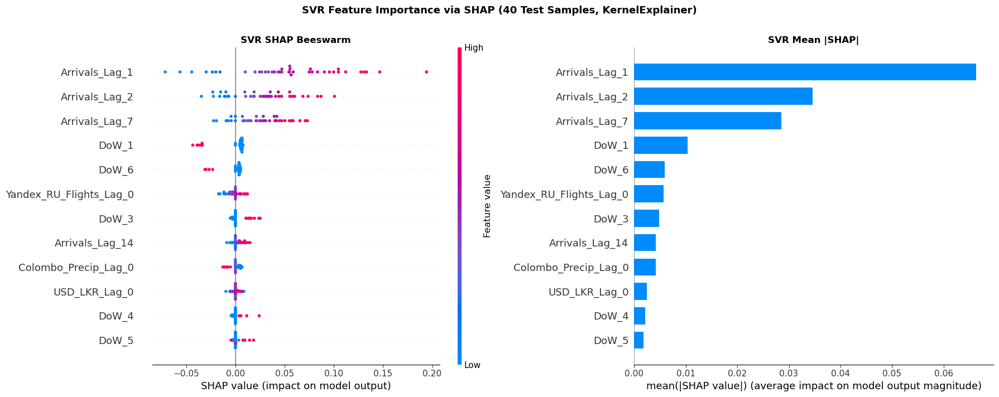

✅ Figure 7.4 saved.


In [ ]:
# ── 7.4: SVR Champion — KernelExplainer ───────────────────────────────────
print('--- 7.4: SVR Champion SHAP (KernelExplainer) ---')
svr_shap = SVR(kernel='rbf', C=10.0, epsilon=0.01, gamma='scale')
svr_shap.fit(X_tr_v1, y_tr_v1)

# k-means background (30 points to balance speed/accuracy)
bg_svr = shap.kmeans(X_tr_v1, 30)
# Sample 40 test points
test_sample_svr = X_te_v1.sample(40, random_state=42)

explainer_svr = shap.KernelExplainer(svr_shap.predict, bg_svr)
shap_svr_vals = explainer_svr.shap_values(test_sample_svr, nsamples=100)

pd.DataFrame(shap_svr_vals, columns=test_sample_svr.columns,
             index=test_sample_svr.index).to_csv('outputs/csv/shap_svr.csv')

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
plt.sca(axes[0])
shap.summary_plot(shap_svr_vals, test_sample_svr, show=False, max_display=12, plot_size=None)
axes[0].set_title('SVR SHAP Beeswarm', fontsize=12, fontweight='bold')
plt.sca(axes[1])
shap.summary_plot(shap_svr_vals, test_sample_svr, plot_type='bar', show=False, max_display=12, plot_size=None)
axes[1].set_title('SVR Mean |SHAP|', fontsize=12, fontweight='bold')
plt.suptitle('SVR Feature Importance via SHAP (40 Test Samples, KernelExplainer)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('outputs/figures/7_4_SVR_SHAP.png', dpi=300, bbox_inches='tight')
plt.savefig('outputs/plots/phase3_svr_beeswarm.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 7.4 saved.')

## Code Walk-Through: SVR Kernel SHAP
**What this code does:** Uses KernelExplainer with sampled test points and compact background sets to approximate SHAP for SVR.
**What this shows:** Feature influence in a nonparametric kernel model is interpreted on the same test horizon.

--- 7.4b: Grid Search SVR SHAP (KernelExplainer) ---


100%|██████████| 40/40 [00:04<00:00,  8.57it/s]


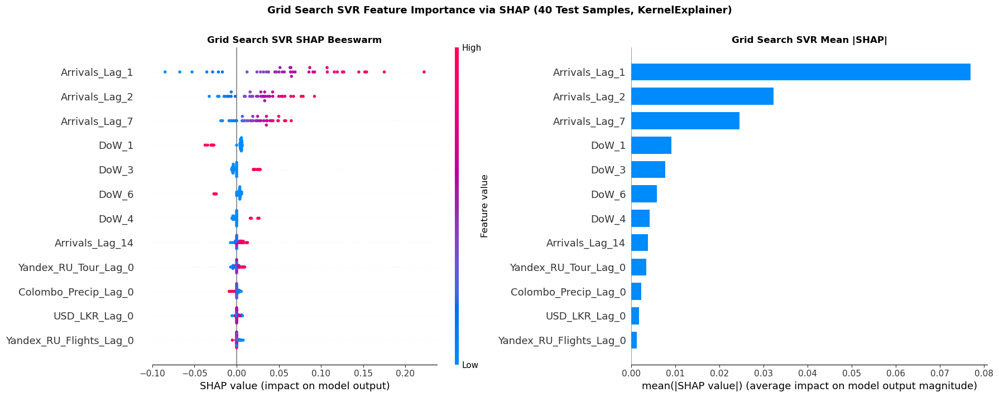

✅ Figure 7.4b saved.


In [ ]:
# ── 7.4b: Grid Search SVR — KernelExplainer ───────────────────────────────
print('--- 7.4b: Grid Search SVR SHAP (KernelExplainer) ---')

df_grid_shap = pd.read_csv('outputs/csv/Supervised_Feature_Matrix_2023_2025.csv',
                           index_col='Date', parse_dates=True)
for c in df_grid_shap.columns:
    if df_grid_shap[c].dtype == bool:
        df_grid_shap[c] = df_grid_shap[c].astype(float)

tr_grid = df_grid_shap.loc[:TRAIN_END_MODEL]
te_grid = df_grid_shap.loc[TEST_START:TEST_END]
X_tr_grid = tr_grid.drop('Target_Arrivals_Log10', axis=1)
y_tr_grid = tr_grid['Target_Arrivals_Log10']
X_te_grid = te_grid.drop('Target_Arrivals_Log10', axis=1)

if 'dyn_svr' in globals() and hasattr(dyn_svr, 'predict'):
    grid_svr_shap = dyn_svr
else:
    grid_svr_shap = SVR(kernel='rbf', C=10.0, epsilon=0.01, gamma='scale')
    grid_svr_shap.fit(X_tr_grid, y_tr_grid)

bg_grid = shap.kmeans(X_tr_grid, 30)
sample_n = min(40, len(X_te_grid))
test_sample_grid = X_te_grid.sample(sample_n, random_state=42) if len(X_te_grid) > sample_n else X_te_grid.copy()

explainer_grid = shap.KernelExplainer(grid_svr_shap.predict, bg_grid)
shap_grid_vals = explainer_grid.shap_values(test_sample_grid, nsamples=100)

pd.DataFrame(shap_grid_vals, columns=test_sample_grid.columns,
             index=test_sample_grid.index).to_csv('outputs/csv/shap_grid_search_svr.csv')

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
plt.sca(axes[0])
shap.summary_plot(shap_grid_vals, test_sample_grid, show=False, max_display=12, plot_size=None)
axes[0].set_title('Grid Search SVR SHAP Beeswarm', fontsize=12, fontweight='bold')
plt.sca(axes[1])
shap.summary_plot(shap_grid_vals, test_sample_grid, plot_type='bar', show=False, max_display=12, plot_size=None)
axes[1].set_title('Grid Search SVR Mean |SHAP|', fontsize=12, fontweight='bold')
plt.suptitle('Grid Search SVR Feature Importance via SHAP (40 Test Samples, KernelExplainer)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('outputs/figures/7_4b_GridSearch_SVR_SHAP.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 7.4b saved.')

## Code Walk-Through: Dynamic Grid SVR SHAP
**What this code does:** Repeats Kernel SHAP for the dynamically tuned SVR variant to inspect whether tuning shifts feature reliance.
**What this shows:** Importance profiles can be contrasted against fixed-SVR to assess interpretability consistency.

--- 7.5: LSTM SHAP (KernelExplainer on flattened features) ---


100%|██████████| 40/40 [00:10<00:00,  3.95it/s]


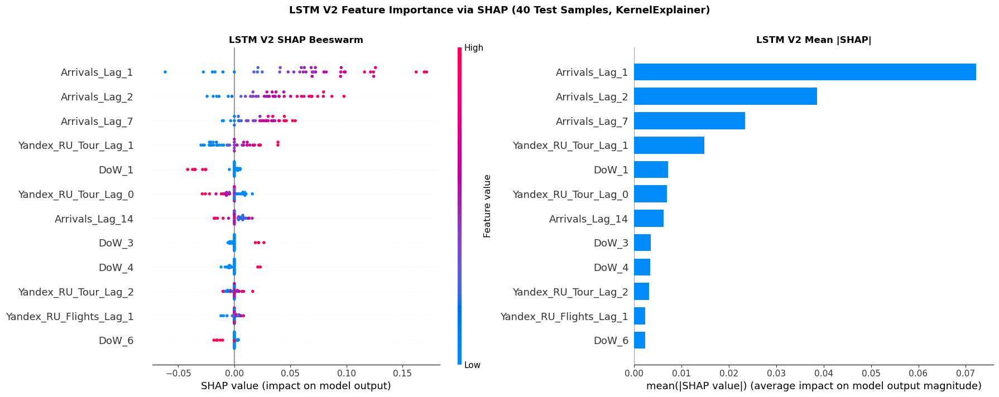

✅ Figure 7.5 saved.


In [ ]:
# ── 7.5: LSTM — KernelExplainer ───────────────────────────────────────────
print('--- 7.5: LSTM SHAP (KernelExplainer on flattened features) ---')

# Wrap LSTM to accept 2D input (KernelExplainer requires tabular format)
def lstm_predict_2d(X_2d):
    X_3d = X_2d.reshape(X_2d.shape[0], 1, X_2d.shape[1])
    return lstm_model.predict(X_3d, verbose=0).flatten()

bg_lstm = shap.kmeans(X_tr_v2p.values, 30)
sample_idx   = np.random.choice(len(X_te_v2p), 40, replace=False)
test_samp_l  = X_te_v2p.iloc[sample_idx]

explainer_l  = shap.KernelExplainer(lstm_predict_2d, bg_lstm)
shap_lstm_v  = explainer_l.shap_values(test_samp_l.values, nsamples=100)

pd.DataFrame(shap_lstm_v, columns=test_samp_l.columns,
             index=test_samp_l.index).to_csv('outputs/csv/shap_lstm.csv')

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
plt.sca(axes[0])
shap.summary_plot(shap_lstm_v, test_samp_l, show=False, max_display=12, plot_size=None)
axes[0].set_title('LSTM V2 SHAP Beeswarm', fontsize=12, fontweight='bold')
plt.sca(axes[1])
shap.summary_plot(shap_lstm_v, test_samp_l, plot_type='bar', show=False, max_display=12, plot_size=None)
axes[1].set_title('LSTM V2 Mean |SHAP|', fontsize=12, fontweight='bold')
plt.suptitle('LSTM V2 Feature Importance via SHAP (40 Test Samples, KernelExplainer)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('outputs/figures/7_5_LSTM_SHAP.png', dpi=300, bbox_inches='tight')
plt.savefig('outputs/plots/phase2b_lstm_beeswarm.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 7.5 saved.')

## Code Walk-Through: LSTM SHAP Approximation
**What this code does:** Adapts sequence-shaped LSTM inputs for Kernel SHAP estimation and computes feature attributions on sampled test points.
**What this shows:** Temporal-lag importance in the deep model is made comparable to other architectures.

--- 7.6: Hybrid XGBoost Corrector SHAP (TreeExplainer) ---


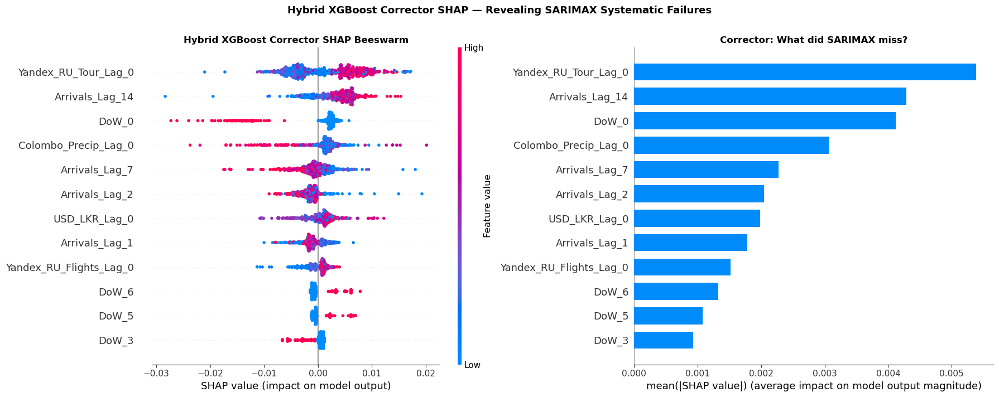

✅ Figure 7.6 saved.


In [ ]:
# ── 7.6: Hybrid XGBoost Corrector — TreeExplainer ─────────────────────────
print('--- 7.6: Hybrid XGBoost Corrector SHAP (TreeExplainer) ---')
# xgb_h is the corrector trained in Phase 4; reuse it here
explainer_hyb = shap.TreeExplainer(xgb_h)
shap_hyb_vals = explainer_hyb.shap_values(X_te_xg_h)

pd.DataFrame(shap_hyb_vals, columns=X_te_xg_h.columns,
             index=X_te_xg_h.index).to_csv('outputs/csv/shap_hybrid_xgb_corrector.csv')

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
plt.sca(axes[0])
shap.summary_plot(shap_hyb_vals, X_te_xg_h, show=False, max_display=12, plot_size=None)
axes[0].set_title('Hybrid XGBoost Corrector SHAP Beeswarm', fontsize=12, fontweight='bold')
plt.sca(axes[1])
shap.summary_plot(shap_hyb_vals, X_te_xg_h, plot_type='bar', show=False, max_display=12, plot_size=None)
axes[1].set_title('Corrector: What did SARIMAX miss?', fontsize=12, fontweight='bold')
plt.suptitle('Hybrid XGBoost Corrector SHAP — Revealing SARIMAX Systematic Failures',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('outputs/figures/7_6_Hybrid_Corrector_SHAP.png', dpi=300, bbox_inches='tight')
plt.savefig('outputs/plots/phase4_hybrid_beeswarm.png', dpi=300, bbox_inches='tight')
plt.show()
print('Figure 7.6 saved.')

## Code Walk-Through: Hybrid Residual-Corrector SHAP
**What this code does:** Explains the hybrid model’s correction layer using tree-based SHAP values.
**What this shows:** The features driving error correction indicate where the base SARIMAX model under- or over-reacts.

In [ ]:
# ── Build cross-model importance table from saved CSVs ────────────────────
shap_files = {
    'SARIMAX':      ('outputs/csv/shap_sarimax.csv',              'standardised_effect', 'feature'),
    'XGBoost':      ('outputs/csv/shap_xgboost.csv',              None, None),
    'Random Forest':('outputs/csv/shap_random_forest.csv',        None, None),
    'LSTM V2':      ('outputs/csv/shap_lstm.csv',                 None, None),
    'SVR':          ('outputs/csv/shap_svr.csv',                  None, None),
    'Grid Search SVR': ('outputs/csv/shap_grid_search_svr.csv',   None, None),
    'Hybrid XGB':   ('outputs/csv/shap_hybrid_xgb_corrector.csv', None, None),
}

mean_abs_shap = {}
for model_name, (fpath, val_col, feat_col) in shap_files.items():
    try:
        if val_col is not None:
            # SARIMAX summary CSV: expects explicit feature/value columns.
            df_ = pd.read_csv(fpath)

            # Fallback if feature was written as an unnamed index column.
            if feat_col not in df_.columns:
                unnamed_cols = [c for c in df_.columns if str(c).startswith('Unnamed')]
                if unnamed_cols:
                    df_ = df_.rename(columns={unnamed_cols[0]: feat_col})

            required_cols = {feat_col, val_col}
            missing_cols = required_cols - set(df_.columns)
            if missing_cols:
                raise ValueError(
                    f"Missing columns {sorted(missing_cols)} in {fpath}. "
                    f"Found columns: {list(df_.columns)}"
                )

            sar_df = df_[[feat_col, val_col]].dropna()
            mean_abs_shap[model_name] = sar_df.groupby(feat_col)[val_col].mean().to_dict()
        else:
            # SHAP matrix CSVs: rows are samples, columns are features.
            df_ = pd.read_csv(fpath, index_col=0)
            numeric_cols = df_.select_dtypes(include=[np.number]).columns
            if len(numeric_cols) == 0:
                raise ValueError(f"No numeric SHAP columns found in {fpath}")
            mean_abs_shap[model_name] = df_[numeric_cols].abs().mean().to_dict()

    except FileNotFoundError:
        print(f'{fpath} not found — run SHAP sections above first.')
    except Exception as e:
        print(f'Skipping {model_name}: {e}')

if not mean_abs_shap:
    raise ValueError('No SHAP summaries could be loaded. Run sections 7.2–7.6 first.')

# ── Normalise per model ────────────────────────────────────────────────────
impact_df = pd.DataFrame(mean_abs_shap).fillna(0.0)
col_max = impact_df.max(axis=0).replace(0, np.nan)
normalised = impact_df.div(col_max, axis=1).fillna(0.0)

# Identify top shared features across models
top_features = impact_df.mean(axis=1).sort_values(ascending=False).head(15).index
impact_top = normalised.loc[top_features]

# Save master table
impact_df.to_csv('outputs/csv/final_feature_impact_table.csv')
print('Cross-model impact table saved: outputs/csv/final_feature_impact_table.csv')
print(f'Models included: {list(mean_abs_shap.keys())}')

✅ Cross-model impact table saved: outputs/csv/final_feature_impact_table.csv
Models included: ['SARIMAX', 'XGBoost', 'Random Forest', 'LSTM V2', 'SVR', 'Grid Search SVR', 'Hybrid XGB']


## Code Walk-Through: Cross-Model SHAP Aggregation
**What this code does:** Consolidates per-model mean absolute SHAP statistics into a normalized impact table.
**What this shows:** A unified feature-importance frame enables direct interpretability comparison across all models.

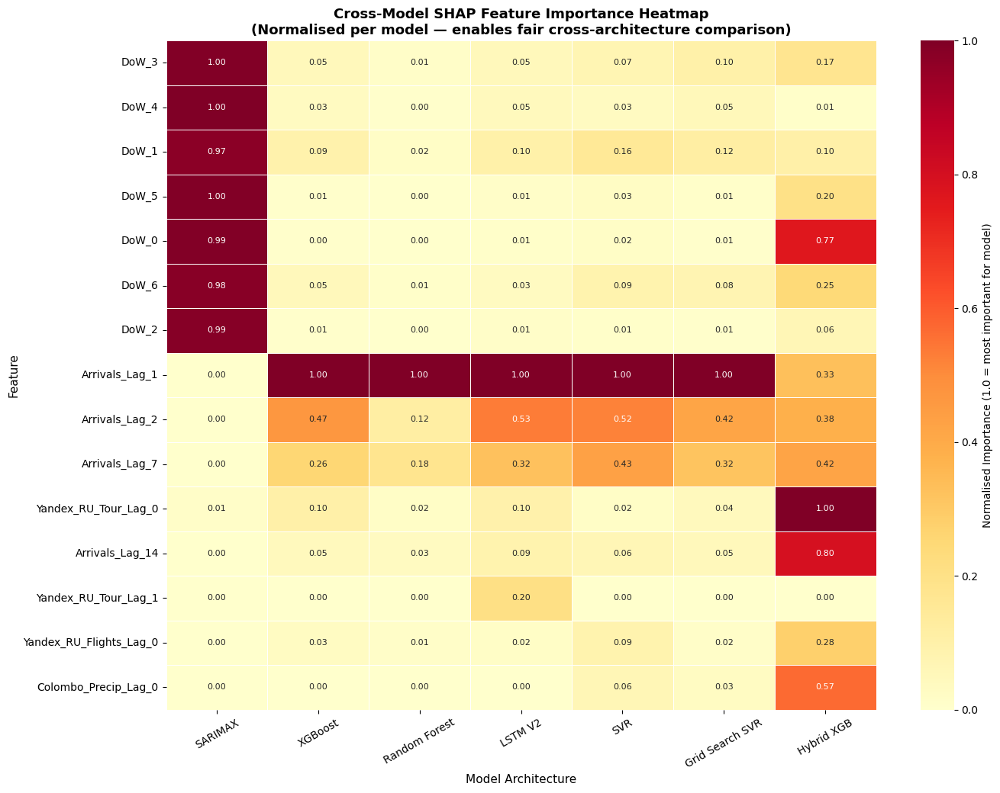

✅ Figure 7.7 saved.


In [ ]:
# ── Figure 7.7: Cross-Model Normalised SHAP Heatmap ───────────────────────
if len(impact_top) > 0:
    fig, ax = plt.subplots(figsize=(max(10, len(impact_top.columns) * 2), max(8, len(impact_top) * 0.7)))
    sns.heatmap(impact_top.astype(float), cmap='YlOrRd', annot=True, fmt='.2f',
                cbar_kws={'label': 'Normalised Importance (1.0 = most important for model)'},
                linewidths=0.4, ax=ax, annot_kws={'size': 8})
    ax.set_title('Cross-Model SHAP Feature Importance Heatmap\n'
                 '(Normalised per model — enables fair cross-architecture comparison)',
                 fontsize=13, fontweight='bold')
    ax.set_xlabel('Model Architecture', fontsize=11)
    ax.set_ylabel('Feature', fontsize=11)
    ax.tick_params(axis='x', rotation=30)
    ax.tick_params(axis='y', rotation=0)
    plt.tight_layout()
    plt.savefig('outputs/figures/7_7_CrossModel_SHAP_Heatmap.png', dpi=300, bbox_inches='tight')
    plt.savefig('outputs/plots/cross_model_heatmap.png', dpi=300, bbox_inches='tight')
    plt.show()
    print('Figure 7.7 saved.')

## Code Walk-Through: SHAP Heatmap Across Models
**What this code does:** Renders a normalized feature-vs-model heatmap using top-ranked cross-model drivers.
**What this shows:** Shared and model-specific dependence patterns are visible at a glance.

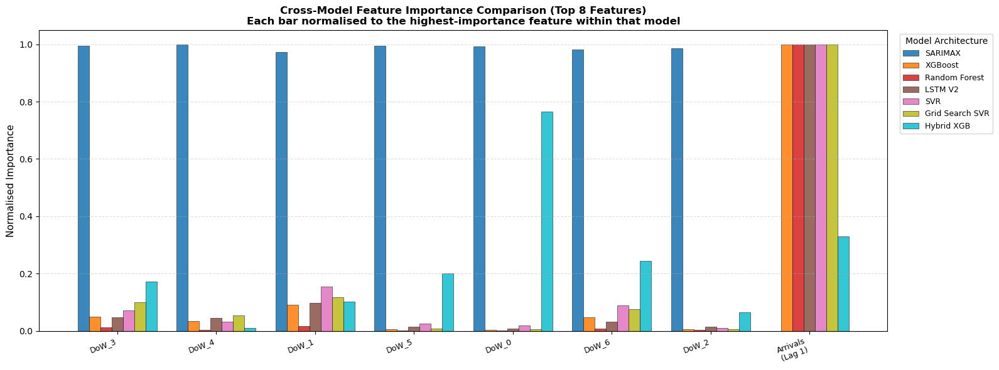

✅ Figure 7.8 saved.


In [ ]:
# ── Figure 7.8: Cross-Model Grouped Bar Chart (Top 8 features) ────────────
if len(impact_top) > 0:
    top8 = impact_df.mean(axis=1).sort_values(ascending=False).head(8).index
    plot_data = normalised.loc[normalised.index.isin(top8)]

    x    = np.arange(len(top8))
    n_m  = len(plot_data.columns)
    w    = 0.8 / n_m
    cmap = plt.cm.get_cmap('tab10', n_m)

    fig, ax = plt.subplots(figsize=(16, 6))
    for j, model_name in enumerate(plot_data.columns):
        vals = [plot_data.loc[f, model_name] if f in plot_data.index else 0 for f in top8]
        ax.bar(x + j * w - (n_m - 1) * w / 2, vals, width=w, label=model_name,
               color=cmap(j), edgecolor='black', linewidth=0.4, alpha=0.88)

    ax.set_xticks(x)
    ax.set_xticklabels([f.replace('_Lag_', '\n(Lag ') + (')' if 'Lag' in f else '') for f in top8],
                       rotation=20, ha='right', fontsize=9)
    ax.set_ylabel('Normalised Importance', fontsize=11)
    ax.set_title('Cross-Model Feature Importance Comparison (Top 8 Features)\n'
                 'Each bar normalised to the highest-importance feature within that model',
                 fontsize=12, fontweight='bold')
    ax.legend(title='Model Architecture', bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=9)
    ax.grid(axis='y', linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.savefig('outputs/figures/7_8_CrossModel_Bar_Chart.png', dpi=300, bbox_inches='tight')
    plt.savefig('outputs/plots/cross_model_feature_importance.png', dpi=300, bbox_inches='tight')
    plt.show()
    print('Figure 7.8 saved.')

## Code Walk-Through: Cross-Model SHAP Grouped Bars
**What this code does:** Plots top features as grouped normalized bars for all model families.
**What this shows:** Relative feature dominance and agreement/disagreement among models are clearly compared in one figure.

---
## Final Output File Registry

### Generated Figures (`outputs/figures/`)

| File | Description |
|---|---|
| `3_1_Variance_Stabilisation.png` | Raw vs. Log₁₀ transformed arrivals |
| `3_2_Structural_Break_Diagnostics.png` | Chow scan + regime visualisation |
| `4_1_Seasonal_Decomposition.png` | 7-day additive decomposition |
| `4_2_ACF_PACF.png` | Autocorrelation and partial autocorrelation |
| `4_3_Granger_Causality_Heatmap.png` | Raw p / FDR q / significance — weekly Granger |
| `4_4_Comprehensive_CCF_Grid.png` | All features — peak CCF lag per feature |
| `4_5_CCF_Intent_Categorisation.png` | Retained vs. pruned intent signals |
| `4_6_Feature_Screening.png` | Maximum predictive strength (ranked bar chart) |
| `4_7_Multicollinearity_Matrix.png` | Pearson matrix of shifted features |
| `6_1_Trajectory_Analysis.png` | All architectures vs. actual 2025 arrivals |
| `6_2_Monthly_Accuracy_Heatmap.png` | Monthly MAPE matrix (seasonal resilience) |
| `6_3_Residual_Variance.png` | Error distribution boxplot |
| `6_4_Regime_MAPE_Heatmap.png` | Regime-wise stress test |
| `6_5_Confidence_Intervals.png` | 80% and 95% empirical prediction bands — all 7 models |
| `6_6_CI_Diagnostics.png` | CI width, calibration, and bias comparison |
| `7_1_SARIMAX_Importance.png` | Standardised coefficient bar chart |
| `7_2_XGBoost_SHAP.png` | XGBoost beeswarm + bar |
| `7_3_RandomForest_SHAP.png` | Random Forest beeswarm + bar |
| `7_4_SVR_SHAP.png` | SVR beeswarm + bar |
| `7_5_LSTM_SHAP.png` | LSTM V2 beeswarm + bar |
| `7_6_Hybrid_Corrector_SHAP.png` | Hybrid corrector — SARIMAX failure modes |
| `7_7_CrossModel_SHAP_Heatmap.png` | Normalised cross-model importance heatmap |
| `7_8_CrossModel_Bar_Chart.png` | Grouped bar — top 8 features across models |

### Generated CSVs (`outputs/csv/`)

| File | Description |
|---|---|
| `Preprocessed_Daily_Tourism_Data_2023_2025.csv` | Master daily panel (EDA-scaled) |
| `Structural_Break_Chow_Scan.csv` | Full Chow scan results |
| `Structural_Break_Selected_Points.csv` | Selected break dates |
| `Structural_Break_Regime_Stats.csv` | Per-regime statistics |
| `Structural_Break_Regime_Map.csv` | Date → regime assignment |
| `Structural_Break_Impact_30Day.csv` | 30-day pre/post break impact |
| `Granger_Weekly_Stationarity_Report.csv` | Stationarity decisions per feature |
| `Granger_Weekly_Pairwise_Grid.csv` | All 132 weekly Granger p/q-values |
| `Granger_Weekly_Best_Lags.csv` | Best Granger lag per feature |
| `Supervised_Feature_Matrix_2023_2025.csv` | V1 All-Weather feature matrix |
| `Supervised_Feature_Matrix_PRUNED_2023_2025.csv` | V1 Pruned feature matrix |
| `Supervised_Feature_Matrix_V2_2023_2025.csv` | V2 Multi-Lag (LSTM) — scaled |
| `Supervised_Feature_Matrix_V3_2023_2025.csv` | V3 Strictly Independent (SARIMAX) |
| `Model_Results_SARIMA_Pure_2025.csv` | Pure SARIMA rolling predictions |
| `Model_Results_SARIMAX_2025.csv` | SARIMAX rolling predictions |
| `Model_Results_XGBoost_2025.csv` | XGBoost rolling predictions |
| `Model_Results_LSTM_V2_2025.csv` | LSTM V2 rolling predictions |
| `Model_Results_Sequential_Hybrid.csv` | SARIMAX+XGBoost hybrid predictions |
| `Model_Results_Grid_Search_SVR.csv` | Dynamic Grid Search SVR predictions |
| `Model_Results_SVR_2025.csv` | SVR predictions |
| `Structural_Break_Model_Performance_By_Regime.csv` | Regime-wise model stress test |
| `Structural_Break_Model_MAPE_Matrix.csv` | Regime × Model MAPE matrix |
| `shap_sarimax.csv` | SARIMAX standardised effects |
| `shap_xgboost.csv` | XGBoost SHAP values (2025 test set) |
| `shap_random_forest.csv` | Random Forest SHAP values |
| `shap_lstm.csv` | LSTM SHAP values (40 sampled days) |
| `shap_svr.csv` | SVR SHAP values (40 sampled days) |
| `shap_hybrid_xgb_corrector.csv` | Hybrid corrector SHAP values |
| `final_feature_impact_table.csv` | Master cross-model impact table |
| `Model_Confidence_Intervals.csv` | Empirical 80%/95% CI stats: width, coverage, bias per model |

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from cycler import cycler

# Apply polished publication styling
sns.set_theme(style='whitegrid', context='notebook')
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': True,
    'grid.color': '#C9D2E3',
    'grid.linestyle': '--',
    'grid.alpha': 0.28,
    'axes.titleweight': 'bold',
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'figure.dpi': 180,
    'savefig.dpi': 450,
    'savefig.bbox': 'tight',
    'figure.facecolor': 'white',
    'axes.facecolor': '#FAFBFD',
    'axes.edgecolor': '#9AA5B1',
    'axes.linewidth': 0.8,
    'axes.prop_cycle': cycler(color=['#1D4E89', '#D1495B', '#00798C', '#EDAe49', '#6A4C93', '#3A7D44']),
})

os.makedirs('outputs/figures', exist_ok=True)
os.makedirs('outputs/plots', exist_ok=True)
print('Enhanced visual style applied.')

Enhanced visual style applied.


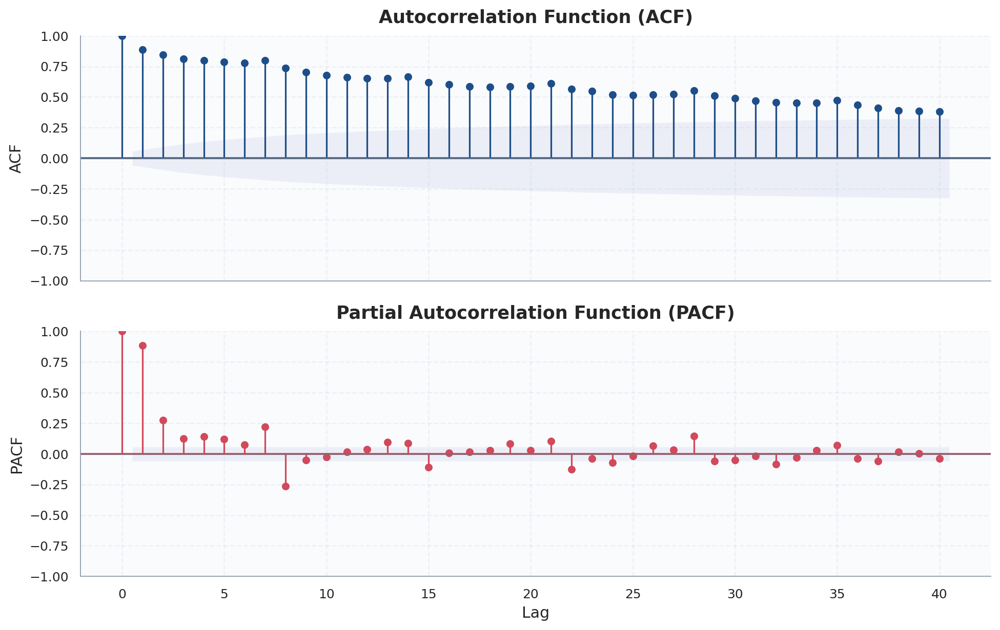

In [ ]:
import matplotlib.dates as mdates
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def plot_academic_acf_pacf(series, lags=30, filename='outputs/figures/Figure1_ACF_PACF.pdf'):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(11, 7), sharex=True)
    fig.patch.set_facecolor('white')

    # ACF Plot
    plot_acf(series, lags=lags, ax=ax1, color='#1D4E89',
             vlines_kwargs={'colors': '#1D4E89', 'linewidth': 1.3})
    ax1.set_title('Autocorrelation Function (ACF)', pad=10)
    ax1.set_ylabel('ACF')
    ax1.axhline(0, color='#6B7280', linewidth=0.9)

    # PACF Plot
    plot_pacf(series, lags=lags, ax=ax2, color='#D1495B',
              vlines_kwargs={'colors': '#D1495B', 'linewidth': 1.3})
    ax2.set_title('Partial Autocorrelation Function (PACF)', pad=10)
    ax2.set_ylabel('PACF')
    ax2.set_xlabel('Lag')
    ax2.axhline(0, color='#6B7280', linewidth=0.9)

    # Confidence interval shading
    for ax in [ax1, ax2]:
        for poly in ax.collections:
            if isinstance(poly, plt.matplotlib.collections.PolyCollection):
                poly.set_alpha(0.18)
                poly.set_facecolor('#A9B8D8')

    plt.tight_layout()
    plt.savefig(filename)
    plt.show()

# Usage Example:
plot_academic_acf_pacf(sltda['Count'].dropna(), lags=40)

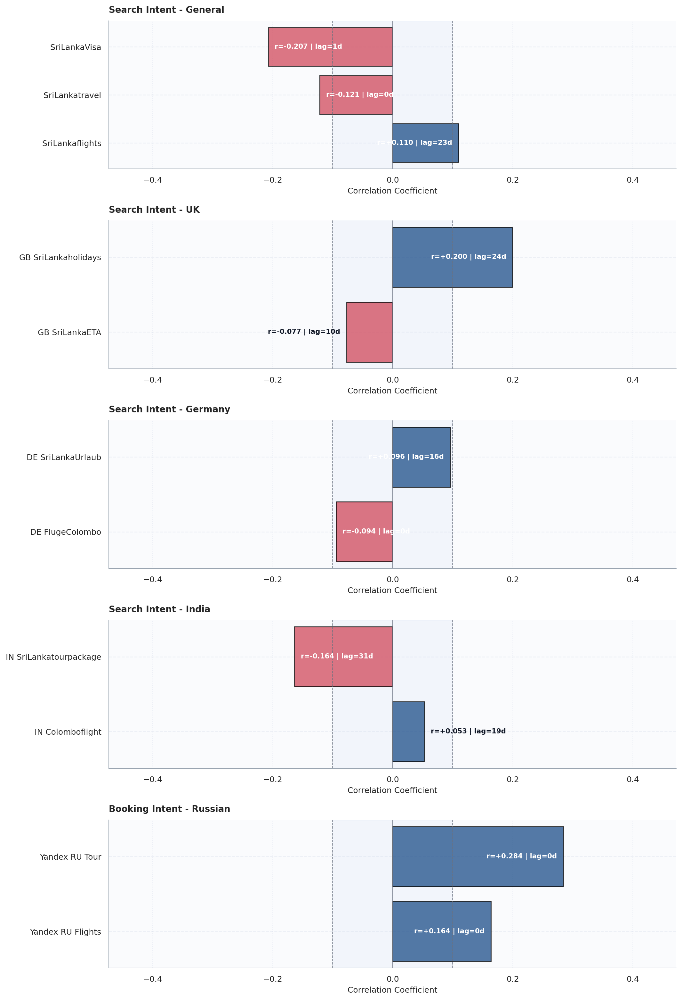

✅ Figure: CCF Demographic Intent Categorization created successfully!

Summary:
• Total features analyzed: 11
• Categories: Search Intent - General, Search Intent - UK, Search Intent - Germany, Search Intent - India, Booking Intent - Russian

Top 3 Strongest Correlations:
  - Yandex_RU_Tour: r=0.2843 (lag: 0d)
  - _SriLankaVisa: r=-0.2069 (lag: 1d)
  - GB_SriLankaholidays: r=0.1995 (lag: 24d)


In [ ]:
# ============================================================================
# CCF Demographic Intent Categorization
# Visualizes cross-correlation analysis grouped by search intent categories
# ============================================================================

# Define demographic intent categories
demographic_categories = {
    'Search Intent - General': [
        '_SriLankatravel',
        '_SriLankaflights',
        '_SriLankaVisa'
    ],
    'Search Intent - UK': [
        'GB_SriLankaholidays',
        'GB_SriLankaETA'
    ],
    'Search Intent - Germany': [
        'DE_SriLankaUrlaub',
        'DE_FlügeColombo'
    ],
    'Search Intent - India': [
        'IN_SriLankatourpackage',
        'IN_Colomboflight'
    ],
    'Booking Intent - Russian': [
        'Yandex_RU_Tour',
        'Yandex_RU_Flights'
    ]
}

# Create categorization mapping
feature_to_category = {}
for category, features in demographic_categories.items():
    for feat in features:
        feature_to_category[feat] = category

# Prepare data
ccf_plot_data = ccf_summary_df.copy()
ccf_plot_data['category'] = ccf_plot_data['feature'].map(feature_to_category)
ccf_plot_data = ccf_plot_data.dropna(subset=['best_corr'])  # Remove constant series

# Create multi-panel figure (one panel per category)
categories = list(demographic_categories.keys())
n_cats = len(categories)
fig, axes = plt.subplots(n_cats, 1, figsize=(12, 3.5 * n_cats), squeeze=False)
axes = axes.flatten()

category_colors = {
    'Search Intent - General': '#2E86AB',
    'Search Intent - UK': '#A23B72',
    'Search Intent - Germany': '#F18F01',
    'Search Intent - India': '#C73E1D',
    'Booking Intent - Russian': '#06A77D'
}

for idx, category in enumerate(categories):
    ax = axes[idx]
    cat_data = ccf_plot_data[ccf_plot_data['category'] == category].sort_values('abs_best_corr', ascending=True)

    if len(cat_data) == 0:
        continue

    # Extract feature names and correlations
    features_short = [
        f.replace('_', ' ').replace('RU_', '').replace('GB_', '').replace('DE_', '').replace('IN_', '')
        for f in cat_data['feature']
    ]
    corrs = cat_data['best_corr'].values
    lags = cat_data['best_lag_days'].values

    # Color by correlation sign
    colors = ['#D1495B' if c < 0 else '#1D4E89' for c in corrs]

    # Create horizontal bar chart
    bars = ax.barh(range(len(features_short)), corrs, color=colors, alpha=0.75, edgecolor='black', linewidth=1.2)

    # Add value labels with both correlation and lag
    max_abs = max(0.35, float(np.nanmax(np.abs(corrs))))
    label_offset = max_abs * 0.03

    for bar, lag, corr in zip(bars, lags, corrs):
        y = bar.get_y() + bar.get_height() / 2
        label = f"r={corr:+.3f} | lag={int(lag)}d"

        inside = abs(corr) >= 0.08
        if corr >= 0:
            x = corr - label_offset if inside else corr + label_offset
            ha = 'right' if inside else 'left'
        else:
            x = corr + label_offset if inside else corr - label_offset
            ha = 'left' if inside else 'right'

        ax.text(
            x,
            y,
            label,
            ha=ha,
            va='center',
            fontsize=8.5,
            fontweight='bold',
            color='white' if inside else '#111827'
        )

    # Significance threshold
    threshold = 0.10
    ax.axvspan(-threshold, threshold, color='#E8EEF9', alpha=0.4, zorder=0)
    ax.axvline(0, color='#6B7280', linewidth=1.0)
    ax.axvline(threshold, color='#6B7280', linestyle='--', linewidth=0.8, alpha=0.7)
    ax.axvline(-threshold, color='#6B7280', linestyle='--', linewidth=0.8, alpha=0.7)

    # Styling
    ax.set_yticks(range(len(features_short)))
    ax.set_yticklabels(features_short, fontsize=10)
    ax.set_xlabel('Correlation Coefficient', fontsize=10)
    ax.set_title(f'{category}', fontsize=11, fontweight='bold', loc='left', pad=10)
    ax.set_xlim(-max_abs * 1.35, max_abs * 1.35)
    ax.grid(axis='x', alpha=0.3, linestyle=':')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('outputs/figures/Figure3_CCF_Demographic_Intent.pdf', dpi=600, bbox_inches='tight')
plt.savefig('outputs/figures/Figure3_CCF_Demographic_Intent.png', dpi=300, bbox_inches='tight')
plt.show()

print("Figure: CCF Demographic Intent Categorization created successfully!")
print("\nSummary:")
print(f"• Total features analyzed: {len(ccf_plot_data)}")
print(f"• Categories: {', '.join(categories)}")
print("\nTop 3 Strongest Correlations:")
top3 = ccf_plot_data.nlargest(3, 'abs_best_corr')[['feature', 'best_corr', 'best_lag_days']]
for _, row in top3.iterrows():
    print(f"  - {row['feature']}: r={row['best_corr']:.4f} (lag: {int(row['best_lag_days'])}d)")

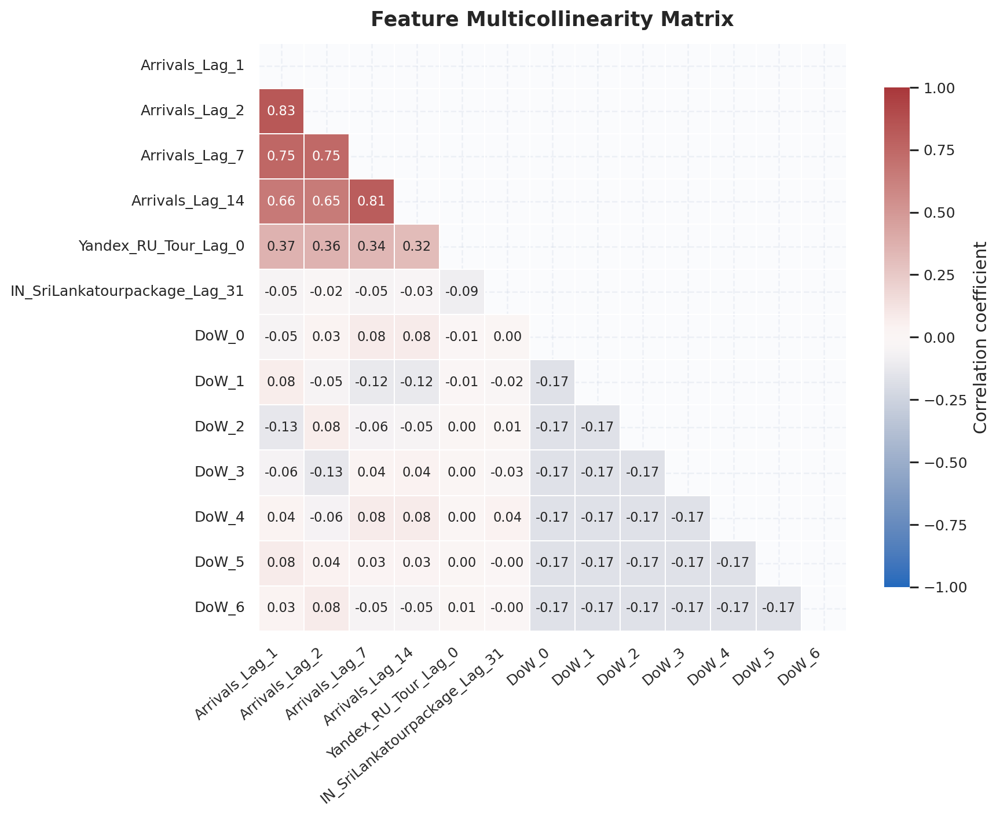

In [ ]:
def plot_correlation_matrix(corr_matrix, filename='outputs/figures/Figure4_Correlation.pdf'):
    fig, ax = plt.subplots(figsize=(10, 8))
    fig.patch.set_facecolor('white')

    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    sns.heatmap(
        corr_matrix,
        mask=mask,
        cmap='vlag',
        center=0,
        annot=True,
        fmt='.2f',
        vmin=-1,
        vmax=1,
        cbar_kws={'shrink': 0.85, 'label': 'Correlation coefficient'},
        ax=ax,
        square=True,
        linewidths=0.6,
        linecolor='white',
        annot_kws={'size': 9}
    )

    ax.set_title('Feature Multicollinearity Matrix', pad=12)
    plt.xticks(rotation=40, ha='right')
    plt.yticks(rotation=0)

    plt.tight_layout()
    plt.savefig(filename)
    plt.show()

# Usage with notebook feature matrix
feature_matrix = None
for candidate in ['X_tr_v3s', 'v3', 'X_tr_v1p', 'X_tr_v2p', 'X_tr', 'df_train_ccf']:
    if candidate in globals() and isinstance(globals()[candidate], pd.DataFrame):
        feature_matrix = globals()[candidate].copy()
        break

if feature_matrix is None:
    raise ValueError('No feature matrix found in notebook state.')

numeric_feature_matrix = feature_matrix.select_dtypes(include=[np.number])
corr_df = numeric_feature_matrix.corr()
plot_correlation_matrix(corr_df)

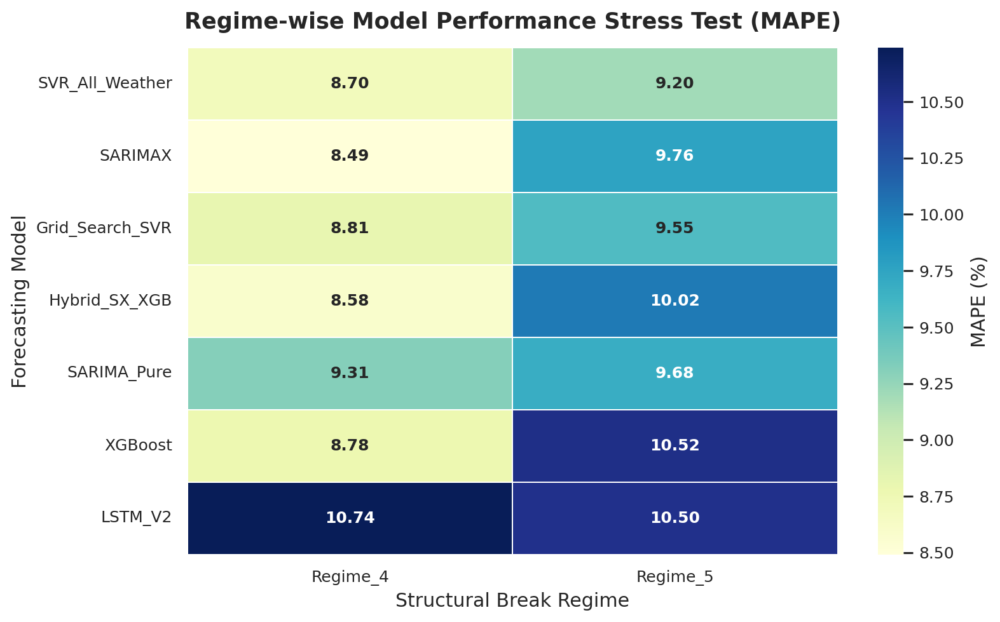

In [ ]:
def plot_mape_heatmap(mape_df, filename='outputs/figures/Figure5_MAPE_Heatmap.pdf'):
    fig, ax = plt.subplots(figsize=(9, 5.6))
    fig.patch.set_facecolor('white')

    plot_df = mape_df.astype(float).copy()
    plot_df = plot_df.loc[plot_df.mean(axis=1).sort_values().index]

    sns.heatmap(
        plot_df,
        cmap='YlGnBu',
        annot=True,
        fmt='.2f',
        cbar_kws={'label': 'MAPE (%)'},
        ax=ax,
        linewidths=0.6,
        linecolor='white',
        annot_kws={'size': 10, 'weight': 'bold'}
    )

    ax.set_title('Regime-wise Model Performance Stress Test (MAPE)', pad=12)
    ax.set_ylabel('Forecasting Model')
    ax.set_xlabel('Structural Break Regime')

    plt.xticks(rotation=0)
    plt.yticks(rotation=0)

    plt.tight_layout()
    plt.savefig(filename)
    plt.show()

# Usage with notebook values (prefer in-memory matrix)
if 'mape_matrix' in globals() and isinstance(mape_matrix, pd.DataFrame):
    mape_df = mape_matrix.copy()
else:
    mape_df = pd.read_csv('outputs/csv/Structural_Break_Model_MAPE_Matrix.csv', index_col=0)

plot_mape_heatmap(mape_df)

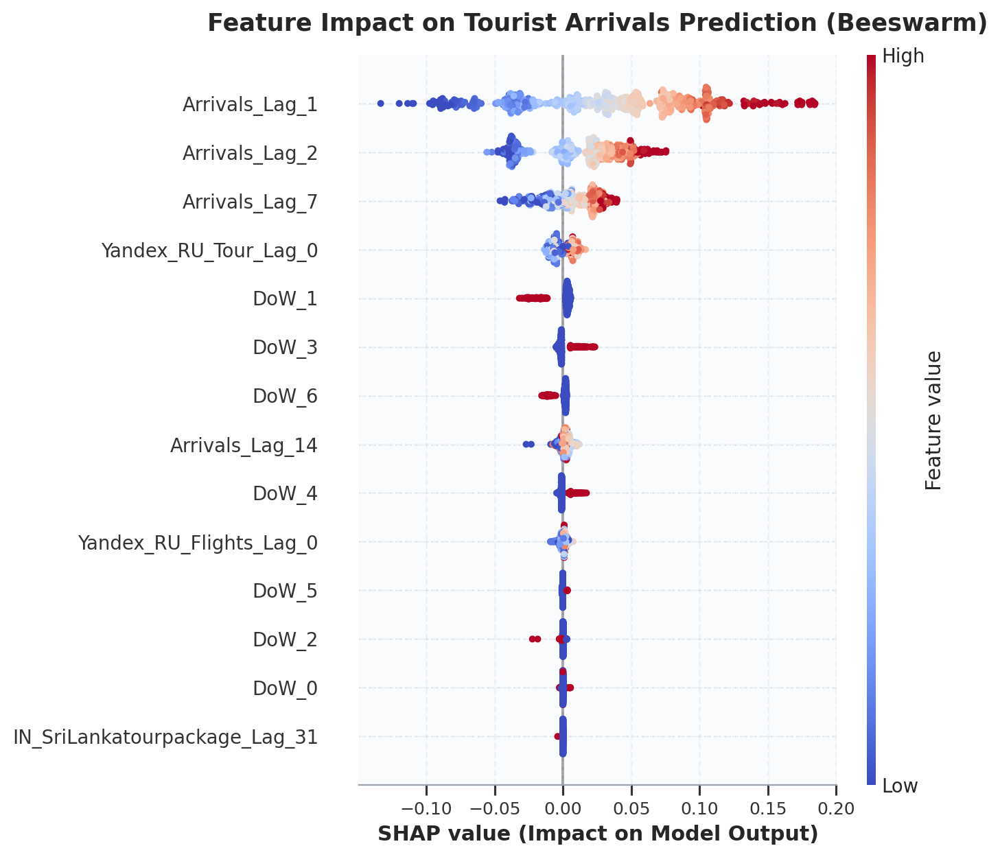

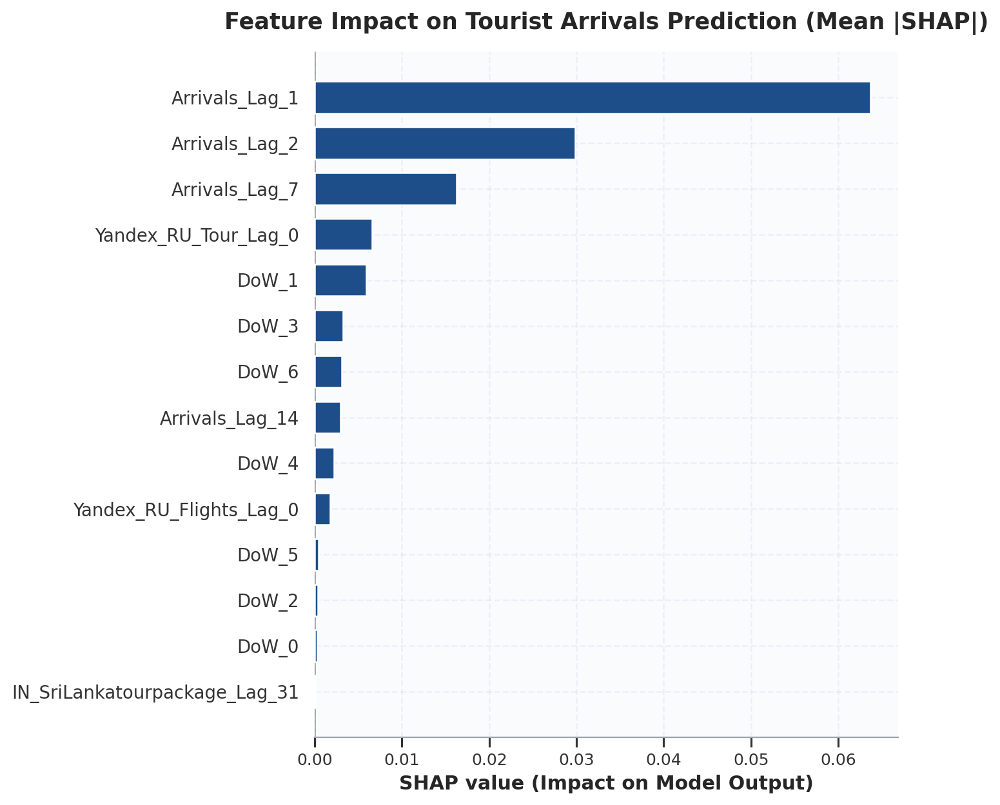

In [ ]:
import shap

def format_and_save_shap(shap_values, X, plot_type='dot', filename='outputs/figures/Figure6_SHAP.pdf'):
    plt.figure(figsize=(9, 6.5))

    if plot_type == 'dot':
        shap.summary_plot(shap_values, X, plot_type=plot_type, cmap='coolwarm', show=False)
    else:
        shap.summary_plot(shap_values, X, plot_type=plot_type, color='#1D4E89', show=False)

    ax = plt.gca()
    ax.set_facecolor('#FAFBFD')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_linewidth(0.9)

    ax.tick_params(axis='y', labelsize=11)
    ax.tick_params(axis='x', labelsize=10)
    ax.set_xlabel('SHAP value (Impact on Model Output)', fontsize=12, weight='bold')

    if plot_type == 'dot':
        plt.title('Feature Impact on Tourist Arrivals Prediction (Beeswarm)', pad=14)
    else:
        plt.title('Feature Impact on Tourist Arrivals Prediction (Mean |SHAP|)', pad=14)

    plt.tight_layout()
    plt.savefig(filename)
    plt.show()

# Usage with notebook SHAP outputs
if 'shap_values' in globals() and 'X_test' in globals():
    pass
else:
    shap_values = None
    X_test = None
    candidate_pairs = [
        ('shap_xgb_vals', 'X_te_t'),
        ('shap_rf_vals', 'X_te_t'),
        ('shap_grid_vals', 'X_te_grid'),
        ('shap_svr_vals', 'test_sample_svr'),
        ('shap_lstm_v', 'test_samp_l'),
        ('shap_hyb_vals', 'X_te_xg_h'),
    ]

    for shap_name, x_name in candidate_pairs:
        if shap_name in globals() and x_name in globals() and isinstance(globals()[x_name], pd.DataFrame):
            current_shap = globals()[shap_name]
            if isinstance(current_shap, list):
                current_shap = current_shap[0]
            if hasattr(current_shap, 'shape') and len(current_shap) == len(globals()[x_name]):
                shap_values = current_shap
                X_test = globals()[x_name]
                break

if shap_values is None or X_test is None:
    raise ValueError('No compatible SHAP values and feature matrix found. Run SHAP cells first.')

format_and_save_shap(shap_values, X_test, plot_type='dot')
format_and_save_shap(shap_values, X_test, plot_type='bar', filename='outputs/figures/Figure6_SHAP_Bar.pdf')

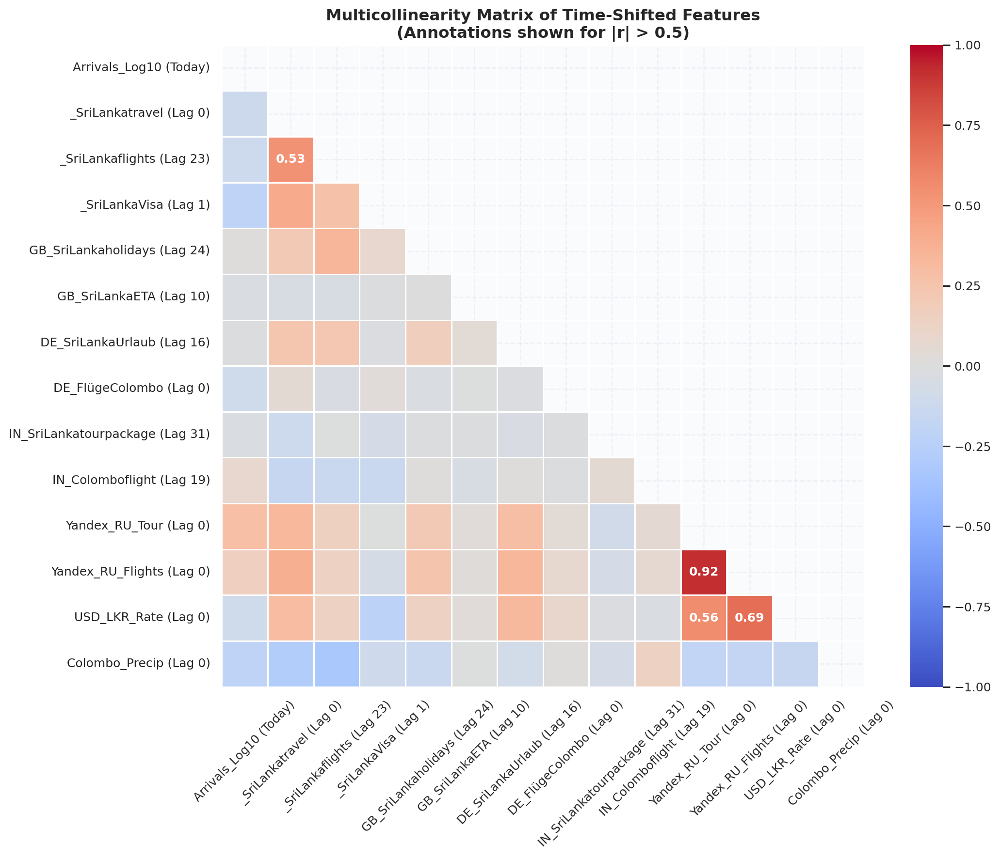

In [ ]:
# Updated In [17]: Multicollinearity Matrix
corr_mat = shifted.corr()
fig, ax = plt.subplots(figsize=(13, 10))

# Mask the upper triangle to remove redundancy
mask = np.zeros_like(corr_mat, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Create a custom annotation matrix: only show values if abs(r) > 0.5
annot_labels = np.where(np.abs(corr_mat) > 0.5, np.round(corr_mat, 2).astype(str), "")

sns.heatmap(corr_mat, mask=mask, annot=annot_labels, fmt='', cmap='coolwarm', vmin=-1, vmax=1,
            square=True, linewidths=0.5, ax=ax, annot_kws={'size': 10, 'fontweight': 'bold'})

ax.set_title('Multicollinearity Matrix of Time-Shifted Features\n(Annotations shown for |r| > 0.5)', 
             fontsize=13, fontweight='bold')
ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig('outputs/figures/4_7_Multicollinearity_Matrix_Improved.png', dpi=300, bbox_inches='tight')
plt.show()

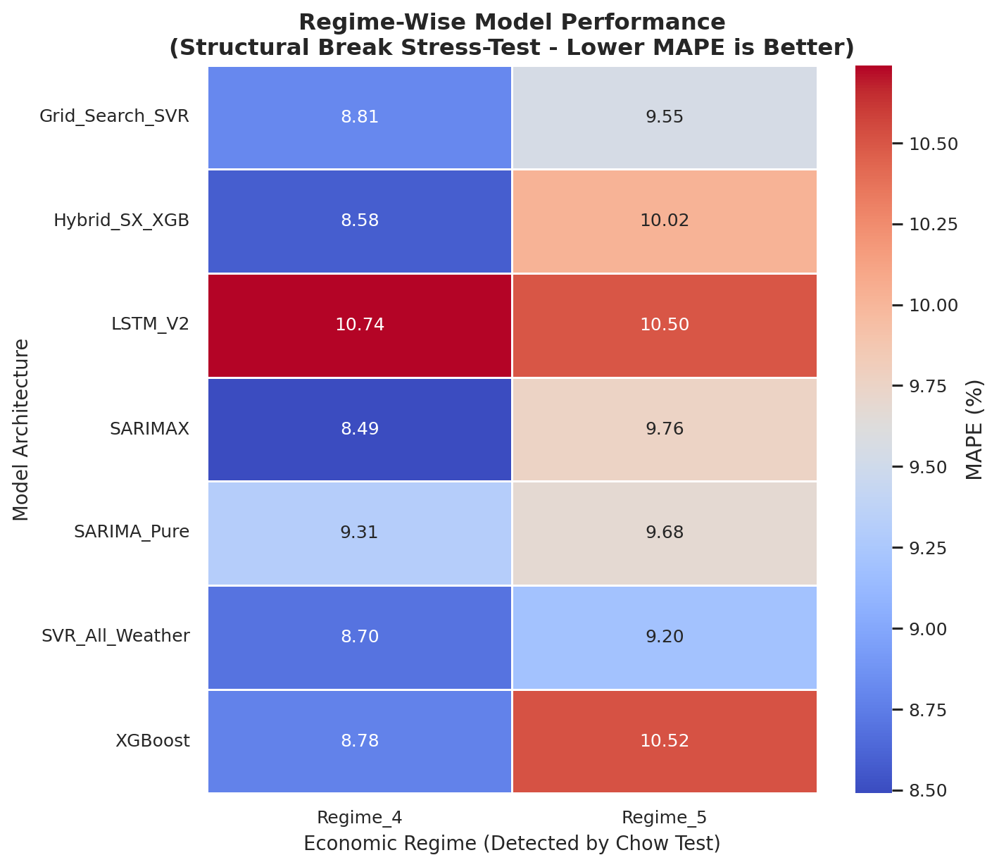

In [ ]:
# Updated In [32]: Regime-Wise MAPE Heatmap
if regime_tables:
    fig, ax = plt.subplots(figsize=(max(8, len(mape_matrix.columns) * 1.8), 7))
    
    # Swapped 'coolwarm' for the perceptually uniform 'coolwarm'
    sns.heatmap(mape_matrix.astype(float), annot=True, fmt='.2f', cmap='coolwarm', 
                cbar_kws={'label': 'MAPE (%)'}, linewidths=0.5, ax=ax, annot_kws={'size': 10})
                
    ax.set_title('Regime-Wise Model Performance\n(Structural Break Stress-Test - Lower MAPE is Better)', 
                 fontsize=13, fontweight='bold')
    ax.set_xlabel('Economic Regime (Detected by Chow Test)', fontsize=11)
    ax.set_ylabel('Model Architecture', fontsize=11)
    ax.tick_params(axis='y', rotation=0)
    
    plt.tight_layout()
    plt.savefig('outputs/figures/6_4_Regime_MAPE_Heatmap_Improved.png', dpi=300, bbox_inches='tight')
    plt.show()

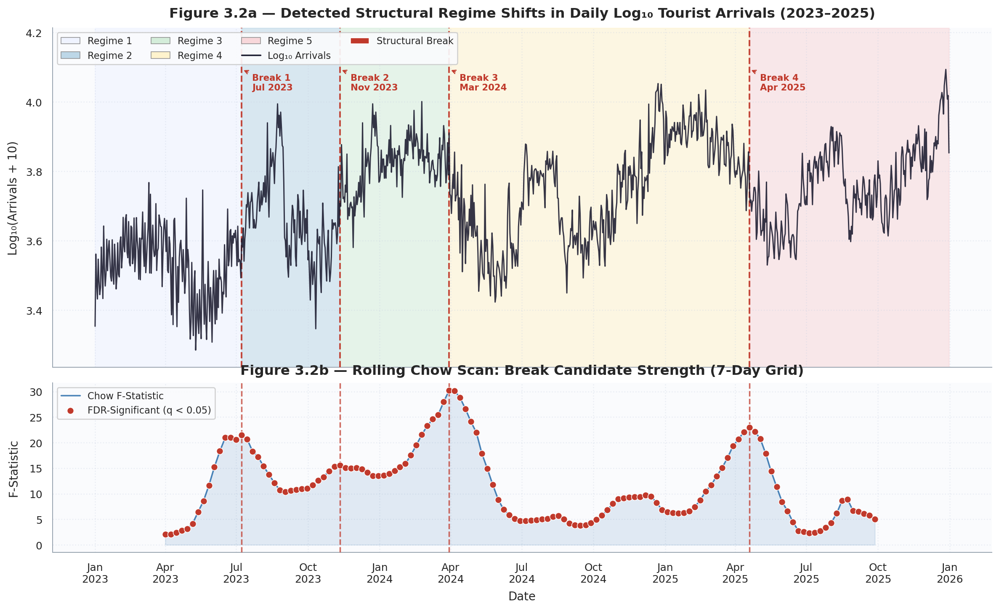

✅ Figure 3.2 saved.


In [ ]:
# ── Figure 3.2: Deep Structural Break Diagnostics (Publication Quality) ───
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
import numpy as np

# IEEE/academic palette — distinct, print-safe regime colours
REGIME_PALETTE = ['#EFF3FF', '#BDD7E7', '#D4EDDA', '#FFF3CD', '#F8D7DA']
BREAK_COLOR    = '#C0392B'
SERIES_COLOR   = '#1A1A2E'
FSCORE_COLOR   = '#2C6FAC'
SIG_COLOR      = '#C0392B'

FONT_TITLE   = 13
FONT_LABEL   = 11
FONT_TICK    = 10
FONT_LEGEND  = 9
FONT_ANNOT   = 8.5

scan_plot = chow_results.sort_values('break_date').reset_index(drop=True)
bounds    = [series.index.min()] + selected_breaks + [series.index.max()]

fig, axes = plt.subplots(
    2, 1, figsize=(16, 9), sharex=True,
    gridspec_kw={'height_ratios': [2, 1], 'hspace': 0.06}
)

# ── Panel A: Log₁₀ Arrivals with Regime Bands ─────────────────────────────
for i in range(len(bounds) - 1):
    axes[0].axvspan(
        bounds[i], bounds[i + 1],
        color=REGIME_PALETTE[i % len(REGIME_PALETTE)],
        alpha=0.55, zorder=0
    )

for i, d in enumerate(selected_breaks):
    axes[0].axvline(d, color=BREAK_COLOR, linestyle='--', linewidth=1.6,
                    alpha=0.90, zorder=3)
    axes[0].annotate(
        f'Break {i+1}\n{d.strftime("%b %Y")}',
        xy=(d, series.max()),
        xytext=(10, -4), textcoords='offset points',
        fontsize=FONT_ANNOT, color=BREAK_COLOR, fontweight='bold',
        ha='left', va='top',
        arrowprops=dict(arrowstyle='->', color=BREAK_COLOR, lw=1.0)
    )

axes[0].plot(series.index, series.values,
             color=SERIES_COLOR, linewidth=1.2, alpha=0.88,
             zorder=4, label='Log₁₀(Arrivals + 10)')

# Regime legend patches
regime_patches = [
    mpatches.Patch(facecolor=REGIME_PALETTE[i], edgecolor='#888', linewidth=0.6,
                   label=f'Regime {i+1}')
    for i in range(len(bounds) - 1)
]
break_handle = mpatches.Patch(facecolor=BREAK_COLOR, label='Structural Break')
series_handle = plt.Line2D([0], [0], color=SERIES_COLOR, linewidth=1.4,
                            label='Log₁₀ Arrivals')
axes[0].legend(
    handles=regime_patches + [series_handle, break_handle],
    loc='upper left', ncol=4, fontsize=FONT_LEGEND,
    framealpha=0.92, edgecolor='#CCCCCC'
)

axes[0].set_ylabel('Log₁₀(Arrivals + 10)', fontsize=FONT_LABEL, labelpad=6)
axes[0].set_ylim(series.min() - 0.05, series.max() + 0.12)
axes[0].set_title(
    'Figure 3.2a — Detected Structural Regime Shifts in Daily Log₁₀ Tourist Arrivals (2023–2025)',
    fontsize=FONT_TITLE, fontweight='bold', pad=10
)
axes[0].grid(True, linestyle=':', alpha=0.35, zorder=1)
axes[0].tick_params(axis='y', labelsize=FONT_TICK)

# ── Panel B: Chow F-Statistic Scan ─────────────────────────────────────────
if not scan_plot.empty:
    axes[1].plot(
        scan_plot['break_date'], scan_plot['F_stat'],
        color=FSCORE_COLOR, linewidth=1.4, alpha=0.85,
        zorder=2, label='Chow F-Statistic'
    )
    axes[1].fill_between(
        scan_plot['break_date'], 0, scan_plot['F_stat'],
        color=FSCORE_COLOR, alpha=0.12, zorder=1
    )
    sig_mask = (scan_plot['significant_5pct']
                if 'significant_5pct' in scan_plot.columns
                else pd.Series([False] * len(scan_plot)))
    if sig_mask.any():
        axes[1].scatter(
            scan_plot.loc[sig_mask, 'break_date'],
            scan_plot.loc[sig_mask, 'F_stat'],
            color=SIG_COLOR, s=40, zorder=5, linewidths=0.6,
            edgecolors='white', label='FDR-Significant (q < 0.05)'
        )
    for d in selected_breaks:
        axes[1].axvline(d, color=BREAK_COLOR, linestyle='--',
                        linewidth=1.4, alpha=0.75, zorder=3)

axes[1].set_ylabel('F-Statistic', fontsize=FONT_LABEL, labelpad=6)
axes[1].set_xlabel('Date', fontsize=FONT_LABEL, labelpad=6)
axes[1].set_title(
    'Figure 3.2b — Rolling Chow Scan: Break Candidate Strength (7-Day Grid)',
    fontsize=FONT_TITLE, fontweight='bold', pad=8
)
axes[1].legend(loc='upper left', fontsize=FONT_LEGEND,
               framealpha=0.92, edgecolor='#CCCCCC')
axes[1].grid(True, linestyle=':', alpha=0.35)
axes[1].tick_params(axis='both', labelsize=FONT_TICK)

# Shared x-axis formatting
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))

fig.align_ylabels(axes)
plt.savefig('outputs/figures/3_2_Structural_Break_Diagnostics.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print('Figure 3.2 saved.')

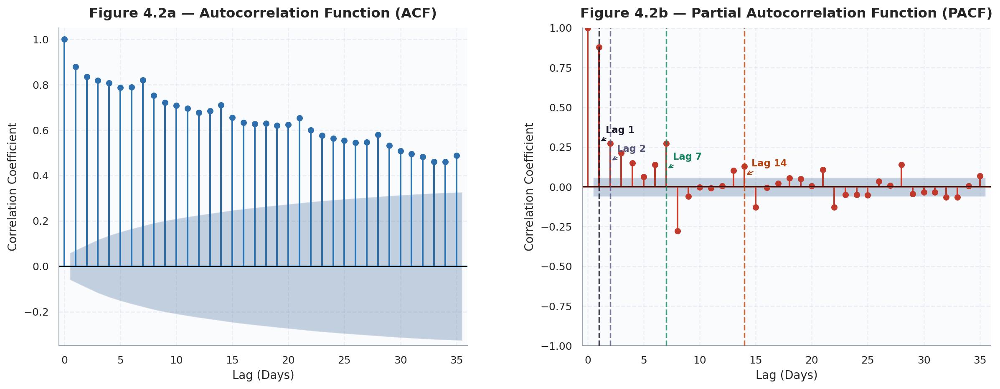

✅ Figure 4.2 saved. Key autoregressive lags confirmed: 1, 2, 7, 14.


In [ ]:
# ── Figure 4.2: ACF & PACF (Publication Quality) ──────────────────────────
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

target_series = df['Arrivals_Log10'].dropna()

KEY_LAGS   = [1, 2, 7, 14]
ACF_COLOR  = '#2C6FAC'
PACF_COLOR = '#C0392B'
FONT_TITLE = 13
FONT_LABEL = 11
FONT_TICK  = 10
FONT_ANNOT = 9

fig, axes = plt.subplots(1, 2, figsize=(16, 5.5))
fig.subplots_adjust(wspace=0.28)

# ACF
plot_acf(target_series, lags=35, ax=axes[0], alpha=0.05,
         color=ACF_COLOR, vlines_kwargs={'colors': ACF_COLOR, 'linewidths': 1.6})
axes[0].set_title('Figure 4.2a — Autocorrelation Function (ACF)',
                  fontsize=FONT_TITLE, fontweight='bold', pad=10)
axes[0].set_xlabel('Lag (Days)', fontsize=FONT_LABEL)
axes[0].set_ylabel('Correlation Coefficient', fontsize=FONT_LABEL)
axes[0].tick_params(labelsize=FONT_TICK)
axes[0].set_xlim(-0.5, 36)
axes[0].set_ylim(-0.35, 1.05)
axes[0].axhline(0, color='black', linewidth=0.8)
axes[0].grid(axis='y', linestyle='--', alpha=0.35)

# PACF
plot_pacf(target_series, lags=35, ax=axes[1], alpha=0.05,
          method='ywm',
          color=PACF_COLOR, vlines_kwargs={'colors': PACF_COLOR, 'linewidths': 1.6})
axes[1].set_title('Figure 4.2b — Partial Autocorrelation Function (PACF)',
                  fontsize=FONT_TITLE, fontweight='bold', pad=10)
axes[1].set_xlabel('Lag (Days)', fontsize=FONT_LABEL)
axes[1].set_ylabel('Correlation Coefficient', fontsize=FONT_LABEL)
axes[1].tick_params(labelsize=FONT_TICK)
axes[1].set_xlim(-0.5, 36)
axes[1].axhline(0, color='black', linewidth=0.8)
axes[1].grid(axis='y', linestyle='--', alpha=0.35)

# Annotate key lags on PACF
lag_colors = {1: '#1A1A2E', 2: '#555577', 7: '#16825D', 14: '#B7410E'}
y_vals     = {1: 0.28, 2: 0.16, 7: 0.11, 14: 0.07}
for lag in KEY_LAGS:
    axes[1].axvline(x=lag, color=lag_colors[lag], linestyle='--',
                    linewidth=1.4, alpha=0.80, zorder=5)
    axes[1].annotate(
        f'Lag {lag}',
        xy=(lag, y_vals[lag]),
        xytext=(lag + 0.6, y_vals[lag] + 0.06),
        fontsize=FONT_ANNOT, color=lag_colors[lag], fontweight='bold',
        arrowprops=dict(arrowstyle='->', color=lag_colors[lag], lw=0.9)
    )

for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.savefig('outputs/figures/4_2_ACF_PACF.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print('Figure 4.2 saved. Key autoregressive lags confirmed: 1, 2, 7, 14.')

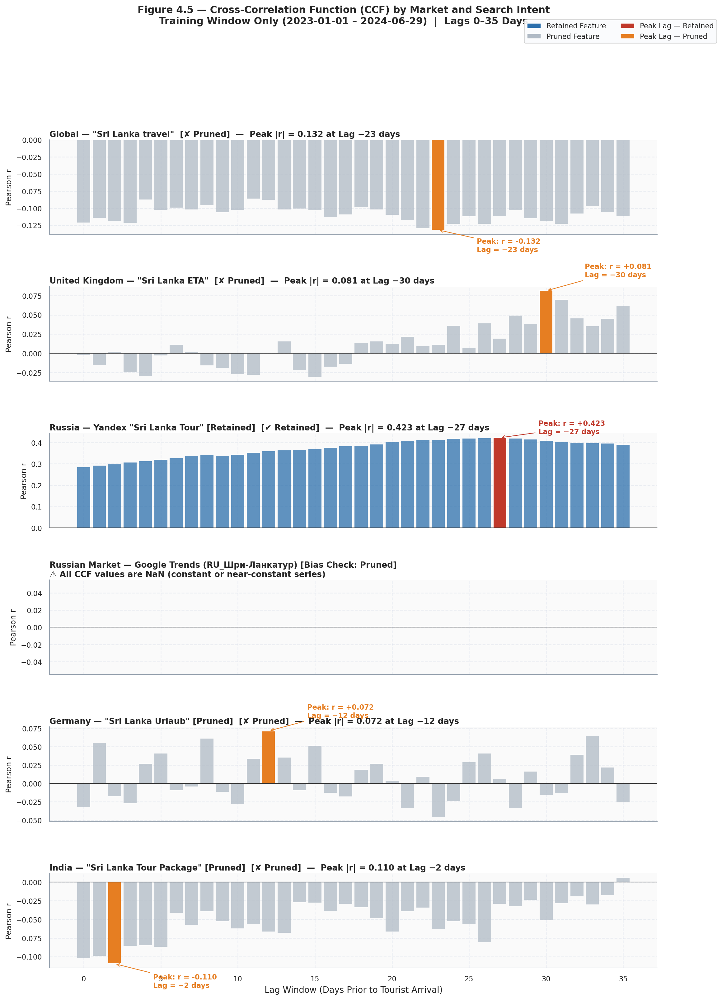

⚠ Intent variables unavailable: ['RU_Шри-Ланкатур']
✅ Figure 4.5 saved.


In [ ]:
# ── Figure 4.5: CCF Intent Categorisation (Publication Quality) ────────────
RETAINED_COLOR = '#2C6FAC'
PRUNED_COLOR   = '#B0BAC5'
PEAK_RETAINED  = '#C0392B'
PEAK_PRUNED    = '#E67E22'
NAN_COLOR      = '#E8EAED'
FONT_TITLE     = 12
FONT_SUB       = 10.5
FONT_LABEL     = 10
FONT_TICK      = 9
FONT_ANNOT     = 9

ru_google_var = None
if 'ru_google_features' in globals() and ru_google_features:
    tour_candidates = [c for c in ru_google_features
                       if ('тур' in c.lower()) or ('tour' in c.lower())]
    ru_google_var = tour_candidates[0] if tour_candidates else ru_google_features[0]

ru_google_label = (
    f'Russian Market — Google Trends ({ru_google_var}) [Bias Check: Pruned]'
    if ru_google_var else
    'Russian Market — Google Trends [Not Available / Constant Series]'
)

intent_pairs = [
    ('_SriLankatravel',      'Global — "Sri Lanka travel"'),
    ('GB_SriLankaETA',       'United Kingdom — "Sri Lanka ETA"'),
    ('Yandex_RU_Tour',       'Russia — Yandex "Sri Lanka Tour" [Retained]'),
    (ru_google_var,           ru_google_label),
    ('DE_SriLankaUrlaub',    'Germany — "Sri Lanka Urlaub" [Pruned]'),
    ('IN_SriLankatourpackage','India — "Sri Lanka Tour Package" [Pruned]'),
]

n_panels = len(intent_pairs)
fig, axes = plt.subplots(n_panels, 1, figsize=(14, 3.2 * n_panels),
                         sharex=True)
if n_panels == 1:
    axes = [axes]
fig.subplots_adjust(hspace=0.55)

invalid_intent_vars = []

for i, (var, market) in enumerate(intent_pairs):
    ax = axes[i]
    is_winner = (var is not None) and (var in winning_features)
    bar_col   = RETAINED_COLOR if is_winner else PRUNED_COLOR
    peak_col  = PEAK_RETAINED  if is_winner else PEAK_PRUNED

    # Background shade
    ax.set_facecolor('#FAFAFA')

    if (var is None) or (var not in df_train_ccf.columns):
        invalid_intent_vars.append(var if var else 'RU_Google_missing')
        ax.bar(lags_arr, np.zeros(len(lags_arr)), color=NAN_COLOR,
               width=0.8, edgecolor='none')
        ax.set_title(f'{market}\nVariable unavailable or constant series — no valid CCF',
                     fontsize=FONT_SUB, fontweight='bold', loc='left', pad=4)
        ax.axhline(0, color='#555', linewidth=0.8)
        ax.set_ylabel('Pearson r', fontsize=FONT_LABEL)
        ax.tick_params(labelsize=FONT_TICK)
        ax.grid(axis='y', linestyle='--', alpha=0.35)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        continue

    corrs    = [df_train_ccf[target].corr(df_train_ccf[var].shift(lag))
                for lag in lags_arr]
    corr_arr = np.asarray(corrs, dtype=float)
    valid_idx = np.where(np.isfinite(corr_arr))[0]

    if len(valid_idx) == 0:
        invalid_intent_vars.append(var)
        ax.bar(lags_arr, np.zeros(len(lags_arr)), color=NAN_COLOR,
               width=0.8, edgecolor='none')
        ax.set_title(f'{market}\nAll CCF values are NaN (constant or near-constant series)',
                     fontsize=FONT_SUB, fontweight='bold', loc='left', pad=4)
        ax.axhline(0, color='#555', linewidth=0.8)
        ax.set_ylabel('Pearson r', fontsize=FONT_LABEL)
        ax.tick_params(labelsize=FONT_TICK)
        ax.grid(axis='y', linestyle='--', alpha=0.35)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        continue

    bi = int(valid_idx[np.argmax(np.abs(corr_arr[valid_idx]))])
    bl = int(lags_arr[bi])
    bc = float(corr_arr[bi])

    ax.bar(lags_arr, np.nan_to_num(corr_arr, nan=0.0),
           color=bar_col, alpha=0.75, width=0.85, edgecolor='none', zorder=2)
    ax.bar(bl, bc, color=peak_col, alpha=1.0,
           width=0.85, edgecolor='white', linewidth=0.8, zorder=3)

    # Annotate peak
    y_offset = 0.018 if bc >= 0 else -0.032
    ax.annotate(
        f'Peak: r = {bc:+.3f}\nLag = −{bl} days',
        xy=(bl, bc), xytext=(bl + 2.5, bc + y_offset),
        fontsize=FONT_ANNOT, color=peak_col, fontweight='bold',
        arrowprops=dict(arrowstyle='->', color=peak_col, lw=0.9)
    )

    status = '✔ Retained' if is_winner else '✘ Pruned'
    ax.set_title(
        f'{market}  [{status}]  —  Peak |r| = {abs(bc):.3f} at Lag −{bl} days',
        fontsize=FONT_SUB, fontweight='bold', loc='left', pad=4
    )
    ax.axhline(0, color='#333', linewidth=0.9, zorder=4)
    ax.set_ylabel('Pearson r', fontsize=FONT_LABEL)
    ax.tick_params(labelsize=FONT_TICK)
    ax.grid(axis='y', linestyle='--', alpha=0.35, zorder=1)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[-1].set_xlabel('Lag Window (Days Prior to Tourist Arrival)', fontsize=FONT_LABEL + 1)
axes[-1].tick_params(axis='x', labelsize=FONT_TICK)

# Legend patches
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor=RETAINED_COLOR, label='Retained Feature'),
    Patch(facecolor=PRUNED_COLOR,   label='Pruned Feature'),
    Patch(facecolor=PEAK_RETAINED,  label='Peak Lag — Retained'),
    Patch(facecolor=PEAK_PRUNED,    label='Peak Lag — Pruned'),
]
fig.legend(handles=legend_elements, loc='upper right', fontsize=FONT_TICK,
           framealpha=0.93, edgecolor='#CCC', ncol=2,
           bbox_to_anchor=(0.98, 0.995))

fig.suptitle(
    'Figure 4.5 — Cross-Correlation Function (CCF) by Market and Search Intent\n'
    'Training Window Only (2023-01-01 – 2024-06-29)  |  Lags 0–35 Days',
    fontsize=FONT_TITLE + 0.5, fontweight='bold', y=1.005
)

plt.savefig('outputs/figures/4_5_CCF_Intent_Categorisation.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
if invalid_intent_vars:
    print(f'Intent variables unavailable: {invalid_intent_vars}')
print('Figure 4.5 saved.')

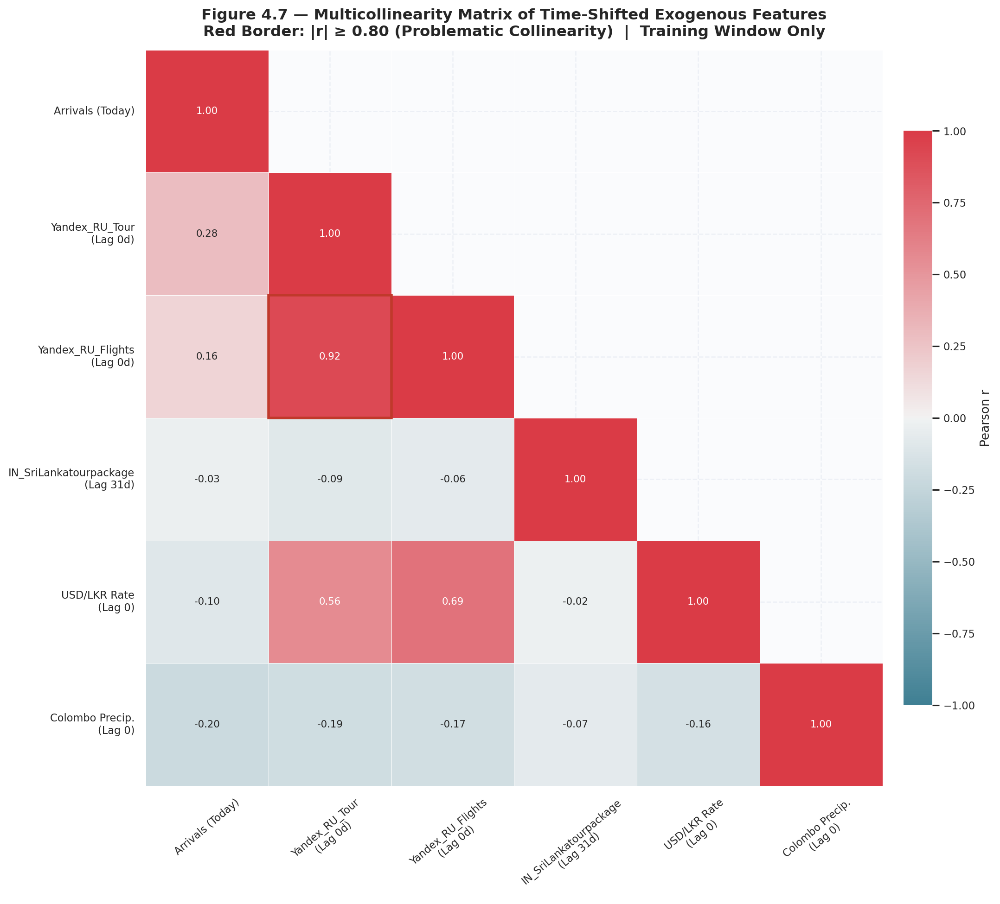

✅ Figure 4.7 saved. Features with |r| ≥ 0.80 are highlighted.


In [ ]:
# ── Figure 4.7: Multicollinearity Matrix (Publication Quality) ────────────
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

FONT_TITLE = 13
FONT_LABEL = 10.5
FONT_TICK  = 9
FONT_ANNOT = 8.5

# Build shifted matrix (same as before)
shifted = pd.DataFrame(index=df_train_ccf.index)
shifted['Arrivals (Today)'] = df_train_ccf['Arrivals_Log10']
for var, lag in best_lags_ccf.items():
    if var in df_train_ccf.columns and pd.notna(lag):
        label = f'{var}\n(Lag {int(lag)}d)'
        shifted[label] = df_train_ccf[var].shift(int(lag))
shifted['USD/LKR Rate\n(Lag 0)']     = df_train_ccf['USD_LKR_Rate']
shifted['Colombo Precip.\n(Lag 0)']  = df_train_ccf['Colombo_Precip_mm']

corr_mat = shifted.corr()

# Mask upper triangle
mask = np.zeros_like(corr_mat, dtype=bool)
mask[np.triu_indices_from(mask, k=1)] = True

fig, ax = plt.subplots(figsize=(14, 11))

# Diverging palette — clear at 0, saturated at ±1
cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(
    corr_mat, mask=mask,
    annot=True, fmt='.2f',
    cmap=cmap, vmin=-1, vmax=1, center=0,
    square=True, linewidths=0.4, linecolor='white',
    ax=ax,
    annot_kws={'size': FONT_ANNOT, 'weight': 'normal'},
    cbar_kws={'label': 'Pearson r', 'shrink': 0.78, 'pad': 0.02}
)

# Highlight cells with |r| > 0.80 (problematic collinearity)
n = corr_mat.shape[0]
for row in range(n):
    for col in range(row):  # lower triangle only
        val = corr_mat.iloc[row, col]
        if abs(val) >= 0.80:
            ax.add_patch(plt.Rectangle(
                (col, row), 1, 1,
                fill=False, edgecolor='#C0392B', lw=2.2, zorder=10
            ))

ax.set_title(
    'Figure 4.7 — Multicollinearity Matrix of Time-Shifted Exogenous Features\n'
    'Red Border: |r| ≥ 0.80 (Problematic Collinearity)  |  Training Window Only',
    fontsize=FONT_TITLE, fontweight='bold', pad=12
)
ax.tick_params(axis='x', labelsize=FONT_TICK, rotation=40)
ax.tick_params(axis='y', labelsize=FONT_TICK, rotation=0)
ax.set_xlabel('', fontsize=0)
ax.set_ylabel('', fontsize=0)

# Colorbar label size
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=FONT_TICK)
cbar.set_label('Pearson r', fontsize=FONT_LABEL)

plt.tight_layout()
plt.savefig('outputs/figures/4_7_Multicollinearity_Matrix.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print('Figure 4.7 saved. Features with |r| ≥ 0.80 are highlighted.')

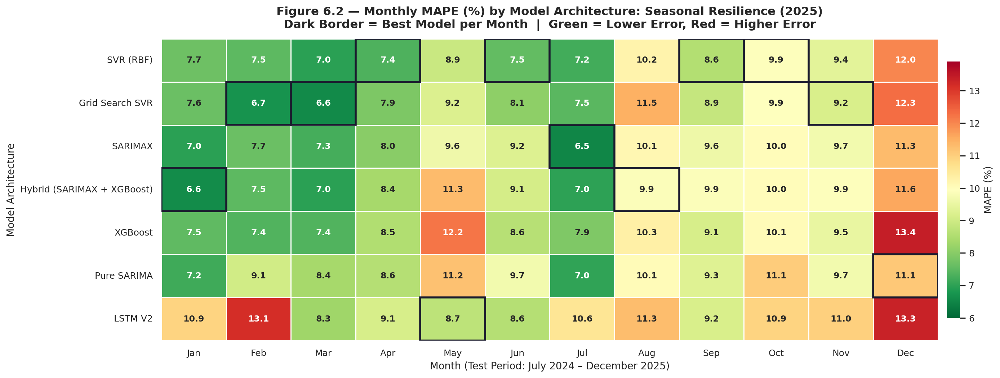

✅ Figure 6.2 saved.


In [ ]:
# ── Figure 6.2: Monthly MAPE Heatmap (Publication Quality) ────────────────
import calendar
import seaborn as sns

FONT_TITLE = 13
FONT_LABEL = 11
FONT_TICK  = 10
FONT_ANNOT = 9.5

monthly_mape = {}
for name, preds in model_preds.items():
    mdf = pd.DataFrame({'Actual': actuals_6.values,
                        'Pred': preds.values}, index=dates_6)
    mdf['Month'] = mdf.index.month
    monthly_mape[name] = mdf.groupby('Month').apply(
        lambda g: mape(g['Actual'], g['Pred'])
    ).to_dict()

mm_df = pd.DataFrame(monthly_mape).T.reindex(columns=range(1, 13))
mm_df.columns = [calendar.month_abbr[m] for m in mm_df.columns]

# Readable model labels
model_labels = {
    'Pure SARIMA':       'Pure SARIMA',
    'SARIMAX':           'SARIMAX',
    'XGBoost':           'XGBoost',
    'LSTM V2':           'LSTM V2',
    'Hybrid (SX+XGB)':  'Hybrid (SARIMAX + XGBoost)',
    'Grid Search SVR':   'Grid Search SVR',
    'SVR':               'SVR (RBF)',
}
mm_df.index = [model_labels.get(n, n) for n in mm_df.index]

# Sort by overall mean MAPE (best model at top)
mm_df = mm_df.loc[mm_df.mean(axis=1).sort_values().index]

fig, ax = plt.subplots(figsize=(17, 6))

sns.heatmap(
    mm_df.astype(float),
    annot=True, fmt='.1f',
    cmap='RdYlGn_r',
    vmin=mm_df.values.min() - 0.5,
    vmax=mm_df.values.max() + 0.5,
    linewidths=0.5, linecolor='white',
    ax=ax,
    annot_kws={'size': FONT_ANNOT, 'weight': 'bold'},
    cbar_kws={'label': 'MAPE (%)', 'shrink': 0.85, 'pad': 0.01}
)

# Column-wise best (minimum MAPE) — bold border
for col_i in range(mm_df.shape[1]):
    best_row = mm_df.iloc[:, col_i].idxmin()
    row_i    = mm_df.index.get_loc(best_row)
    ax.add_patch(plt.Rectangle(
        (col_i, row_i), 1, 1,
        fill=False, edgecolor='#1A1A2E', lw=2.2, zorder=10
    ))

ax.set_title(
    'Figure 6.2 — Monthly MAPE (%) by Model Architecture: Seasonal Resilience (2025)\n'
    'Dark Border = Best Model per Month  |  Green = Lower Error, Red = Higher Error',
    fontsize=FONT_TITLE, fontweight='bold', pad=12
)
ax.set_xlabel('Month (Test Period: July 2024 – December 2025)', fontsize=FONT_LABEL)
ax.set_ylabel('Model Architecture', fontsize=FONT_LABEL)
ax.tick_params(axis='x', labelsize=FONT_TICK, rotation=0)
ax.tick_params(axis='y', labelsize=FONT_TICK, rotation=0)

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=FONT_TICK)
cbar.set_label('MAPE (%)', fontsize=FONT_LABEL)

plt.tight_layout()
plt.savefig('outputs/figures/6_2_Monthly_Accuracy_Heatmap.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print('Figure 6.2 saved.')

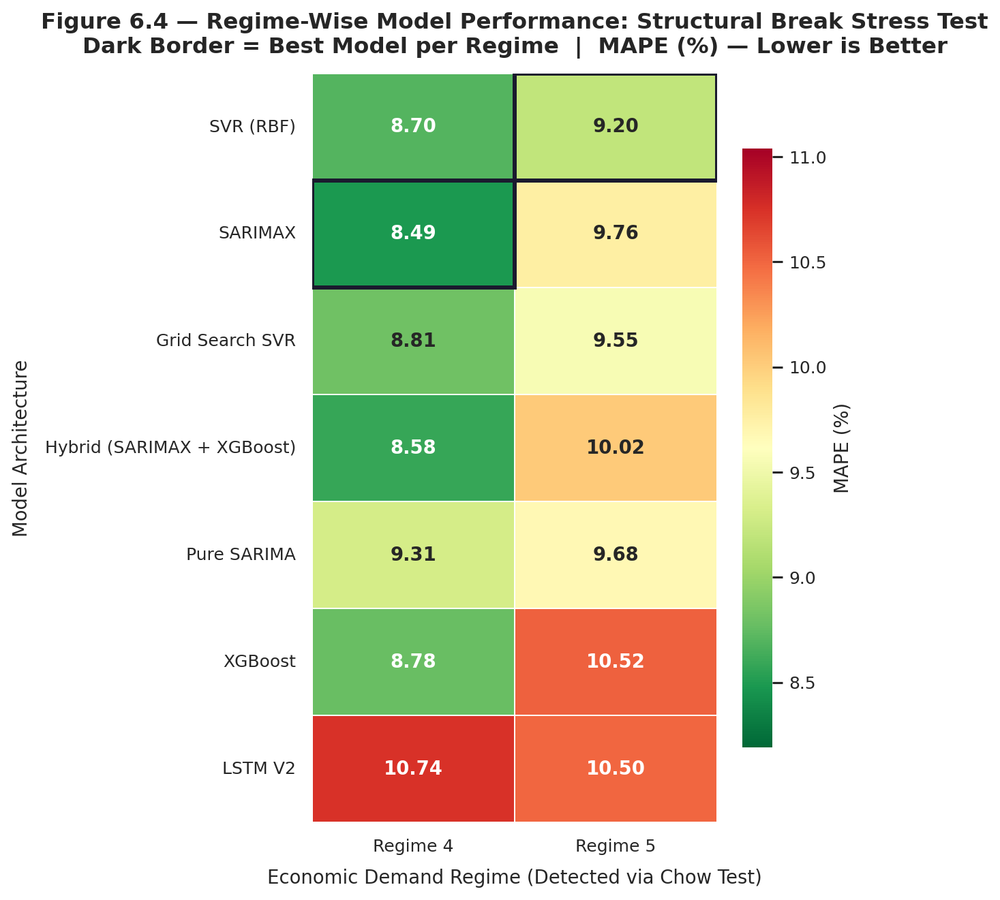

✅ Figure 6.4 saved.


In [ ]:
# ── Figure 6.4: Regime-Wise MAPE Heatmap (Publication Quality) ────────────
if regime_tables:

    FONT_TITLE = 13
    FONT_LABEL = 11
    FONT_TICK  = 10
    FONT_ANNOT = 11

    # Readable model labels
    label_map = {
        'SARIMA_Pure':      'Pure SARIMA',
        'SARIMAX':          'SARIMAX',
        'XGBoost':          'XGBoost',
        'LSTM_V2':          'LSTM V2',
        'Hybrid_SX_XGB':    'Hybrid (SARIMAX + XGBoost)',
        'Grid_Search_SVR':  'Grid Search SVR',
        'SVR_All_Weather':  'SVR (RBF)',
    }
    mm_regime = mape_matrix.copy()
    mm_regime.index = [label_map.get(i, i) for i in mm_regime.index]

    # Readable regime labels (update names if needed)
    regime_label_map = {
        col: col.replace('_', ' ') for col in mm_regime.columns
    }
    mm_regime.columns = [regime_label_map.get(c, c) for c in mm_regime.columns]

    # Sort by mean MAPE across regimes
    mm_regime = mm_regime.loc[mm_regime.mean(axis=1).sort_values().index]

    n_regimes = mm_regime.shape[1]
    fig, ax   = plt.subplots(figsize=(max(7, n_regimes * 3.2), 7.5))

    sns.heatmap(
        mm_regime.astype(float),
        annot=True, fmt='.2f',
        cmap='RdYlGn_r',
        vmin=mm_regime.values.min() - 0.3,
        vmax=mm_regime.values.max() + 0.3,
        linewidths=0.6, linecolor='white',
        ax=ax,
        annot_kws={'size': FONT_ANNOT, 'weight': 'bold'},
        cbar_kws={'label': 'MAPE (%)', 'shrink': 0.80}
    )

    # Highlight best (lowest MAPE) per regime column
    for col_i in range(mm_regime.shape[1]):
        best_row = mm_regime.iloc[:, col_i].idxmin()
        row_i    = mm_regime.index.get_loc(best_row)
        ax.add_patch(plt.Rectangle(
            (col_i, row_i), 1, 1,
            fill=False, edgecolor='#1A1A2E', lw=2.4, zorder=10
        ))

    ax.set_title(
        'Figure 6.4 — Regime-Wise Model Performance: Structural Break Stress Test\n'
        'Dark Border = Best Model per Regime  |  MAPE (%) — Lower is Better',
        fontsize=FONT_TITLE, fontweight='bold', pad=12
    )
    ax.set_xlabel('Economic Demand Regime (Detected via Chow Test)',
                  fontsize=FONT_LABEL, labelpad=8)
    ax.set_ylabel('Model Architecture', fontsize=FONT_LABEL, labelpad=8)
    ax.tick_params(axis='x', labelsize=FONT_TICK, rotation=0)
    ax.tick_params(axis='y', labelsize=FONT_TICK, rotation=0)

    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=FONT_TICK)
    cbar.set_label('MAPE (%)', fontsize=FONT_LABEL)

    plt.tight_layout()
    plt.savefig('outputs/figures/6_4_Regime_MAPE_Heatmap.png',
                dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print('Figure 6.4 saved.')